In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

from matplotlib.dates import date2num
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
from datetime import datetime
import xarray as xr
import netCDF4 as nc
import glob
import math
import subprocess
from matplotlib import colormaps
import plotly.graph_objs as go

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import seaborn as sns
import csv
import pandas as pd
from scipy.optimize import curve_fit
from math import prod

import numpy as np
import matplotlib.pyplot as plt
from metpy.plots import SkewT
from metpy.units import units
from metpy.calc import dewpoint_from_relative_humidity
#from metpy.io import get_test_data

import sys, os
import requests
import pyart

import warnings
warnings.simplefilter("ignore", RuntimeWarning)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)

#%matplotlib notebook

plt.style.use('default')


#import dask
#from dask.distributed import Client, progress, wait
#dask.config.config.get('distributed').get('dashboard').update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'})
#client = Client()
#client

#dask.config.set(scheduler='threads', num_workers=2)

from dask.distributed import Client
import dask

# Dashboard config for JupyterHub (optional)
dask.config.config.get('distributed').get('dashboard').update({
    'link': '{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'
})

# Start Dask client with controlled resources
client = Client(n_workers=4, threads_per_worker=2, memory_limit='80GB') # This will use 4*2=8 CPU threads
#client



## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



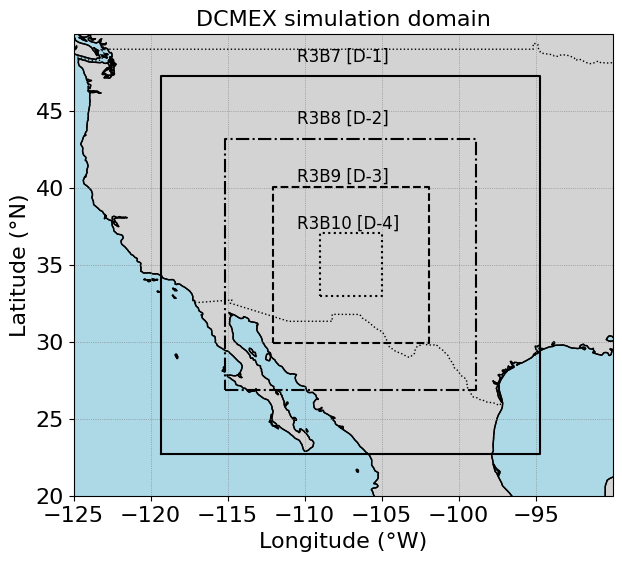

In [2]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from cartopy.mpl.geoaxes import GeoAxes
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
#from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# Define bounding boxes (in degrees)
lon1 = [np.rad2deg(-2.082353), np.rad2deg(-1.652943)];
lat1 = [np.rad2deg(0.3967664), np.rad2deg(0.824777)];

lon2 = [np.rad2deg(-2.0096), np.rad2deg(-1.725414)];
lat2 = [np.rad2deg(0.4688776), np.rad2deg(0.752984)];

lon3 = [np.rad2deg(-1.955971), np.rad2deg(-1.779007)];
lat3 = [np.rad2deg(0.52241), np.rad2deg(0.6993262)];

lon4 = [np.rad2deg(-1.902997), np.rad2deg(-1.831995)];
lat4 = [np.rad2deg(0.5753667), np.rad2deg(0.6463902)];

#lon1[0] = -1*lon1[0]
#lon1[1] = -1*lon1[1]

#lon2[0] = -1*lon2[0]
#lon2[1] = -1*lon2[1]

#lon3[0] = -1*lon3[0]
#lon3[1] = -1*lon3[1]

#lon4[0] = -1*lon4[0]
#lon4[1] = -1*lon4[1]

#print(lon1, lat1)
#print(lon2, lat2)
#print(lon3, lat3)
#print(lon4, lat4)

fontsize = 12
proj = ccrs.PlateCarree()

plt.style.use('default')
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1, projection=proj)

# Plot base map
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

# Plot bounding boxes
for lon, lat, style in zip(
    [lon1, lon2, lon3, lon4],
    [lat1, lat2, lat3, lat4],
    ['-', '-.', '--', ':']
):
    ax.plot([lon[0], lon[1], lon[1], lon[0], lon[0]],
            [lat[0], lat[0], lat[1], lat[1], lat[0]],
            color='black', linewidth=1.5, linestyle=style, transform=proj)

#ax.text(106.5, 48.2, "R3B7 [D-1]", transform=ccrs.PlateCarree(), fontsize=fontsize-1, ha='center', color='k')#, fontweight='bold')
#ax.text(106.5, 44.2, "R3B8 [D-2]", transform=ccrs.PlateCarree(), fontsize=fontsize-1, ha='center', color='k')#, fontweight='bold')
#ax.text(106.5, 40.2, "R3B9 [D-3]", transform=ccrs.PlateCarree(), fontsize=fontsize-1, ha='center', color='k')#, fontweight='bold')
#ax.text(106.5, 37.2, "R3B10 [D-4]", transform=ccrs.PlateCarree(), fontsize=fontsize-1, ha='center', color='k')#, fontweight='bold')

#ax.set_xlim(125., 85.)
#ax.set_ylim(15., 55.)
#ax.set_xticks(range(90, 125, 5))  
#ax.set_yticks(range(15, 55, 5))
#ax.tick_params(axis='x', labelsize=fontsize)
#ax.tick_params(axis='y', labelsize=fontsize)
#ax.set_xlabel("Longitude (°W)", fontsize=fontsize)
#ax.set_ylabel("Latitude (°N)", fontsize=fontsize)
#ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
#ax.set_title('DCMEX simulation domain', fontsize=fontsize)

# Labels
ax.text(-110.5, 48.2, "R3B7 [D-1]", transform=proj, fontsize=fontsize)
ax.text(-110.5, 44.2, "R3B8 [D-2]", transform=proj, fontsize=fontsize)
ax.text(-110.5, 40.4, "R3B9 [D-3]", transform=proj, fontsize=fontsize)
ax.text(-110.5, 37.4, "R3B10 [D-4]", transform=proj, fontsize=fontsize)

# Map limits
ax.set_xlim(-125., -90.)
ax.set_ylim(20., 50.)
ax.set_xticks(range(-125, -90, 5))  
ax.set_yticks(range(20, 50, 5))
ax.tick_params(axis='both', labelsize=fontsize+4)
ax.set_xlabel("Longitude (°W)", fontsize=fontsize+4)
ax.set_ylabel("Latitude (°N)", fontsize=fontsize+4)
ax.set_title('DCMEX simulation domain', fontsize=fontsize+4)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')


plt.show()


In [3]:


#ds_nosip = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/nosip/dcmex_2mom_nosip/NWP_*.nc');
#ds_4sip = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/control/dcmex_2mom_sip/NWP_*.nc');
#ds_nohm = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/nohm/dcmex_2mom_nohm/NWP_*.nc');
#ds_norf = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/norf/dcmex_2mom_norf/NWP_*.nc');
#ds_nobr = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/nobr/dcmex_2mom_nobr/NWP_*.nc');
#ds_nosb = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/nosb/dcmex_2mom_nosb/NWP_*.nc');


In [2]:


file_path='/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/sull_ds'
ds_4sip = xr.open_mfdataset(f'{file_path}/4sip/dcmex_2mom/NWP_*.nc', chunks={'time': 4, 'height': 10}, parallel=True);
ds_nosip = xr.open_mfdataset(f'{file_path}/nosip/dcmex_2mom/NWP_*.nc', chunks={'time': 4, 'height': 10}, parallel=True);


/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and 'types.GenericAlias'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and 'types.GenericAlias'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and 'types.GenericAlias'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and

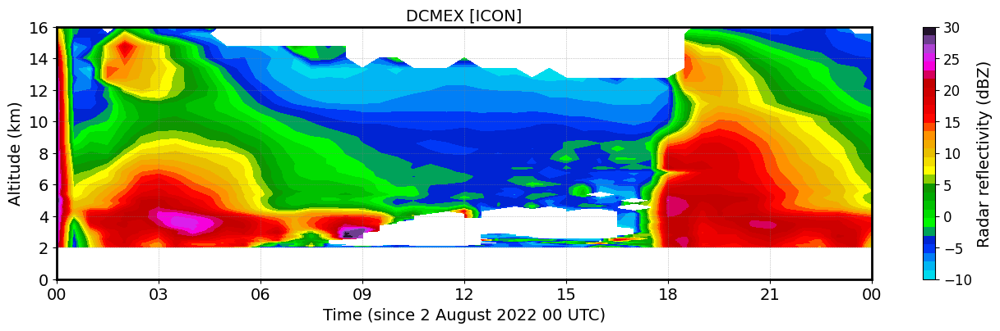

In [5]:

avg_ht = 1.e-3*ds_4sip.z_mc.mean(dim=('time','ncells'))
avg_refl_4sip = ds_4sip.dbz.where(ds_4sip.dbz > -10).mean(dim=('ncells'))

lnwdth = 3
fontsize = 14
lev = np.linspace(-10, 30, 30)

plt.figure(figsize=(16, 4))
contour = plt.contourf(ds_4sip.time, avg_ht, avg_refl_4sip.T, cmap='pyart_NWSRef', levels=lev)
colorbar = plt.colorbar(contour, ticks=[-10, -5, 0, 5, 10, 15, 20, 25, 30], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)

plt.xlabel('Time (since 2 August 2022 00 UTC)', fontsize=fontsize)


plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2022, 8, 2, 0, 0) 
end_date = datetime(2022, 8, 3, 0, 0)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX [ICON]', fontsize=fontsize)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')
    

plt.show()

In [3]:


file_path='/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/sull_ds'
grid_dcmex = xr.open_dataset(f'{file_path}/4sip/dcmex_2mom/domain4_DOM04.nc');

clon_deg = np.degrees(grid_dcmex.clon)
clat_deg = np.degrees(grid_dcmex.clat)

print(clon_deg.min().values); print(clon_deg.max().values);
print(clat_deg.min().values); print(clat_deg.max().values);

okla_x, okla_y = np.array([-107., 34.])
#print(okla_x), print(okla_y)
dx_deg = 0.4; dy_deg = 0.4
left_bound = okla_x - dx_deg
right_bound = okla_x + dx_deg
top_bound = okla_y + dy_deg
bottom_bound = okla_y - dy_deg

print(left_bound), print(right_bound)
print(top_bound), print(bottom_bound)

window_cell = (
    (grid_dcmex.clat >= np.deg2rad(bottom_bound))
    & (grid_dcmex.clat <= np.deg2rad(top_bound))
    & (grid_dcmex.clon >= np.deg2rad(left_bound))
    & (grid_dcmex.clon <= np.deg2rad(right_bound))
).values

(window_cell_indices,) = np.where(window_cell)

# select cells matching with the area of interest (windows_cell_indices:: matching to that with the area sampled by the aircraft)
window_vertex_indices = (np.unique(grid_dcmex.vertex_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_vertex_indices ::',window_vertex_indices)

# select edges matching with the area of interest (corresponding to the windows_cell_indices)
window_edge_indices = (np.unique(grid_dcmex.edge_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_edge_indices ::',window_edge_indices)

selected_indices = xr.Dataset(
    {
        "cell": ("cell", window_cell_indices),
        "vertex": ("vertex", window_vertex_indices),
        "edge": ("edge", window_edge_indices),
    }
)

vars_to_renumber = {
    "cell": [
        "adjacent_cell_of_edge",
        "cells_of_vertex",
        "neighbor_cell_index",
    ],
    "vertex": ["vertex_of_cell", "edge_vertices", "vertices_of_vertex"],
    "edge": ["edge_of_cell", "edges_of_vertex"],
}

def reindex_grid(grid, indices, vars_to_renumber):
    new_grid = grid.load().isel(
        cell=indices.cell, vertex=indices.vertex, edge=indices.edge
    )
    for dim, idx in indices.coords.items():
        renumbering = np.full(grid.dims[dim], -2, dtype="int")
        renumbering[idx] = np.arange(len(idx))
        for name in vars_to_renumber[dim]:
            new_grid[name].data = renumbering[new_grid[name].data - 1] + 1
    return new_grid

new_grid_dcmex = reindex_grid(grid_dcmex, selected_indices, vars_to_renumber)

mask=np.isin(ds_4sip['ncells'], selected_indices.cell)
mask_cell = mask
mask_ncells_dcmex = mask


-109.03369797063944
-104.96560387399306
32.96608133463784
37.035429759321914
-107.4
-106.6
34.4
33.6
window_vertex_indices :: [ 3601  3603  3691 ... 31347 31348 31349]
window_edge_indices :: [11231 11232 11233 ... 91282 91283 91284]


In [4]:

new_grid_dcmex = reindex_grid(grid_dcmex, selected_indices, vars_to_renumber)

mask=np.isin(ds_4sip['ncells'], selected_indices.cell)
mask_cell = mask
mask_ncells_dcmex = mask

In [5]:

ds_4sip['w_vel'] = -1.*ds_4sip.omega/(9.8*ds_4sip.rho)
ds_4sip['tempc'] = ds_4sip.temp-273.16;
ds_4sip['lwc_gperm3']  = ds_4sip.qc*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tqi'] = ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['tq'] = ds_4sip.qc+ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['ciwc_gperm3'] = ds_4sip.qi*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tiwc_gperm3'] = (ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh)*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['cdnc_percm3'] = ds_4sip.qnc*ds_4sip.rho*1.e-6  # perkg to percm3
ds_4sip['inc_perl'] = (ds_4sip.qni+ds_4sip.qns+ds_4sip.qng+ds_4sip.qnh)*ds_4sip.rho*1.e-3 # perkg to perl

ds_nosip['w_vel'] = -1.*ds_nosip.omega/(9.8*ds_nosip.rho)
ds_nosip['tempc'] = ds_nosip.temp-273.16;
ds_nosip['lwc_gperm3']  = ds_nosip.qc*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['tqi'] = ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh
ds_nosip['tq'] = ds_nosip.qc+ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh
ds_nosip['ciwc_gperm3'] = ds_nosip.qi*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['tiwc_gperm3'] = (ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh)*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['cdnc_percm3'] = ds_nosip.qnc*ds_nosip.rho*1.e-6  # perkg to percm3
ds_nosip['inc_perl'] = (ds_nosip.qni+ds_nosip.qns+ds_nosip.qng+ds_nosip.qnh)*ds_nosip.rho*1.e-3 # perkg to perl

ht_4sip_avg = 1.e-3*ds_4sip.z_mc.mean(dim=('time','ncells'))
tempc_4sip_avg = ds_4sip.tempc.mean(dim=('time','ncells'))

ht_nosip_avg = 1.e-3*ds_nosip.z_mc.mean(dim=('time','ncells'))
tempc_nosip_avg = ds_nosip.tempc.mean(dim=('time','ncells'))

In [6]:

aircraft_starttime='2022-08-02T15:00:00.000000000'
aircraft_endtime='2022-08-02T21:00:00.000000000'

ds_nosip_new = ds_nosip.sel(ncells=mask_ncells_dcmex, time=slice(aircraft_starttime, aircraft_endtime))
ds_4sip_new = ds_4sip.sel(ncells=mask_ncells_dcmex, time=slice(aircraft_starttime, aircraft_endtime))
#ds_norf_new = ds_norf.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))
#ds_nohm_new = ds_nohm.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))
#ds_nobr_new = ds_nobr.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))
#ds_nosb_new = ds_nosb.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))


In [7]:



w_thres = 2.

###### With SIP
# lwc gperm3
filt_lwc_up = xr.where((ds_4sip_new.lwc_gperm3 > 1.e-9) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.lwc_gperm3, np.nan)
filt_lwc_dn = xr.where((ds_4sip_new.lwc_gperm3 > 1.e-9) & (ds_4sip_new.w_vel < -1.*w_thres), ds_4sip_new.lwc_gperm3, np.nan)
filt_lwc_st = xr.where((ds_4sip_new.lwc_gperm3 > 1.e-9) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.lwc_gperm3, np.nan)

lwc_up_sip = filt_lwc_up.mean(dim=('time','ncells'))
lwc_dn_sip = filt_lwc_dn.mean(dim=('time','ncells'))
lwc_st_sip = filt_lwc_st.mean(dim=('time','ncells'))

tempc_sip = ds_4sip_new.tempc.mean(dim=('time','ncells'))

# iwc gperm3
filt_tiwc_up = xr.where((ds_4sip_new.tiwc_gperm3 > 1.e-6) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.tiwc_gperm3, np.nan)
filt_tiwc_dn = xr.where((ds_4sip_new.tiwc_gperm3 > 1.e-6) & (ds_4sip_new.w_vel < -1.*w_thres), ds_4sip_new.tiwc_gperm3, np.nan)
filt_tiwc_st = xr.where((ds_4sip_new.tiwc_gperm3 > 1.e-6) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.tiwc_gperm3, np.nan)

tiwc_up_sip = filt_tiwc_up.mean(dim=('time','ncells'))
tiwc_dn_sip = filt_tiwc_dn.mean(dim=('time','ncells'))
tiwc_st_sip = filt_tiwc_st.mean(dim=('time','ncells'))

# CDNC percm3
filt_cdnc_up = xr.where((ds_4sip_new.cdnc_percm3 > 1.e-6) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.cdnc_percm3, np.nan)
filt_cdnc_dn = xr.where((ds_4sip_new.cdnc_percm3 > 1.e-6) & (ds_4sip_new.w_vel < -1.*w_thres), ds_4sip_new.cdnc_percm3, np.nan)
filt_cdnc_st = xr.where((ds_4sip_new.cdnc_percm3 > 1.e-6) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.cdnc_percm3, np.nan)

cdnc_up_sip = filt_cdnc_up.mean(dim=('time','ncells'))
cdnc_dn_sip = filt_cdnc_dn.mean(dim=('time','ncells'))
cdnc_st_sip = filt_cdnc_st.mean(dim=('time','ncells'))


# inc gperm3
filt_inc_up = xr.where((ds_4sip_new.inc_perl > 1.e-6) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.inc_perl, np.nan)
filt_inc_dn = xr.where((ds_4sip_new.inc_perl > 1.e-6) & (ds_4sip_new.w_vel < -1.*w_thres), ds_4sip_new.inc_perl, np.nan)
filt_inc_st = xr.where((ds_4sip_new.inc_perl > 1.e-6) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.inc_perl, np.nan)

inc_up_sip = filt_inc_up.mean(dim=('time','ncells'))
inc_dn_sip = filt_inc_dn.mean(dim=('time','ncells'))
inc_st_sip = filt_inc_st.mean(dim=('time','ncells'))


In [8]:

####================== Boxplot of ICON-LWC [4-SIP]
w_thres = 2.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
lwc_sip_up_gperm3 = xr.where((ds_4sip_new.qc > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.lwc_gperm3, np.nan)
lwc_sip_dn_gperm3 = xr.where((ds_4sip_new.qc > thres_q) & (ds_4sip_new.w_vel > -1.*w_thres), ds_4sip_new.lwc_gperm3, np.nan)
lwc_sip_st_gperm3 = xr.where((ds_4sip_new.qc > thres_q) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.lwc_gperm3, np.nan)
tempc_sip = ds_4sip_new.tempc

lwc_sip_up_gperm3 = lwc_sip_up_gperm3.values.flatten()
lwc_sip_dn_gperm3 = lwc_sip_dn_gperm3.values.flatten()
lwc_sip_st_gperm3 = lwc_sip_st_gperm3.values.flatten()
tempc_sip = tempc_sip.values.flatten()

df_lwc_sip = pd.DataFrame({
    'lwc_up': lwc_sip_up_gperm3,
    'lwc_dn': lwc_sip_dn_gperm3,
    'lwc_st': lwc_sip_st_gperm3,
    'tempc': tempc_sip,
})

tempc_bin = np.arange(-50., 20., 5.)  # Temperature bins 
tempc_bin = np.sort(tempc_bin)

df_lwc_sip['temp_bin'] = np.digitize(df_lwc_sip['tempc'], bins=tempc_bin, right=False)

bin_edges = np.concatenate([tempc_bin - 2, [tempc_bin[-1] + 2]])  
df_lwc_sip['temp_bin'] = bin_edges[df_lwc_sip['temp_bin']]

df_lwc_up_sip = df_lwc_sip[['lwc_up', 'temp_bin']].dropna()
df_lwc_dn_sip = df_lwc_sip[['lwc_dn', 'temp_bin']].dropna()
df_lwc_st_sip = df_lwc_sip[['lwc_st', 'temp_bin']].dropna()

df_lwc_up_sip = df_lwc_up_sip.dropna(subset=['temp_bin'])
df_lwc_dn_sip = df_lwc_dn_sip.dropna(subset=['temp_bin'])
df_lwc_st_sip = df_lwc_st_sip.dropna(subset=['temp_bin'])

lwc_sip_up_by_bin = [df_lwc_up_sip[df_lwc_up_sip['temp_bin'] == temp]['lwc_up'].values for temp in bin_edges]
lwc_sip_dn_by_bin = [df_lwc_dn_sip[df_lwc_dn_sip['temp_bin'] == temp]['lwc_dn'].values for temp in bin_edges]
lwc_sip_st_by_bin = [df_lwc_st_sip[df_lwc_st_sip['temp_bin'] == temp]['lwc_st'].values for temp in bin_edges]


In [9]:

####================== Boxplot of ICON-CDNC [3-SIP]
w_thres = 2.
thres_q = 1.e-2
###### Without SIP
# lwc gperm3
cdnc_sip_up_percm3 = xr.where((ds_4sip_new.cdnc_percm3 > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.cdnc_percm3, np.nan)
cdnc_sip_dn_percm3 = xr.where((ds_4sip_new.cdnc_percm3 > thres_q) & (ds_4sip_new.w_vel > -1.*w_thres), ds_4sip_new.cdnc_percm3, np.nan)
cdnc_sip_st_percm3 = xr.where((ds_4sip_new.cdnc_percm3 > thres_q) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.cdnc_percm3, np.nan)
tempc_sip = ds_4sip_new.tempc

cdnc_sip_up_percm3 = cdnc_sip_up_percm3.values.flatten()
cdnc_sip_dn_percm3 = cdnc_sip_dn_percm3.values.flatten()
cdnc_sip_st_percm3 = cdnc_sip_st_percm3.values.flatten()
tempc_sip = tempc_sip.values.flatten()

df_cdnc_sip = pd.DataFrame({
    'cdnc_up': cdnc_sip_up_percm3,
    'cdnc_dn': cdnc_sip_dn_percm3,
    'cdnc_st': cdnc_sip_st_percm3,
    'tempc': tempc_sip,
})

tempc_bin = np.arange(-50., 20., 5.)  # Temperature bins 
tempc_bin = np.sort(tempc_bin)

df_cdnc_sip['temp_bin'] = np.digitize(df_cdnc_sip['tempc'], bins=tempc_bin, right=False)

bin_edges = np.concatenate([tempc_bin - 2, [tempc_bin[-1] + 2]])  
df_cdnc_sip['temp_bin'] = bin_edges[df_cdnc_sip['temp_bin']]

df_cdnc_up_sip = df_cdnc_sip[['cdnc_up', 'temp_bin']].dropna()
df_cdnc_dn_sip = df_cdnc_sip[['cdnc_dn', 'temp_bin']].dropna()
df_cdnc_st_sip = df_cdnc_sip[['cdnc_st', 'temp_bin']].dropna()

df_cdnc_up_sip = df_cdnc_up_sip.dropna(subset=['temp_bin'])
df_cdnc_dn_sip = df_cdnc_dn_sip.dropna(subset=['temp_bin'])
df_cdnc_st_sip = df_cdnc_st_sip.dropna(subset=['temp_bin'])

cdnc_sip_up_by_bin = [df_cdnc_up_sip[df_cdnc_up_sip['temp_bin'] == temp]['cdnc_up'].values for temp in bin_edges]
cdnc_sip_dn_by_bin = [df_cdnc_dn_sip[df_cdnc_dn_sip['temp_bin'] == temp]['cdnc_dn'].values for temp in bin_edges]
cdnc_sip_st_by_bin = [df_cdnc_st_sip[df_cdnc_st_sip['temp_bin'] == temp]['cdnc_st'].values for temp in bin_edges]


In [10]:

####================== Boxplot of ICON-IWC [3-SIP]
w_thres = 2.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
iwc_sip_up_gperm3 = xr.where((ds_4sip_new.tqi > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.tiwc_gperm3, np.nan)
iwc_sip_dn_gperm3 = xr.where((ds_4sip_new.tqi > thres_q) & (ds_4sip_new.w_vel > -1.*w_thres), ds_4sip_new.tiwc_gperm3, np.nan)
iwc_sip_st_gperm3 = xr.where((ds_4sip_new.tqi > thres_q) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.tiwc_gperm3, np.nan)
tempc_sip = ds_4sip_new.tempc

iwc_sip_up_gperm3 = iwc_sip_up_gperm3.values.flatten()
iwc_sip_dn_gperm3 = iwc_sip_dn_gperm3.values.flatten()
iwc_sip_st_gperm3 = iwc_sip_st_gperm3.values.flatten()
tempc_sip = tempc_sip.values.flatten()

df_iwc_sip = pd.DataFrame({
    'iwc_up': iwc_sip_up_gperm3,
    'iwc_dn': iwc_sip_dn_gperm3,
    'iwc_st': iwc_sip_st_gperm3,
    'tempc': tempc_sip,
})

tempc_bin = np.arange(-50., 20., 5.)  # Temperature bins 
tempc_bin = np.sort(tempc_bin)

df_iwc_sip['temp_bin'] = np.digitize(df_iwc_sip['tempc'], bins=tempc_bin, right=False)

bin_edges = np.concatenate([tempc_bin - 2, [tempc_bin[-1] + 2]])  
df_iwc_sip['temp_bin'] = bin_edges[df_iwc_sip['temp_bin']]

df_iwc_up_sip = df_iwc_sip[['iwc_up', 'temp_bin']].dropna()
df_iwc_dn_sip = df_iwc_sip[['iwc_dn', 'temp_bin']].dropna()
df_iwc_st_sip = df_iwc_sip[['iwc_st', 'temp_bin']].dropna()

df_iwc_up_sip = df_iwc_up_sip.dropna(subset=['temp_bin'])
df_iwc_dn_sip = df_iwc_dn_sip.dropna(subset=['temp_bin'])
df_iwc_st_sip = df_iwc_st_sip.dropna(subset=['temp_bin'])

iwc_sip_up_by_bin = [df_iwc_up_sip[df_iwc_up_sip['temp_bin'] == temp]['iwc_up'].values for temp in bin_edges]
iwc_sip_dn_by_bin = [df_iwc_dn_sip[df_iwc_dn_sip['temp_bin'] == temp]['iwc_dn'].values for temp in bin_edges]
iwc_sip_st_by_bin = [df_iwc_st_sip[df_iwc_st_sip['temp_bin'] == temp]['iwc_st'].values for temp in bin_edges]


In [11]:

####================== Boxplot of ICON-INC [3-SIP]
w_thres = 1.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
inc_sip_up_perl = xr.where((ds_4sip_new.inc_perl > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.inc_perl, np.nan)
inc_sip_dn_perl = xr.where((ds_4sip_new.inc_perl > thres_q) & (ds_4sip_new.w_vel > -1.*w_thres), ds_4sip_new.inc_perl, np.nan)
inc_sip_st_perl = xr.where((ds_4sip_new.inc_perl > thres_q) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.inc_perl, np.nan)

#inc_sip_up_perl = xr.where((ds_4sip_new.tqi > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.inc_perl, np.nan)
#inc_sip_dn_perl = xr.where((ds_4sip_new.tqi > thres_q) & (ds_4sip_new.w_vel > -1.*w_thres), ds_4sip_new.inc_perl, np.nan)
#inc_sip_st_perl = xr.where((ds_4sip_new.tqi > thres_q) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.inc_perl, np.nan)
tempc_sip = ds_4sip_new.tempc

inc_sip_up_perl = inc_sip_up_perl.values.flatten()
inc_sip_dn_perl = inc_sip_dn_perl.values.flatten()
inc_sip_st_perl = inc_sip_st_perl.values.flatten()
tempc_sip = tempc_sip.values.flatten()

df_inc_sip = pd.DataFrame({
    'inc_up': inc_sip_up_perl,
    'inc_dn': inc_sip_dn_perl,
    'inc_st': inc_sip_st_perl,
    'tempc': tempc_sip,
})

tempc_bin = np.arange(-50., 20., 5.)  # Temperature bins 
tempc_bin = np.sort(tempc_bin)

df_inc_sip['temp_bin'] = np.digitize(df_inc_sip['tempc'], bins=tempc_bin, right=False)

bin_edges = np.concatenate([tempc_bin - 2, [tempc_bin[-1] + 2]])  
df_inc_sip['temp_bin'] = bin_edges[df_inc_sip['temp_bin']]

df_inc_up_sip = df_inc_sip[['inc_up', 'temp_bin']].dropna()
df_inc_dn_sip = df_inc_sip[['inc_dn', 'temp_bin']].dropna()
df_inc_st_sip = df_inc_sip[['inc_st', 'temp_bin']].dropna()

df_inc_up_sip = df_inc_up_sip.dropna(subset=['temp_bin'])
df_inc_dn_sip = df_inc_dn_sip.dropna(subset=['temp_bin'])
df_inc_st_sip = df_inc_st_sip.dropna(subset=['temp_bin'])

inc_sip_up_by_bin = [df_inc_up_sip[df_inc_up_sip['temp_bin'] == temp]['inc_up'].values for temp in bin_edges]
inc_sip_dn_by_bin = [df_inc_dn_sip[df_inc_dn_sip['temp_bin'] == temp]['inc_dn'].values for temp in bin_edges]
inc_sip_st_by_bin = [df_inc_st_sip[df_inc_st_sip['temp_bin'] == temp]['inc_st'].values for temp in bin_edges]


In [12]:


file = open('/work/bb1163/b382718/output/dcmex/observations/airborne_inp/02_INP_data_teflon.csv'); 

data_teflon_inp = pd.read_csv('/work/bb1163/b382718/output/dcmex/observations/airborne_inp/02_INP_data_teflon.csv');
data_polycar_inp = pd.read_csv('/work/bb1163/b382718/output/dcmex/observations/airborne_inp/03_INP_data_polycarbonate.csv');

#print(data_teflon_inp)
sample_tef = data_teflon_inp['Sample'];
drop_freeze_tef_temp_degC = data_teflon_inp['Droplet freezing temp'];
fract_frozen = data_teflon_inp['Fraction frozen'];
teflon_inp_perl = data_teflon_inp['INP(L-1)'];
upper_error_inp = data_teflon_inp['INP upper error bar'];
lower_error_inp = data_teflon_inp['INP lower error bar'];

sample_polycar = data_polycar_inp['Sample'];
drop_freeze_polycar_temp_degC = data_polycar_inp['Droplet freezing temp'];
fract_frozen = data_polycar_inp['Fraction frozen'];
polycar_inp_perl = data_polycar_inp['INP(L-1)'];
polycar_upper_error_inp = data_polycar_inp['INP upper error bar'];
polycar_lower_error_inp = data_polycar_inp['INP lower error bar'];


In [13]:


temp_bin = [0., -2., -4., -6., -8., -10., -12., -14., -16., -18., -20., -22., -24., -26., -28., -30., -32., -34., -36.];

mean_tef_inp_perl = []; tef_inp_med = []; tef_inp_std_dev = [];
for i in range(len(temp_bin)-1):
    mask = (drop_freeze_tef_temp_degC >= temp_bin[i+1]) & (drop_freeze_tef_temp_degC < temp_bin[i])
    mean_tef_inp_perl.append(np.mean(teflon_inp_perl[mask]))
    tef_inp_med.append(np.nanmedian(mean_tef_inp_perl))
    tef_inp_std_dev.append(np.nanstd(mean_tef_inp_perl))


# Calculate statistics
tef_inp_std_err = tef_inp_std_dev/np.sqrt(len(mean_tef_inp_perl))

mean_polycar_inp_perl = []; polycar_inp_med = []; polycar_inp_std_dev = [];
for i in range(len(temp_bin)-1):
    mask = (drop_freeze_polycar_temp_degC >= temp_bin[i+1]) & (drop_freeze_polycar_temp_degC < temp_bin[i])
    mean_polycar_inp_perl.append(np.mean(polycar_inp_perl[mask]))
    polycar_inp_med.append(np.nanmedian(mean_polycar_inp_perl))
    polycar_inp_std_dev.append(np.nanstd(mean_polycar_inp_perl))


# Calculate statistics
tef_inp_std_err = tef_inp_std_dev/np.sqrt(len(mean_tef_inp_perl))


In [ ]:
import h5py

# Open the NetCDF file using h5py
with h5py.File('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v601_r0_c310.nc', 'r') as f:
    # Print all group names in the file
    print(f.visititems(lambda name, obj: print(name)))

In [19]:
####################### Aircraft observation analysis #######################
import netCDF4

data_faam_core_cld_phy_latlon = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v602_r1_c310.nc');
data_faam_core_cld_phy = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v503_r1_c310.nc')
#print(data_faam_core.time)

time_faam_core_cld_phy = data_faam_core_cld_phy['Time'];
lon_faam_core_cld_phy = data_faam_core_cld_phy_latlon['longitude'];
lat_faam_core_cld_phy = data_faam_core_cld_phy_latlon['latitude'];
alt_faam_core_cld_phy = data_faam_core_cld_phy_latlon['altitude'];
#cdp_conc_faam_core_cld_phy = data_faam_core_cld_phy['cdp_conc'];
#print(time_faam_core)
print('')
data_faam_hvps = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/man-hvps_faam_20220802_v001_r0_c310.nc');
data_faam_cpi  = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/man-cpi_faam_20220802_v001_c310.nc');
data_faam_2ds  = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/man-2ds_faam_20220802_v001_r0_c310.nc')
data_faam_core = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core_faam_20220802_v005_r0_c310.nc');

data_faam_nevrozov = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/metoffice-nevzorov_faam_20220802_r0_c310_1hz.nc');
data_faam_core_1hz = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core_faam_20220802_v005_r0_c310_1hz.nc');


time = pd.to_datetime(data_faam_cpi['time'].values)
new_time = time.map(lambda t: t.replace(year=2022,day=2))
data_faam_cpi['time'] = new_time

time_cpi = pd.to_datetime(data_faam_cpi['time'].values)

# Set the nanoseconds part to zero (resetting microseconds/nanoseconds to 0)
new_time = time_cpi.map(lambda t: t.replace(microsecond=0, nanosecond=0))

# Update the time coordinate in the DataArray
data_faam_cpi['time'] = new_time


In [26]:
data_faam_nevrozov

<xarray.Dataset> Size: 788kB
Dimensions:  (Time: 16421)
Coordinates:
  * Time     (Time) datetime64[ns] 131kB 2022-08-02T15:26:00 ... 2022-08-02T1...
    LAT_GIN  (Time) float32 66kB ...
    LON_GIN  (Time) float32 66kB ...
Data variables:
    ALT_GIN  (Time) float32 66kB ...
    WTWC     (Time) float32 66kB ...
    WLWC1    (Time) float32 66kB ...
    WLWC2    (Time) float32 66kB ...
    IWC1     (Time) float32 66kB ...
    LWC1     (Time) float32 66kB ...
    IWC2     (Time) float32 66kB ...
    LWC2     (Time) float32 66kB ...
Attributes: (12/39)
    Conventions:                           CF-1.7
    title:                                 Nevzorov bulk water content data
    institution:                           Met Office
    comment:                               Nevzorov data are processed to cor...
    source:                                DECADES data system on FAAM BAe-14...
    featureType:                           trajectory
    ...                                    ...
    geospatial_lon_min:                    -107.494
    geospatial_lon_units:                  degree_east
    geospatial_vertical_max:               8687.399
    geospatial_vertical_min:               1612.1057
    geospatial_vertical_units:             m
    geospatial_vertical_positive:          up

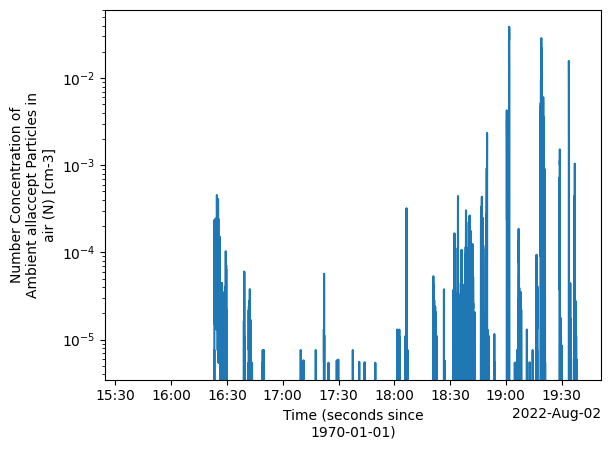

In [20]:
plt.style.use('default')
data_faam_hvps.total_number_concentration_of_ambient_allaccept_particles_in_air.plot()
plt.yscale('log')

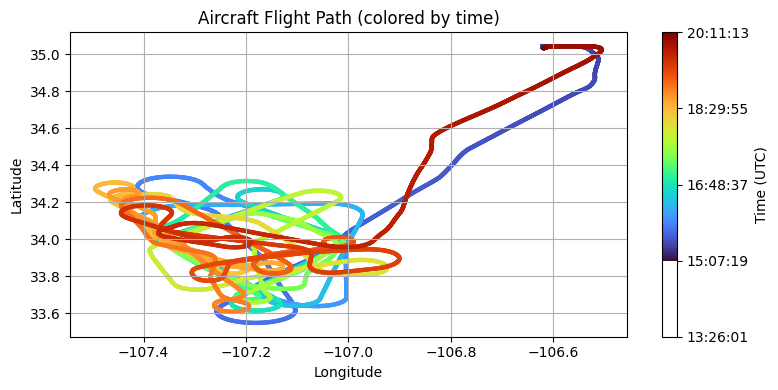

In [21]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd

# Load data (already done in your snippet)
# data_faam_core_cld_phy_latlon = xr.open_dataset('...')
# data_faam_core_cld_phy = xr.open_dataset('...')

# Extract variables
time = pd.to_datetime(data_faam_core_cld_phy['Time'].values)  # convert to datetime if needed
lon = data_faam_core_cld_phy_latlon['longitude'].values
lat = data_faam_core_cld_phy_latlon['latitude'].values

# Plot setup
plt.style.use('default')
fig, ax = plt.subplots(figsize=(8, 4))


# Use scatter with time as color
sc = ax.scatter(lon, lat, c=mdates.date2num(time), cmap='turbo', s=10, edgecolor='none')

# Add a colorbar with time ticks
cbar = plt.colorbar(sc, ax=ax, orientation='vertical')
cbar.set_label('Time (UTC)')
tick_locs = np.linspace(mdates.date2num(time[0]), mdates.date2num(time[-1]), num=5)
cbar.set_ticks(tick_locs)
cbar.set_ticklabels([pd.to_datetime(mdates.num2date(t)).strftime('%H:%M:%S') for t in tick_locs])

# Labeling
ax.set_title('Aircraft Flight Path (colored by time)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.grid(True)

plt.tight_layout()
plt.show()


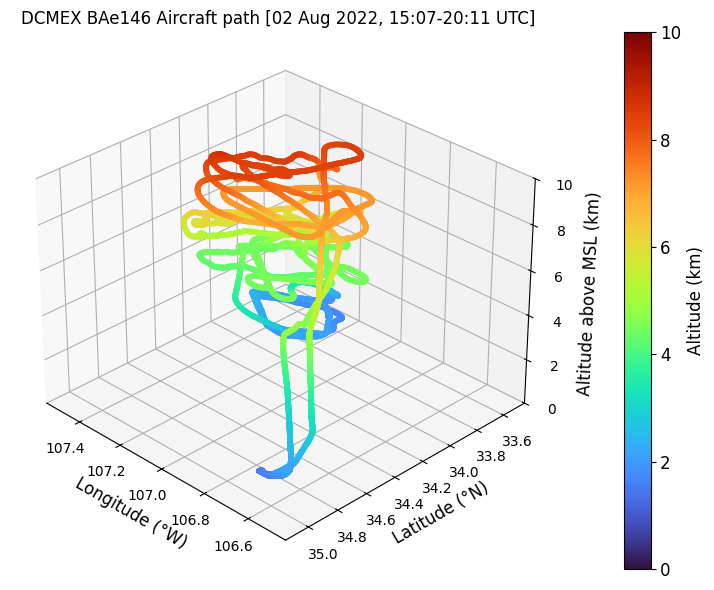

In [8]:
import xarray as xr
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

data_faam_core_cld_phy_latlon = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v602_r1_c310.nc');
data_faam_core_cld_phy = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v503_r1_c310.nc')
#print(data_faam_core.time)

time_faam_core_cld_phy = data_faam_core_cld_phy['Time'];
lon_faam_core_cld_phy = data_faam_core_cld_phy_latlon['longitude'];
lat_faam_core_cld_phy = data_faam_core_cld_phy_latlon['latitude'];
alt_faam_core_cld_phy = data_faam_core_cld_phy_latlon['altitude'];

# Extract and prepare data
time = pd.to_datetime(data_faam_core_cld_phy['Time'].values)
mean_lon = data_faam_core_cld_phy_latlon['longitude'].values
mean_lat = data_faam_core_cld_phy_latlon['latitude'].values
mean_alt = data_faam_core_cld_phy_latlon['altitude'].values / 1000.0  # Convert to km


fnt = 12
lnw = 3
# 3D scatter plot
fig = plt.figure(figsize=(8, 6))
plt.style.use('default')
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with altitude as color
sc = ax.scatter(-1*mean_lon, mean_lat, mean_alt, c=mean_alt, cmap='turbo', s=10, vmin=0, vmax=10)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, ticks=[0, 2, 4, 6, 8, 10], pad=0.1)
cbar.set_label('Altitude (km)', fontsize=fnt)
cbar.ax.tick_params(labelsize=fnt)

# Axis labels
#ax.set_ylim(33,35)
#ax.set_xlim(-105,-107)
ax.set_zlim(0,10)
ax.set_xlabel('Longitude (°W)', fontsize=fnt)
ax.set_ylabel('Latitude (°N)', fontsize=fnt)
ax.set_zlabel('Altitude above MSL (km)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt-2)
ax.tick_params(axis='y', labelsize=fnt-2)
ax.tick_params(axis='z', labelsize=fnt-2)
ax.set_title('DCMEX BAe146 Aircraft path [02 Aug 2022, 15:07-20:11 UTC]', fontsize=fnt)

# Optional: rotate view
ax.view_init(elev=30, azim=135)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')
    
plt.tight_layout()
plt.show()


## Surface Precipitation 

In [8]:
fpath='/work/bk1415/b382718/output/dcmex/observations/precip_imerg_data'

ds_imerg_precip = xr.open_mfdataset(f"{fpath}/3B-HHR-L.MS.MRG*.nc4");
datetime_index = ds_imerg_precip.indexes['time'].to_datetimeindex()
ds_imerg_precip['time'] = datetime_index

#print(ds_imerg_precip.time.values)

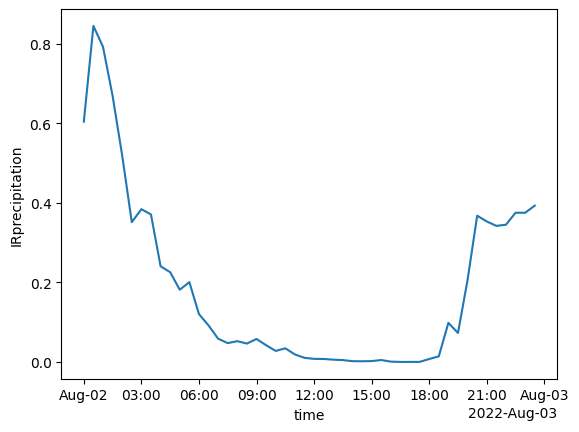

In [23]:
ds_imerg_precip.IRprecipitation.mean(dim=('lon', 'lat')).plot()

In [59]:
print(ds_imerg_precip.lon.min(), ds_imerg_precip.lon.max())
print(ds_imerg_precip.lat.min(), ds_imerg_precip.lat.max())

<xarray.DataArray 'lon' ()> Size: 4B
array(-114.95, dtype=float32) <xarray.DataArray 'lon' ()> Size: 4B
array(-102.45, dtype=float32)
<xarray.DataArray 'lat' ()> Size: 4B
array(31.65, dtype=float32) <xarray.DataArray 'lat' ()> Size: 4B
array(37.45, dtype=float32)


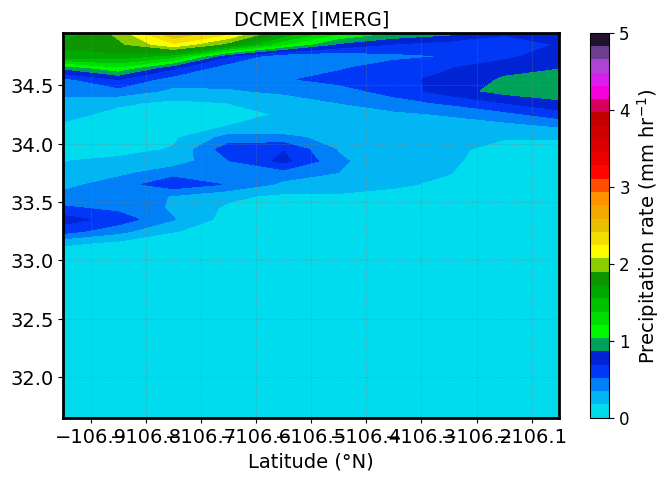

In [61]:

from matplotlib.colors import ListedColormap

fpath='/work/bk1415/b382718/output/dcmex/observations/precip_imerg_data'

ds_imerg_precip = xr.open_mfdataset(f"{fpath}/3B-HHR-L.MS.MRG*.nc4");
datetime_index = ds_imerg_precip.indexes['time'].to_datetimeindex()
ds_imerg_precip['time'] = datetime_index

# the region corresponding to the B200 aircraft
-107.4
-106.6
34.4
33.6
lon_min, lon_max = -107., -106. 
lat_min, lat_max = 31., 35.

# Apply the condition to select data within the desired region
ds_imerg_precip = ds_imerg_precip.where(
    (ds_imerg_precip.lon >= lon_min) & (ds_imerg_precip.lon <= lon_max) &
    (ds_imerg_precip.lat >= lat_min) & (ds_imerg_precip.lat <= lat_max), 
    drop=True  # Drop values outside the region
)


#avg_refl_obs = xr.where(ds_refl_obs.dbzc > -10., ds_refl_obs.dbzc, np.nan) #.mean(dim=('ncells'))

#avg_refl_obs = avg_refl_obs.mean(dim=('time','alt'))

avg_precip_obs = ds_imerg_precip.IRprecipitation; #.mean('time')
#avg_precip_obs = avg_precip_obs.where(avg_precip_obs <= 0., avg_precip_obs, np.nan)

colors = ['cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod', 
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']
cmap = ListedColormap(colors)

lnwdth = 3
fontsize = 14
lev = np.linspace(0, 5, 30)

plt.figure(figsize=(8, 5))

#plt.subplot(1,2,1)
contour = plt.contourf(ds_imerg_precip.lon, ds_imerg_precip.lat, avg_precip_obs.mean(dim=('time')).T, cmap='pyart_NWSRef', levels=lev)
colorbar = plt.colorbar(contour, ticks=[0, 1, 2, 3, 4, 5], label='Precipitation rate (mm hr$^{-1}$)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Precipitation rate (mm hr$^{-1}$)', size=fontsize)

plt.xlabel('Longitude (°W)', fontsize=fontsize)
plt.xlabel('Latitude (°N)', fontsize=fontsize)


#plt.xlim(75, 76)
#plt.ylim(17, 18)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX [IMERG]', fontsize=fontsize)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')

plt.show()

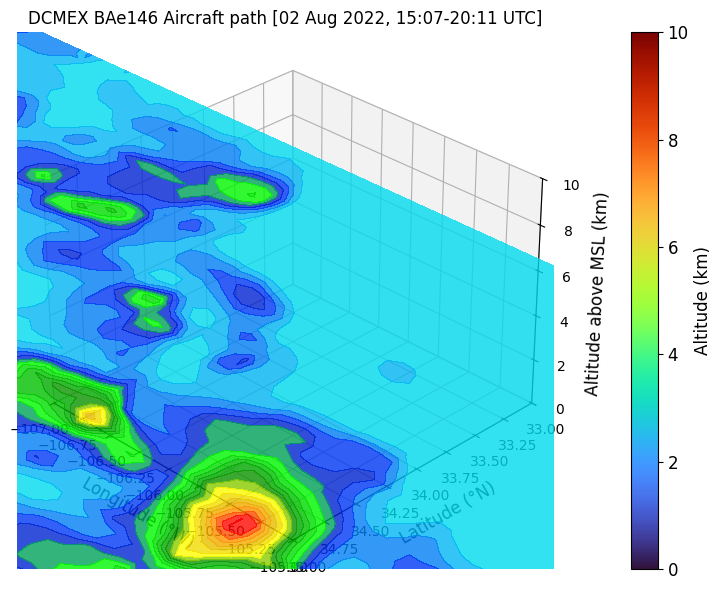

In [49]:
import xarray as xr
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

data_faam_core_cld_phy_latlon = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v602_r1_c310.nc');
data_faam_core_cld_phy = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v503_r1_c310.nc')
#print(data_faam_core.time)

time_faam_core_cld_phy = data_faam_core_cld_phy['Time'];
lon_faam_core_cld_phy = data_faam_core_cld_phy_latlon['longitude'];
lat_faam_core_cld_phy = data_faam_core_cld_phy_latlon['latitude'];
alt_faam_core_cld_phy = data_faam_core_cld_phy_latlon['altitude'];

# Extract and prepare data
time = pd.to_datetime(data_faam_core_cld_phy['Time'].values)
mean_lon = data_faam_core_cld_phy_latlon['longitude'].values
mean_lat = data_faam_core_cld_phy_latlon['latitude'].values
mean_alt = data_faam_core_cld_phy_latlon['altitude'].values / 1000.0  # Convert to km


fnt = 12
lnw = 3
# 3D scatter plot
fig = plt.figure(figsize=(8, 6))
plt.style.use('default')
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with altitude as color
sc = ax.scatter(-1*mean_lon, mean_lat, mean_alt, c=mean_alt, cmap='turbo', s=10, vmin=0, vmax=10)

#contour = ax.contourf(ds_imerg_precip.lon, ds_imerg_precip.lat, avg_precip_obs.mean(dim=('time')).T, cmap='pyart_NWSRef', levels=lev)
contour = ax.contourf(ds_imerg_precip.lon, ds_imerg_precip.lat, avg_precip_obs.mean(dim=('time')).T, 
                      cmap='pyart_NWSRef', levels=lev,
                     zdir='z', offset=0, alpha=0.8)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, ticks=[0, 2, 4, 6, 8, 10], pad=0.1)
cbar.set_label('Altitude (km)', fontsize=fnt)
cbar.ax.tick_params(labelsize=fnt)

# Axis labels
ax.set_ylim(33,35)
ax.set_xlim(-105,-107)
ax.set_zlim(0,10)
ax.set_xlabel('Longitude (°W)', fontsize=fnt)
ax.set_ylabel('Latitude (°N)', fontsize=fnt)
ax.set_zlabel('Altitude above MSL (km)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt-2)
ax.tick_params(axis='y', labelsize=fnt-2)
ax.tick_params(axis='z', labelsize=fnt-2)
ax.set_title('DCMEX BAe146 Aircraft path [02 Aug 2022, 15:07-20:11 UTC]', fontsize=fnt)

# Optional: rotate view
ax.view_init(elev=30, azim=135)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')
    
plt.tight_layout()
plt.show()


2025-11-17 10:43:12,777 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:45921
Traceback (most recent call last):
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/tornado/iostream.py", line 861, in _read_to_buffer
    bytes_read = self.read_from_fd(buf)
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/tornado/iostream.py", line 1116, in read_from_fd
    return self.socket.recv_into(buf, len(buf))
ConnectionResetError: [Errno 104] Connection reset by peer

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/distributed/worker.py", line 2056, in gather_dep
    response = await get_data_from_worker(
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/distributed/worker.py", line 2866, in get_data_from_worker
    response = await send_recv(
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/distributed

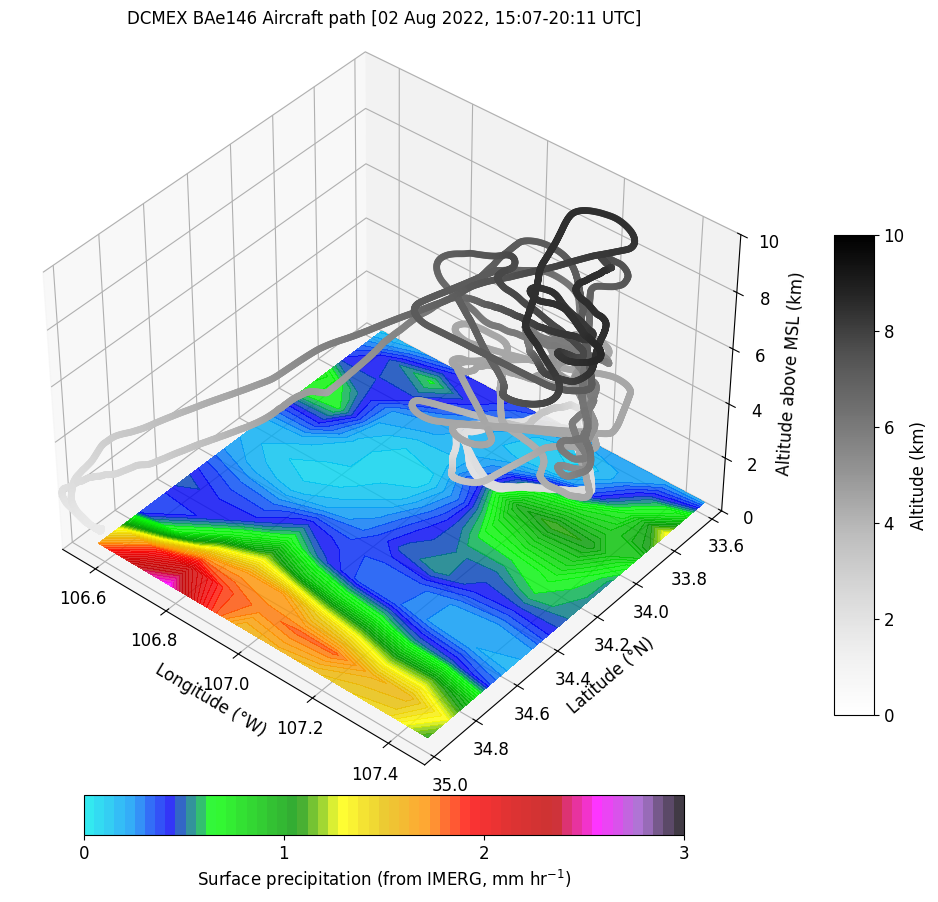

In [14]:
import xarray as xr
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd
from matplotlib.colors import ListedColormap

# Load aircraft data

data_faam_core_cld_phy_latlon = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v602_r1_c310.nc');
data_faam_core_cld_phy = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v503_r1_c310.nc')
#print(data_faam_core.time)

time_faam_core_cld_phy = data_faam_core_cld_phy['Time'];
lon_faam_core_cld_phy = data_faam_core_cld_phy_latlon['longitude'];
lat_faam_core_cld_phy = data_faam_core_cld_phy_latlon['latitude'];
alt_faam_core_cld_phy = data_faam_core_cld_phy_latlon['altitude'];

# Extract and prepare data
time = pd.to_datetime(data_faam_core_cld_phy['Time'].values)
mean_lon = data_faam_core_cld_phy_latlon['longitude'].values
mean_lat = data_faam_core_cld_phy_latlon['latitude'].values
mean_alt = data_faam_core_cld_phy_latlon['altitude'].values / 1000.0  # Convert to km


# Load precip data
fpath='/work/bk1415/b382718/output/dcmex/observations/precip_imerg_data'

ds_imerg_precip = xr.open_mfdataset(f"{fpath}/3B-HHR-L.MS.MRG*.nc4");
datetime_index = ds_imerg_precip.indexes['time'].to_datetimeindex()
ds_imerg_precip['time'] = datetime_index

# the region corresponding to the B200 aircraft
-107.4
-106.6
34.4
33.6
lon_min, lon_max = -107.5, -106.5 
lat_min, lat_max = 33.5, 35.5

lon_min, lon_max = np.nanmin(mean_lon), np.nanmax(mean_lon) 
lat_min, lat_max = np.nanmin(mean_lat), np.nanmax(mean_lat)

# Apply the condition to select data within the desired region
ds_imerg_precip = ds_imerg_precip.where(
    (ds_imerg_precip.lon >= lon_min) & (ds_imerg_precip.lon <= lon_max) &
    (ds_imerg_precip.lat >= lat_min) & (ds_imerg_precip.lat <= lat_max), 
    drop=True  # Drop values outside the region
)


# Create custom radar-like colormap
colors = ['cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 
          'yellow', 'gold', 'goldenrod', 'coral', 'orangered', 'red', 
          'lightcoral', 'magenta', 'darkorchid', 'pink']
radar_cmap = ListedColormap(colors)

# Get the coordinate arrays and data
#lon_coords = refl_2d.lon.values
#lat_coords = refl_2d.lat.values
#refl_values = refl_2d.values

# Create meshgrid
#LON, LAT = np.meshgrid(lon_coords, lat_coords)

# Create 3D plot
fnt = 12
plt.style.use('default')
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot radar reflectivity using contourf at z=0
# This is much simpler and more reliable
altitude_base = 0  # Ground level
levels = np.linspace(-10, 30, 30)
lev = np.linspace(0, 3, 60)

# Plot using contourf, which handles dimensions correctly
contour = ax.contourf(-1*ds_imerg_precip.lon, ds_imerg_precip.lat, ds_imerg_precip.IRprecipitation.mean(dim=('time')).T, 
                      cmap='pyart_NWSRef', levels=lev,
                     zdir='z', offset=0, alpha=0.8)
#contour = ax.contourf(ds_refl_obs.lon, ds_refl_obs.lat, refl_values, 
#                      levels=levels,
#                      cmap=radar_cmap,
#                      zdir='z', 
#                      offset=altitude_base,
#                      alpha=0.8)

# Plot aircraft track
sc = ax.scatter(-1*mean_lon, mean_lat, mean_alt, c=mean_alt, cmap='Greys', s=15, vmin=0, vmax=10)
#sc = ax.scatter(mean_lon, mean_lat, mean_alt, c=mean_alt, cmap='turbo', s=20, 
#                vmin=0, vmax=8, edgecolors='black', linewidth=0.5)

# Add colorbars
cbar_ax1 = fig.add_axes([0.95, 0.1, 0.04, 0.6])
cbar1 = plt.colorbar(sc, cax=cbar_ax1, ticks=[0, 2, 4, 6, 8, 10], pad=0.1, shrink=0.6, aspect=15)
cbar1.set_label('Altitude (km)', fontsize=fnt)
cbar1.ax.tick_params(labelsize=fnt)

# Create a second colorbar for reflectivity
cbar_ax2 = fig.add_axes([0.2, -0.05, 0.6, 0.05])  # [left, bottom, width, height]
cbar2 = plt.colorbar(contour, cax=cbar_ax2, ticks=[0, 1, 2, 3], 
                     orientation='horizontal',
                     label='Surface precipitation (mm hr$^{-1}$)', pad=0.15, shrink=0.6)

cbar2.ax.tick_params(labelsize=12)
cbar2.set_label(label='Surface precipitation (from IMERG, mm hr$^{-1}$)', size=fnt)

#cbar2 = plt.colorbar(contour, ax=ax, ticks=[-10, -5, 0, 5, 10, 15, 20, 25, 30], 
#                     pad=0.15, shrink=0.6, aspect=15)
#cbar2.set_label('Radar Reflectivity (dBZ)', fontsize=fnt)
#cbar2.ax.tick_params(labelsize=fnt)


# Set axis properties
#ax.set_xlim(lon_min, lon_max)
#ax.set_ylim(lat_min, lat_max)

ax.set_xlim(-1*np.nanmin(mean_lon), -1*np.nanmax(mean_lon))
ax.set_ylim(np.nanmin(mean_lat), np.nanmax(mean_lat))

ax.set_zlim(0, 10)
ax.set_xlabel('Longitude (°W)', fontsize=fnt)
ax.set_ylabel('Latitude (°N)', fontsize=fnt)
ax.set_zlabel('Altitude above MSL (km)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.tick_params(axis='z', labelsize=fnt)
ax.set_title('DCMEX BAe146 Aircraft path [02 Aug 2022, 15:07-20:11 UTC]', fontsize=fnt)

# Set view angle
#ax.view_init(elev=30, azim=135)
ax.view_init(elev=40, azim=130)

plt.grid(True, linestyle='-', linewidth=3, color='k', alpha=1)
cbar_ax1.grid(False)
cbar_ax2.grid(False)
#for lon in np.linspace(lon_min, lon_max, num=10):
#    ax.plot([lon]*2, [lat_min, lat_max], [0, 0], color='gray', linestyle=':', linewidth=0.8)
#for lat in np.linspace(lat_min, lat_max, num=10):
#    ax.plot([lon_min, lon_max], [lat]*2, [0, 0], color='gray', linestyle=':', linewidth=0.8)


plt.tight_layout()
plt.show()

In [79]:
np.nanmin(mean_lon)

np.float32(-107.494)

## Precipitation validation

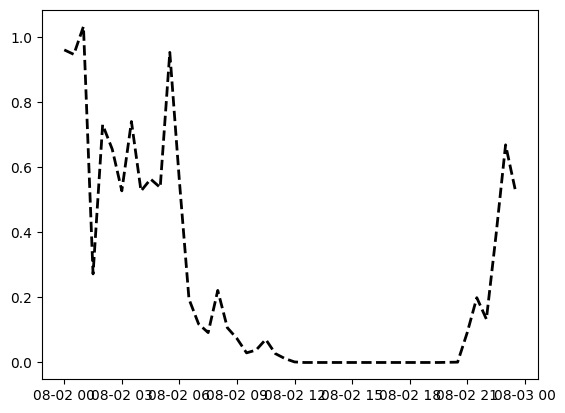

In [13]:
from matplotlib.colors import ListedColormap

plt.style.use('default')

fpath='/work/bk1415/b382718/output/dcmex/observations/precip_imerg_data'

ds_imerg_precip = xr.open_mfdataset(f"{fpath}/3B-HHR-L.MS.MRG*.nc4");
datetime_index = ds_imerg_precip.indexes['time'].to_datetimeindex()
ds_imerg_precip['time'] = datetime_index

# the region corresponding to the B200 aircraft
-107.4
-106.6
34.4
33.6
lon_min, lon_max = -107., -106. 
lat_min, lat_max = 31., 35.

# Apply the condition to select data within the desired region
ds_imerg_precip = ds_imerg_precip.where(
    (ds_imerg_precip.lon >= lon_min) & (ds_imerg_precip.lon <= lon_max) &
    (ds_imerg_precip.lat >= lat_min) & (ds_imerg_precip.lat <= lat_max), 
    drop=True  # Drop values outside the region
)

mean_precip_imerg = ds_imerg_precip.IRprecipitation.mean(dim=('lon','lat'))
mean_precip_imerg = mean_precip_imerg.values
ln=2
plt.plot(ds_imerg_precip.time, mean_precip_imerg, 'k--', linewidth=ln, label='Control (8 h spin-up)')

#ds_imerg_precip#.IRprecipitation.mean(dim=('lon','lat')).plot()
#plt.plot(ds_imerg_precip.time, ds_imerg_precip.IRprecipitation.mean(dim=('lon','lat')))
#plt.xlabel('Time (since 2 August 2022 00 UTC)', fontsize=fnt)
#plt.ylabel('Surface precipitation rate (mm h$^{-1}$)', fontsize=fnt)
#start_date = datetime(2022, 8, 2, 0, 0)  # Start at 00 UTC on 10 May 2011
#end_date = datetime(2022, 8, 3, 0, 0)
#plt.xlim(start_date, end_date)
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))

2025-11-18 08:44:30,537 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:38199
Traceback (most recent call last):
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/tornado/iostream.py", line 861, in _read_to_buffer
    bytes_read = self.read_from_fd(buf)
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/tornado/iostream.py", line 1116, in read_from_fd
    return self.socket.recv_into(buf, len(buf))
ConnectionResetError: [Errno 104] Connection reset by peer

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/distributed/worker.py", line 2056, in gather_dep
    response = await get_data_from_worker(
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/distributed/worker.py", line 2866, in get_data_from_worker
    response = await send_recv(
  File "/home/b/b382718/own_env/lib/python3.9/site-packages/distributed

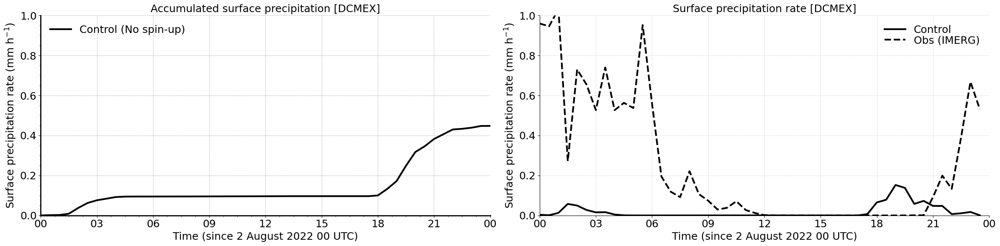

In [17]:


dt_hours = (ds_nosip.time.diff('time') / np.timedelta64(1, 'h'))


acc_precip_nosip = ds_nosip.tot_prec.mean('ncells')
acc_precip_4sip = ds_4sip.tot_prec.mean('ncells')
#acc_precip_4sip_long = ds_4sip_long.tot_prec.mean('ncells')

del_prec_nosip = ds_nosip.tot_prec.diff('time')
del_prec_4sip = ds_4sip.tot_prec.diff('time')
#del_prec_4sip_long = ds_4sip_long.tot_prec.diff('time')

precip_rate_nosip = del_prec_nosip/dt_hours #0.5    # output is over 30 min
precip_rate_4sip = del_prec_4sip/dt_hours #0.5
#precip_rate_4sip_long = del_prec_4sip_long/dt_hours


mean_precip_imerg = ds_imerg_precip.IRprecipitation.mean(dim=('lon','lat'))
mean_precip_imerg = mean_precip_imerg.values

fnt=18
ln = 3
plt.figure(figsize=(24, 6))
plt.style.use('default')
plt.subplot(1,2,1)
#plt.plot(ds_nosip.time, acc_precip_nosip, "-", color='r', label="No SIP", linewidth = ln)
plt.plot(ds_4sip.time, acc_precip_4sip, "k-", label="Control (No spin-up)", linewidth = ln)
#plt.plot(ds_4sip_long.time, acc_precip_4sip_long, "k--", label="Control (8 h spin-up)", linewidth = ln)

plt.grid(True, linestyle='--', color='grey', linewidth=0.5, alpha=0.8)
plt.minorticks_on()
plt.ylim(0, 1)
plt.xlabel('Time (since 2 August 2022 00 UTC)', fontsize=fnt)
plt.ylabel('Surface precipitation rate (mm h$^{-1}$)', fontsize=fnt)
start_date = datetime(2022, 8, 2, 0, 0)  # Start at 00 UTC on 10 May 2011
end_date = datetime(2022, 8, 3, 0, 0)
plt.xlim(start_date, end_date)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.title('Accumulated surface precipitation [DCMEX]', fontsize=fnt)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.2, fontsize=fnt, loc='upper left')#, ncol = 1, fontsize='16', bbox_to_anchor=(1.02, 1.02))
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
#plt.plot(ds_nosip.time[:-1], precip_rate_nosip.mean('ncells'), '-', color='r', linewidth=ln, label='No SIP')
plt.plot(ds_4sip.time[:-1], precip_rate_4sip.mean('ncells'), 'k-', linewidth=ln, label='Control')
plt.plot(ds_imerg_precip.time, mean_precip_imerg, 'k--', linewidth=ln, label='Obs (IMERG)')

plt.ylim(0, 1)
plt.xlabel('Time (since 2 August 2022 00 UTC)', fontsize=fnt)
plt.ylabel('Surface precipitation rate (mm h$^{-1}$)', fontsize=fnt)
start_date = datetime(2022, 8, 2, 0, 0)  # Start at 00 UTC on 10 May 2011
end_date = datetime(2022, 8, 3, 0, 0)
plt.xlim(start_date, end_date)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.title('Surface precipitation rate [DCMEX]', fontsize=fnt)
#plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['right'].set_linewidth(3)
plt.gca().spines['right'].set_linewidth(3)

plt.tight_layout()
plt.show()



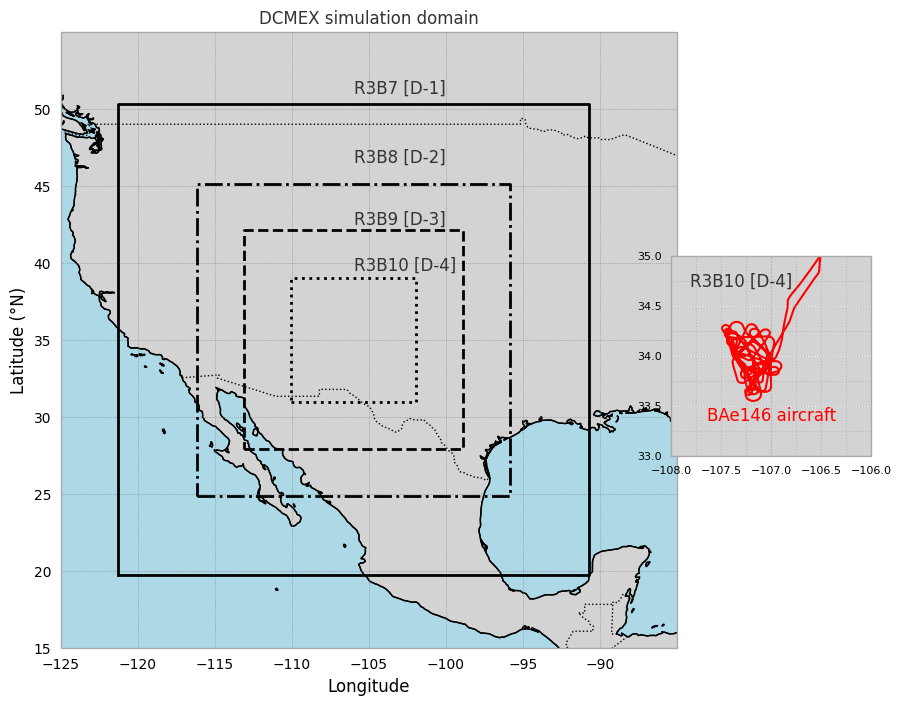

In [24]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from cartopy.mpl.geoaxes import GeoAxes
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
#from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# Define bounding boxes (in degrees)
lon1 = [np.rad2deg(-2.117163), np.rad2deg(-1.582617)];
lat1 = [np.rad2deg(0.3443675), np.rad2deg(0.8775246)];

lon2 = [np.rad2deg(-2.027213), np.rad2deg(-1.672835)];
lat2 = [np.rad2deg(0.4339893), np.rad2deg(0.78789)];

lon3 = [np.rad2deg(-1.973857), np.rad2deg(-1.726188)];
lat3 = [np.rad2deg(0.4871754), np.rad2deg(0.7346672)];

lon4 = [np.rad2deg(-1.920478), np.rad2deg(-1.779626)];
lat4 = [np.rad2deg(0.5404571), np.rad2deg(0.6812963)];

fontsize = 12
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(1, 1, 1, projection=proj)

# Plot base map
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

# Plot bounding boxes
for lon, lat, style in zip(
    [lon1, lon2, lon3, lon4],
    [lat1, lat2, lat3, lat4],
    ['-', '-.', '--', ':']
):
    ax.plot([lon[0], lon[1], lon[1], lon[0], lon[0]],
            [lat[0], lat[0], lat[1], lat[1], lat[0]],
            color='black', linewidth=2, linestyle=style, transform=proj)


# Labels
ax.text(-106, 51, "R3B7 [D-1]", transform=proj, fontsize=fontsize)
ax.text(-106, 46.5, "R3B8 [D-2]", transform=proj, fontsize=fontsize)
ax.text(-106, 42.5, "R3B9 [D-3]", transform=proj, fontsize=fontsize)
ax.text(-106, 39.5, "R3B10 [D-4]", transform=proj, fontsize=fontsize)

# Map limits
ax.set_xlim(-125., -85.)
ax.set_ylim(15., 55.)
ax.set_xticks(range(-125, -85, 5))  
ax.set_yticks(range(15, 55, 5))
ax.set_xlabel("Longitude", fontsize=fontsize)
ax.set_ylabel("Latitude (°N)", fontsize=fontsize)
ax.set_title('DCMEX simulation domain', fontsize=fontsize)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')

# === Create inset axes === #
inset_position = [0.65, 0.35, 0.30, 0.25]  # [left, bottom, width, height] in figure coordinates
inset_ax = fig.add_axes(inset_position, projection=proj)
inset_ax.set_extent([-108, -106, 33, 35], crs=proj)
inset_ax.coastlines(resolution='50m')
inset_ax.add_feature(cfeature.LAND, facecolor='lightgray')
inset_ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
inset_ax.gridlines(draw_labels=False, linestyle=':')


# Aircraft track in inset
inset_ax.plot(lon_faam_core_cld_phy, lat_faam_core_cld_phy, 'r-', transform=proj)

inset_ax.plot([-107, -106, -106, -107, -107],
              [33, 33, 35, 35, 33],
              color='black', linewidth=1, linestyle=':', alpha=0.1, transform=proj)

inset_ax.text(-107.3, 34.75, 'R3B10 [D-4]', transform=proj, 
              fontsize=fontsize, ha='center', va='center', 
              bbox=dict(facecolor='none', edgecolor='none', alpha=0.7))

gl = inset_ax.gridlines(draw_labels=False, linestyle=':', color='grey', alpha=0.5)
gl.top_labels = False
gl.right_labels = False
#gl.xlabel_style = {'size': 10}
#gl.ylabel_style = {'size': 10}
inset_ax.set_xticks(np.linspace(-108, -106, 5), crs=proj)
inset_ax.set_yticks(np.linspace(33, 35, 5), crs=proj)
inset_ax.tick_params(axis='both', which='major', labelsize=8)

# --- Radar marker in zoomed inset ---
inset_ax.text(-107, 33.35, 'BAe146 aircraft', transform=proj, fontsize=fontsize, ha='center', color='red')

plt.show()


In [23]:

import matplotlib.patches as mpatches

# Validating total ice number concentrations

file_cip = '/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/core-cloud-phy_faam_20220802_v602_r1_c310.nc'
ds_cip15 = xr.open_mfdataset(file_cip, group='cip_15/processed');
ds_cip100 = xr.open_mfdataset(file_cip, group='cip_100/processed');

ds_cip15['cip15_conc_bin_perl'] = ds_cip15['cip15_iwc_psd'].where(ds_cip15['cip15_iwc_psd'] != 0, np.nan)
ds_cip100['cip100_conc_bin_perl'] = ds_cip100['cip100_iwc_psd'].where(ds_cip100['cip100_iwc_psd'] != 0, np.nan)

# sum over all diameter bins
ds_cip15['tot_cip15_perl'] = ds_cip15.cip15_conc_bin_perl.sum(dim=('cip15_bin_centre'))
ds_cip100['tot_cip100_perl'] = ds_cip100.cip100_conc_bin_perl.sum(dim=('cip100_bin_centre'))

# merge cip100 and cip15
ds_cip_new = xr.merge([ds_cip15, ds_cip100])

# total cip concentrations
ds_cip_new['tot_inc_perl'] = ds_cip15['tot_cip15_perl']+ds_cip100['tot_cip100_perl']

# Need to extract temperature from core data
data_faam_core_1hz_new = data_faam_core_1hz

# ds_cip has 'time' and data_faam_core_1hz has 'Time', make it the same
data_faam_core_1hz_new = data_faam_core_1hz_new.rename({'Time': 'time'})

# CIP ice concentrations in updraft, downdraft and stratiform regions 
data_faam_core_1hz_new['tempc'] = data_faam_core_1hz_new['TAT_DI_R']-273.16
ds_cip_new['TAT_DI_R'] = data_faam_core_1hz_new['TAT_DI_R']
ds_cip_new['W_C'] = data_faam_core_1hz_new['W_C']
ds_cip_new['tempc'] = ds_cip_new['TAT_DI_R']-273.16

thres_q = 1.e-4
# create conditions
thres_n = 0.
filt_cip15_up_cond = (ds_cip_new.tot_cip15_perl > thres_q) & (ds_cip_new.W_C > 1.)
filt_cip15_dn_cond = (ds_cip_new.tot_cip15_perl > thres_q) & (ds_cip_new.W_C < 1.)
filt_cip15_st_cond = (ds_cip_new.tot_cip15_perl > thres_q) & (np.abs(ds_cip_new.W_C) < 1.)

filt_cip100_up_cond = (ds_cip_new.tot_cip100_perl > thres_q) & (ds_cip_new.W_C > 1.)
filt_cip100_dn_cond = (ds_cip_new.tot_cip100_perl > thres_q) & (ds_cip_new.W_C < 1.)
filt_cip100_st_cond = (ds_cip_new.tot_cip100_perl > thres_q) & (np.abs(ds_cip_new.W_C) < 1.)

filt_totcip_up_cond = (ds_cip_new.tot_inc_perl > thres_q) & (ds_cip_new.W_C > 1.)
filt_totcip_dn_cond = (ds_cip_new.tot_inc_perl > thres_q) & (ds_cip_new.W_C < -1.)
filt_totcip_st_cond = (ds_cip_new.tot_inc_perl > thres_q) & (np.abs(ds_cip_new.W_C) < 1.)

# store variables
ds_cip_new['tot_cip15_up_perl'] = xr.where(filt_cip15_up_cond, ds_cip_new.tot_cip15_perl, np.nan)
ds_cip_new['tot_cip15_dn_perl'] = xr.where(filt_cip15_dn_cond, ds_cip_new.tot_cip15_perl, np.nan)
ds_cip_new['tot_cip15_st_perl'] = xr.where(filt_cip15_st_cond, ds_cip_new.tot_cip15_perl, np.nan)

ds_cip_new['tot_cip100_up_perl'] = xr.where(filt_cip100_up_cond, ds_cip_new.tot_cip100_perl, np.nan)
ds_cip_new['tot_cip100_dn_perl'] = xr.where(filt_cip100_dn_cond, ds_cip_new.tot_cip100_perl, np.nan)
ds_cip_new['tot_cip100_st_perl'] = xr.where(filt_cip100_st_cond, ds_cip_new.tot_cip100_perl, np.nan)

ds_cip_new['tot_inc_up_perl'] = xr.where(filt_totcip_up_cond, ds_cip_new.tot_inc_perl, np.nan)
ds_cip_new['tot_inc_dn_perl'] = xr.where(filt_totcip_dn_cond, ds_cip_new.tot_inc_perl, np.nan)
ds_cip_new['tot_inc_st_perl'] = xr.where(filt_totcip_st_cond, ds_cip_new.tot_inc_perl, np.nan)

# Define temperature bins
#temp_cip_bin = np.array([0., -3., -6., -9., -12., -15., -18., -21., -24., -27., -30.])
temp_cip_bin = np.arange(-25, 10, 5)
temp_cip_bin = np.sort(temp_cip_bin)

bin_cip_edges = np.concatenate([temp_cip_bin - 2, [temp_cip_bin[-1] + 2]])  # Adjust to cover the temperature range


tempc_values = ds_cip_new['tempc'].values
nan_mask = np.isnan(tempc_values)

valid_tempc_values = tempc_values[~nan_mask]

# which temperature bin each 'ds_cip_new.tempc' value belongs to?
temp_bins_indices = np.digitize(valid_tempc_values, bins=np.append(temp_cip_bin, np.inf)) - 1
temp_bins_indices = np.clip(temp_bins_indices, 0, len(temp_cip_bin) - 1)

# assign temp_bin to temp_bin_labels
temp_bin_labels = temp_cip_bin[temp_bins_indices]
temp_bin_labels_full = np.full_like(tempc_values, np.nan)
temp_bin_labels_full[~nan_mask] = temp_bin_labels

time_coord = ds_cip_new['tempc'].coords['time']
ds_cip_new['temp_cip_bin'] = xr.DataArray(temp_bin_labels_full, coords={'time': time_coord}, dims=['time'])

#df_up_cip = ds_cip_new[['tot_inc_up_perl', 'temp_cip_bin']].to_dataframe().dropna()
#df_dn_cip = ds_cip_new[['tot_inc_dn_perl', 'temp_cip_bin']].to_dataframe().dropna()
#df_st_cip = ds_cip_new[['tot_inc_st_perl', 'temp_cip_bin']].to_dataframe().dropna()

df_up_cip = ds_cip_new[['tot_cip100_up_perl', 'temp_cip_bin']].to_dataframe().dropna()
df_dn_cip = ds_cip_new[['tot_cip100_dn_perl', 'temp_cip_bin']].to_dataframe().dropna()
df_st_cip = ds_cip_new[['tot_cip100_st_perl', 'temp_cip_bin']].to_dataframe().dropna()

df_up_cip = df_up_cip.dropna(subset=['temp_cip_bin'])
df_dn_cip = df_dn_cip.dropna(subset=['temp_cip_bin'])
df_st_cip = df_st_cip.dropna(subset=['temp_cip_bin'])

# Sort the data by bin
#inc_cip_up_by_bin = [df_up_cip[df_up_cip['temp_cip_bin'] == temp]['tot_inc_up_perl'].values for temp in temp_cip_bin]
#inc_cip_dn_by_bin = [df_dn_cip[df_dn_cip['temp_cip_bin'] == temp]['tot_inc_dn_perl'].values for temp in temp_cip_bin]
#inc_cip_st_by_bin = [df_st_cip[df_st_cip['temp_cip_bin'] == temp]['tot_inc_st_perl'].values for temp in temp_cip_bin]

inc_cip_up_by_bin = [df_up_cip[df_up_cip['temp_cip_bin'] == temp]['tot_cip100_up_perl'].values for temp in temp_cip_bin]
inc_cip_dn_by_bin = [df_dn_cip[df_dn_cip['temp_cip_bin'] == temp]['tot_cip100_dn_perl'].values for temp in temp_cip_bin]
inc_cip_st_by_bin = [df_st_cip[df_st_cip['temp_cip_bin'] == temp]['tot_cip100_st_perl'].values for temp in temp_cip_bin]


In [11]:
ds_cip15

<xarray.Dataset> Size: 25MB
Dimensions:              (time: 24313, cip15_bin_centre: 64)
Dimensions without coordinates: time, cip15_bin_centre
Data variables:
    cip15_lwc_psd        (time, cip15_bin_centre) float32 6MB dask.array<chunksize=(24313, 64), meta=np.ndarray>
    cip15_lwc_dbz        (time) float32 97kB dask.array<chunksize=(24313,), meta=np.ndarray>
    cip15_iwc_psd        (time, cip15_bin_centre) float32 6MB dask.array<chunksize=(24313, 64), meta=np.ndarray>
    cip15_iwc_dbz        (time) float32 97kB dask.array<chunksize=(24313,), meta=np.ndarray>
    cip15_edge_psd       (time, cip15_bin_centre) float32 6MB dask.array<chunksize=(24313, 64), meta=np.ndarray>
    cip15_rain_rate      (time) float32 97kB dask.array<chunksize=(24313,), meta=np.ndarray>
    cip15_conc_bin_perl  (time, cip15_bin_centre) float32 6MB dask.array<chunksize=(24313, 64), meta=np.ndarray>
    tot_cip15_perl       (time) float32 97kB dask.array<chunksize=(24313,), meta=np.ndarray>
Attributes:
    notes:    Data in processed_group should be considered a best first guess...

In [ ]:
import xarray as xr

# Condition: tempc between -6 and -5
condition = (ds_cip_new.tempc > 0) & (ds_cip_new.tempc < 4)

# Apply the condition to tempc
filtered_tempc = ds_cip_new.tempc.where(condition, drop=True)

# Get the corresponding time values
filtered_time = ds_cip_new.time.sel({dim: filtered_tempc[dim] for dim in filtered_tempc.dims if dim in ds_cip_new.time.dims})

# Print results
for t, temp in zip(filtered_time.values, filtered_tempc.values):
    print(f"Time: {t}, TempC: {temp}")


In [ ]:
### For CIP100 images
Time: 2022-08-02T19:18:46.000000000, TempC: -4.828887939453125
Time: 2022-08-02T18:49:55.000000000, TempC: -7.698211669921875

### For CIP15 images
Time: 2022-08-02T19:19:14.000000000, TempC: -5.35675048828125
Time: 2022-08-02T19:19:15.000000000, TempC: -5.6463623046875
Time: 2022-08-02T19:19:16.000000000, TempC: -5.6939697265625
Time: 2022-08-02T19:19:17.000000000, TempC: -5.696502685546875
Time: 2022-08-02T19:19:18.000000000, TempC: -5.6732177734375
Time: 2022-08-02T19:20:14.000000000, TempC: -5.378204345703125
Time: 2022-08-02T19:20:15.000000000, TempC: -5.27691650390625
Time: 2022-08-02T19:20:16.000000000, TempC: -5.266693115234375
Time: 2022-08-02T19:08:04.000000000, TempC: -4.591217041015625

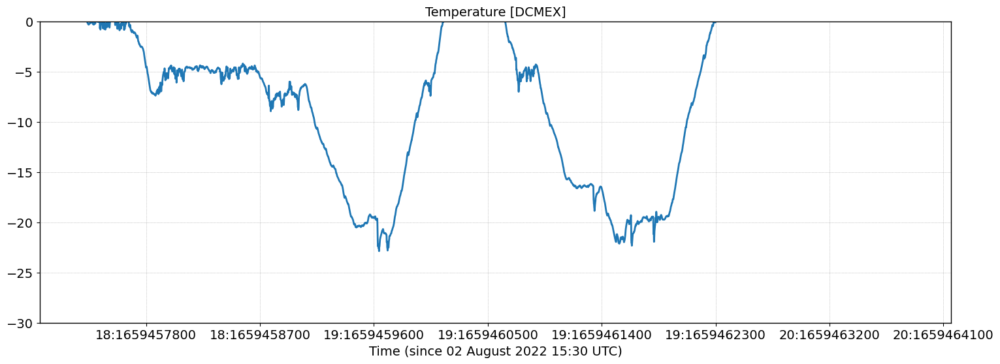

In [9]:

t1='2022-08-02T19:01:47.020000000' 
#ds_cip_new.sel(time=t1, method='nearest')

fnt=14
ln=2
plt.figure(figsize=(18,6))
plt.style.use('default')

plt.plot(ds_cip_new.time, ds_cip_new.tempc, linewidth=ln)

plt.xlabel('Time (since 02 August 2022 15:30 UTC)', fontsize=fnt)
#plt.ylim(0., 0.3)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%s'))
start_date = datetime(2022, 8, 2, 18, 16)  # Start at 00 UTC on 10 May 2011
end_date = datetime(2022, 8, 2, 20, 16)
plt.xlim(start_date, end_date)

plt.ylim(-30, 0)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.title('Temperature [DCMEX]', fontsize=fnt)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='upper left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)


for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
plt.show()

In [26]:

count_per_bin = df_up_cip.groupby('temp_cip_bin')['tot_cip100_up_perl'].count()

# Print the result
print(count_per_bin)

temp_cip_bin
-25.0    14
-20.0     9
-15.0     1
-10.0    24
-5.0      2
Name: tot_cip100_up_perl, dtype: int64


In [24]:

# for the operation below, see the ncdump -h mas-2ds_faam_20220802*.nc and emails by Blyth and Finney

twods = xr.Dataset({"time": ("time", pd.date_range("1970-01-01", periods=14604, freq="S"))})
attrs = {"description": "Adjusted time values", "source": "Generated by script"}

ts = xr.Dataset({"time": ("time", twods['time'].values + pd.Timedelta(1659454542.,unit='s'), attrs)})
twods['time'] = ts['time']

ds_2ds  = xr.open_mfdataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/man-2ds_faam_20220802_v001_r0_c310.nc', group='ch1')
ds_2ds['time'] = ts['time']

# Total ice concentrations
ds_2ds['tot_inc_perl'] = ds_2ds.total_number_concentration_of_ambient_MI_particles_in_air + ds_2ds.total_number_concentration_of_ambient_HI_particles_in_air


time_2ds = pd.to_datetime(ds_2ds['time'].values)
time_core = pd.to_datetime(data_faam_core_1hz_new['time'].values)

common_times = time_2ds[time_2ds.isin(time_core)]

# Now select data_faam_cpi where time is in common_times
ds_core_1hz_new = data_faam_core_1hz_new.sel(time=common_times)
ds_2ds_new = ds_2ds.sel(time=common_times)

#ds_2ds_new = xr.merge([ds_faam_1hz_2ds, ds_2ds])
ds_2ds_new['TAT_DI_R'] = ds_core_1hz_new['TAT_DI_R']
ds_2ds_new['W_C'] = ds_core_1hz_new['W_C']
ds_2ds_new['TAS'] = ds_core_1hz_new['TAS']
ds_2ds_new['tempc'] = ds_2ds_new['TAT_DI_R']-273.16

# As per Alan Blyth and Finney, UniLeeds (see emails)
ds_2ds_new['tot_inc_perl'] = ds_2ds_new['tot_inc_perl']*60./ds_2ds_new.TAS 

w_thres = 1.
# Profiles for the updrafts, downdrafts and stratiform regions
filt_tot2ds_up_cond = (ds_2ds_new.tot_inc_perl > 0.) & (ds_2ds_new.W_C > w_thres)
filt_tot2ds_dn_cond = (ds_2ds_new.tot_inc_perl > 0.) & (ds_2ds_new.W_C < -w_thres)
filt_tot2ds_st_cond = (ds_2ds_new.tot_inc_perl > 0.) & (np.abs(ds_2ds_new.W_C) < w_thres)

# store variables
ds_2ds_new['tot_inc_up_perl'] = xr.where(filt_tot2ds_up_cond, ds_2ds_new.tot_inc_perl, np.nan)
ds_2ds_new['tot_inc_dn_perl'] = xr.where(filt_tot2ds_dn_cond, ds_2ds_new.tot_inc_perl, np.nan)
ds_2ds_new['tot_inc_st_perl'] = xr.where(filt_tot2ds_st_cond, ds_2ds_new.tot_inc_perl, np.nan)

# Define temperature bins
#temp_2ds_bin = np.array([0., -3., -6., -9., -12., -15., -18., -21., -24., -27., -30.])
temp_2ds_bin = np.arange(-25, 10, 5)
temp_2ds_bin = np.sort(temp_2ds_bin)


bin_2ds_edges = np.concatenate([temp_2ds_bin - 2, [temp_2ds_bin[-1] + 2]])  # Adjust to cover the temperature range


tempc_values = ds_2ds_new['tempc'].values
nan_mask = np.isnan(tempc_values)

valid_tempc_values = tempc_values[~nan_mask]

# which temperature bin each 'ds_cip_new.tempc' value belongs to?
temp_bins_indices = np.digitize(valid_tempc_values, bins=np.append(temp_2ds_bin, np.inf)) - 1
temp_bins_indices = np.clip(temp_bins_indices, 0, len(temp_2ds_bin) - 1)

# assign temp_bin to temp_bin_labels
temp_bin_labels = temp_2ds_bin[temp_bins_indices]
temp_bin_labels_full = np.full_like(tempc_values, np.nan)
temp_bin_labels_full[~nan_mask] = temp_bin_labels

time_coord = ds_2ds_new['tempc'].coords['time']
ds_2ds_new['temp_2ds_bin'] = xr.DataArray(temp_bin_labels_full, coords={'time': time_coord}, dims=['time'])

df_up_2ds = ds_2ds_new[['tot_inc_up_perl', 'temp_2ds_bin']].to_dataframe().dropna()
df_dn_2ds = ds_2ds_new[['tot_inc_dn_perl', 'temp_2ds_bin']].to_dataframe().dropna()
df_st_2ds = ds_2ds_new[['tot_inc_st_perl', 'temp_2ds_bin']].to_dataframe().dropna()

df_up_2ds = df_up_2ds.dropna(subset=['temp_2ds_bin'])
df_dn_2ds = df_dn_2ds.dropna(subset=['temp_2ds_bin'])
df_st_2ds = df_st_2ds.dropna(subset=['temp_2ds_bin'])

# Sort the data by bin
inc_2ds_up_by_bin = [df_up_2ds[df_up_2ds['temp_2ds_bin'] == temp]['tot_inc_up_perl'].values for temp in temp_2ds_bin]
inc_2ds_dn_by_bin = [df_dn_2ds[df_dn_2ds['temp_2ds_bin'] == temp]['tot_inc_dn_perl'].values for temp in temp_2ds_bin]
inc_2ds_st_by_bin = [df_st_2ds[df_st_2ds['temp_2ds_bin'] == temp]['tot_inc_st_perl'].values for temp in temp_2ds_bin]


In [25]:

w_thres = 1.
filt_inc_up_perl = xr.where((ds_4sip_new.inc_perl > 1.e-6) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.inc_perl, np.nan)
filt_inc_dn_perl = xr.where((ds_4sip_new.inc_perl > 1.e-6) & (ds_4sip_new.w_vel < -w_thres), ds_4sip_new.inc_perl, np.nan)
filt_inc_st_perl = xr.where((ds_4sip_new.inc_perl > 1.e-6) & (np.abs(ds_4sip_new.w_vel) < w_thres), ds_4sip_new.inc_perl, np.nan)

tinc_up_2mom = filt_inc_up_perl.mean(dim=('time','ncells'))
tinc_dn_2mom = filt_inc_dn_perl.mean(dim=('time','ncells'))
tinc_st_2mom = filt_inc_st_perl.mean(dim=('time','ncells'))

tempc_2mom = ds_4sip_new.tempc.mean(dim=('time','ncells'))


In [29]:

print(len(inc_cip_up_by_bin), bin_cip_edges.shape)

7 (8,)


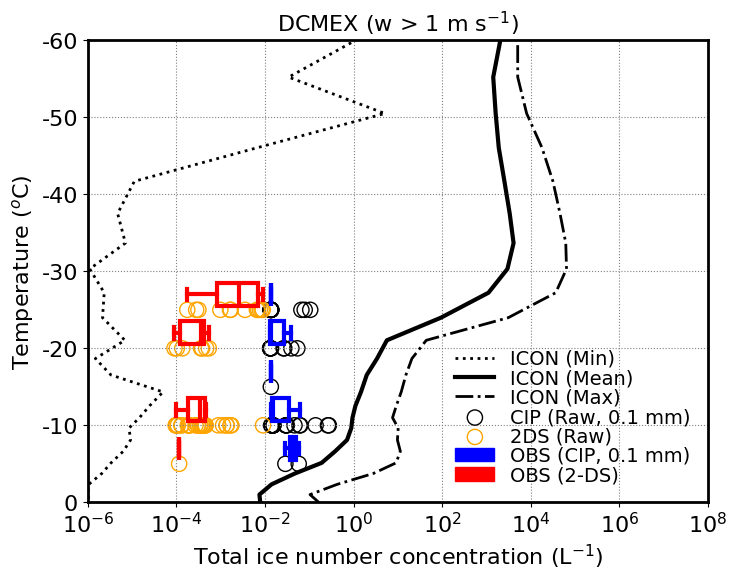

In [74]:


## ============== ICON
w_thres = 1.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
inc_4sip_up_perl = xr.where((ds_4sip_new.inc_perl > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.inc_perl, np.nan)
median_inc_4sip_up_perl = inc_4sip_up_perl.median(dim=('time','ncells'))
mean_inc_4sip_up_perl = inc_4sip_up_perl.mean(dim=('time','ncells'))
min_inc_4sip_up_perl = inc_4sip_up_perl.min(dim=('time','ncells'))
max_inc_4sip_up_perl = inc_4sip_up_perl.max(dim=('time','ncells'))
avg_4sip_tempc = ds_4sip_new.tempc.mean(dim=('time','ncells')) 

std_inc_4sip_up_perl = inc_4sip_up_perl.std(dim=('time', 'ncells'), skipna=True)
count_inc_4sip_up_perl = inc_4sip_up_perl.count(dim=('time', 'ncells'))
se_inc_4sip_up_perl = std_inc_4sip_up_perl / np.sqrt(count_inc_4sip_up_perl)


inc_nosip_up_perl = xr.where((ds_nosip_new.inc_perl > thres_q) & (ds_nosip_new.w_vel > w_thres), ds_nosip_new.inc_perl, np.nan)
median_inc_nosip_up_perl = inc_nosip_up_perl.median(dim=('time','ncells'))
mean_inc_nosip_up_perl = inc_nosip_up_perl.mean(dim=('time','ncells'))
min_inc_nosip_up_perl = inc_nosip_up_perl.min(dim=('time','ncells'))
max_inc_nosip_up_perl = inc_nosip_up_perl.max(dim=('time','ncells'))
avg_nosip_tempc = ds_nosip_new.tempc.mean(dim=('time','ncells')) 

std_inc_nosip_up_perl = inc_nosip_up_perl.std(dim=('time', 'ncells'), skipna=True)
count_inc_nosip_up_perl = inc_nosip_up_perl.count(dim=('time', 'ncells'))
se_inc_nosip_up_perl = std_inc_nosip_up_perl / np.sqrt(count_inc_nosip_up_perl)
## ================


fnt=16;
ln=3;
ln1=3;
ln2=1.;
al1=1.#0.4;
al2=1.#0.6;
al3=0.3
alpha=al2;
wd=3
fig, ax = plt.subplots(figsize=(8,6))
plt.style.use('default')

#ax.plot(median_inc_4sip_up_perl, avg_tempc, 'k--', linewidth=ln, label='ICON (Median)');
#ax.plot(mean_inc_nosip_up_perl, avg_nosip_tempc, 'k--', linewidth=ln, label='ICON (No SIP)');

ax.plot(min_inc_sip_up_perl, avg_tempc, 'k:', linewidth=ln-1, label='ICON (Min)');
ax.plot(mean_inc_4sip_up_perl, avg_4sip_tempc, 'k-', linewidth=ln, label='ICON (Mean)');
ax.plot(max_inc_sip_up_perl, avg_tempc, 'k-.', linewidth=ln-1, label='ICON (Max)');

#plt.errorbar(mean_inc_4sip_up_perl, avg_4sip_tempc.values, xerr=100*std_inc_4sip_up_perl,
#             fmt='none', ecolor='k', alpha=0.5, capsize=2)

#ax.fill_betweenx(avg_4sip_tempc.values,
#                 (mean_inc_4sip_up_perl - 0.2*std_inc_4sip_up_perl).values,
#                 (mean_inc_4sip_up_perl + 1*std_inc_4sip_up_perl).values,
#                 color='k', alpha=0.2, label='ICON $\pm$ 1 STD DEV')

#ax.fill_betweenx(avg_nosip_tempc.values,
#                 (mean_inc_nosip_up_perl - 0.25*std_inc_nosip_up_perl).values,
#                 (mean_inc_nosip_up_perl + 1*std_inc_nosip_up_perl).values,
#                 color='gray', alpha=0.2, label='ICON $\pm$ 1 STD DEV')

#ax.boxplot(inc_sip_up_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True, widths=wd,
#            boxprops=dict(facecolor='none', edgecolor='black', linewidth=ln2, alpha=al3),
#            medianprops=dict(color='black', linewidth=ln2),
#            whiskerprops=dict(linewidth=ln2, color='black', alpha=al3),
#            capprops=dict(linewidth=ln2, color='black', alpha=al3), showfliers=False);
           
ax.scatter(ds_cip_new['tot_cip100_up_perl'], ds_cip_new['temp_cip_bin'], marker='o', s=120, 
           facecolors='none', edgecolors='k', alpha=al1, label='CIP (Raw, 0.1 mm)')

ax.scatter(ds_2ds_new['tot_inc_up_perl'], ds_2ds_new['temp_2ds_bin'], marker='o', s=120, 
           facecolors='none', edgecolors='orange', alpha=al1, label='2DS (Raw)')

ax.boxplot(inc_cip_up_by_bin[:], positions=bin_cip_edges[:-1], vert=False, patch_artist=True, widths=wd,
           boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln1, alpha=al2),
           medianprops=dict(color='blue', linewidth=ln1),
           whiskerprops=dict(linewidth=ln1, color='blue', alpha=al2),
           capprops=dict(linewidth=ln1, color='blue', alpha=al2), showfliers=False)
        
ax.boxplot(inc_2ds_up_by_bin[:], positions=bin_2ds_edges[:-1], vert=False, patch_artist=True, widths=wd,
            boxprops=dict(facecolor='none', edgecolor='red', linewidth=ln1, alpha=al2),  
            medianprops=dict(color='red', linewidth=ln1), whiskerprops=dict(linewidth=ln1, color='red', alpha=al2),  
            capprops=dict(linewidth=ln1, color='red', alpha=al2), showfliers=False)

# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e-6, 1.e8)
#ax.set_xticks([1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
#ax.set_xticklabels([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6], fontsize=fontsize)

ax.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(0, -60)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([0, -10, -20, -30, -40, -50, -60])
ax.set_yticklabels(['0', '-10', '-20', '-30', '-40', '-50', '-60'], fontsize=fnt)


ax.set_title('DCMEX (w > 1 m s$^{-1}$)', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=alpha)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_cip_patch = mpatches.Patch(color='blue', label='OBS (CIP, 0.1 mm)')
obs_hvps_patch = mpatches.Patch(color='red', label='OBS (2-DS)')

#ax.legend(handles=handles + [obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', bbox_to_anchor=(1.05, 1), labelspacing=0.3, fontsize=fnt-2)
ax.legend(handles=handles + [obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', labelspacing=0.02, fontsize=fnt-2)


for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(2)
    ax.spines[spine].set_color('black')
plt.show()



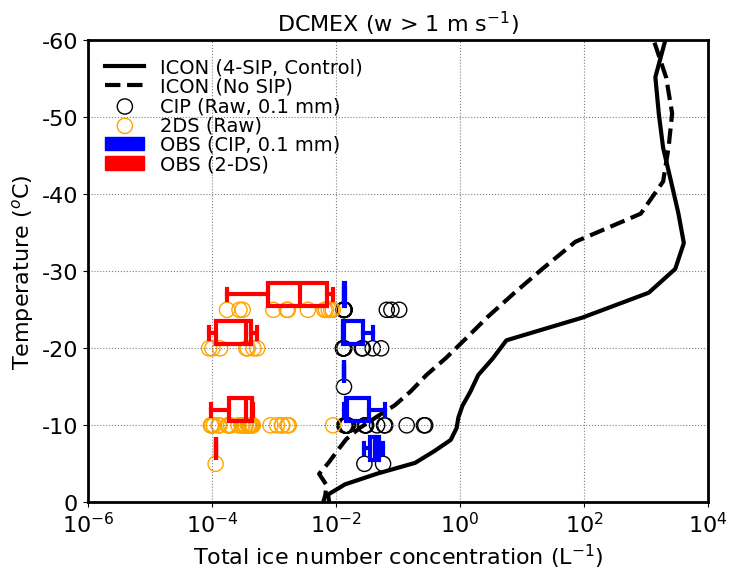

In [102]:


## ============== ICON
w_thres = 1.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
inc_4sip_up_perl = xr.where((ds_4sip_new.inc_perl > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.inc_perl, np.nan)
median_inc_4sip_up_perl = inc_4sip_up_perl.median(dim=('time','ncells'))
mean_inc_4sip_up_perl = inc_4sip_up_perl.mean(dim=('time','ncells'))
min_inc_4sip_up_perl = inc_4sip_up_perl.min(dim=('time','ncells'))
max_inc_4sip_up_perl = inc_4sip_up_perl.max(dim=('time','ncells'))
avg_4sip_tempc = ds_4sip_new.tempc.mean(dim=('time','ncells')) 

std_inc_4sip_up_perl = inc_4sip_up_perl.std(dim=('time', 'ncells'), skipna=True)
count_inc_4sip_up_perl = inc_4sip_up_perl.count(dim=('time', 'ncells'))
se_inc_4sip_up_perl = std_inc_4sip_up_perl / np.sqrt(count_inc_4sip_up_perl)


inc_nosip_up_perl = xr.where((ds_nosip_new.inc_perl > thres_q) & (ds_nosip_new.w_vel > w_thres), ds_nosip_new.inc_perl, np.nan)
median_inc_nosip_up_perl = inc_nosip_up_perl.median(dim=('time','ncells'))
mean_inc_nosip_up_perl = inc_nosip_up_perl.mean(dim=('time','ncells'))
min_inc_nosip_up_perl = inc_nosip_up_perl.min(dim=('time','ncells'))
max_inc_nosip_up_perl = inc_nosip_up_perl.max(dim=('time','ncells'))
avg_nosip_tempc = ds_nosip_new.tempc.mean(dim=('time','ncells')) 

std_inc_nosip_up_perl = inc_nosip_up_perl.std(dim=('time', 'ncells'), skipna=True)
count_inc_nosip_up_perl = inc_nosip_up_perl.count(dim=('time', 'ncells'))
se_inc_nosip_up_perl = std_inc_nosip_up_perl / np.sqrt(count_inc_nosip_up_perl)
## ================


fnt=16;
ln=3;
ln1=3;
ln2=1.;
al1=1.#0.4;
al2=1.#0.6;
al3=0.3
alpha=al2;
wd=3
fig, ax = plt.subplots(figsize=(8,6))
plt.style.use('default')

#ax.plot(median_inc_4sip_up_perl, avg_tempc, 'k--', linewidth=ln, label='ICON (Median)');
#ax.plot(min_inc_sip_up_perl, avg_tempc, 'k:', linewidth=ln-1, label='ICON (Min)');
ax.plot(mean_inc_4sip_up_perl, avg_4sip_tempc, 'k-', linewidth=ln, label='ICON (4-SIP, Control)');
#ax.plot(max_inc_sip_up_perl, avg_tempc, 'k-.', linewidth=ln-1, label='ICON (Max)');
ax.plot(mean_inc_nosip_up_perl, avg_nosip_tempc, 'k--', linewidth=ln, label='ICON (No SIP)');

#plt.errorbar(mean_inc_4sip_up_perl, avg_4sip_tempc.values, xerr=100*std_inc_4sip_up_perl,
#             fmt='none', ecolor='k', alpha=0.5, capsize=2)

#ax.fill_betweenx(avg_4sip_tempc.values,
#                 (mean_inc_4sip_up_perl - 0.2*std_inc_4sip_up_perl).values,
#                 (mean_inc_4sip_up_perl + 1*std_inc_4sip_up_perl).values,
#                 color='k', alpha=0.2, label='ICON $\pm$ 1 STD DEV')

#ax.fill_betweenx(avg_nosip_tempc.values,
#                 (mean_inc_nosip_up_perl - 0.25*std_inc_nosip_up_perl).values,
#                 (mean_inc_nosip_up_perl + 1*std_inc_nosip_up_perl).values,
#                 color='gray', alpha=0.2, label='ICON $\pm$ 1 STD DEV')

#ax.boxplot(inc_sip_up_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True, widths=wd,
#            boxprops=dict(facecolor='none', edgecolor='black', linewidth=ln2, alpha=al3),
#            medianprops=dict(color='black', linewidth=ln2),
#            whiskerprops=dict(linewidth=ln2, color='black', alpha=al3),
#            capprops=dict(linewidth=ln2, color='black', alpha=al3), showfliers=False);
           
ax.scatter(ds_cip_new['tot_cip100_up_perl'], ds_cip_new['temp_cip_bin'], marker='o', s=120, 
           facecolors='none', edgecolors='k', alpha=al1, label='CIP (Raw, 0.1 mm)')

ax.scatter(ds_2ds_new['tot_inc_up_perl'], ds_2ds_new['temp_2ds_bin'], marker='o', s=120, 
           facecolors='none', edgecolors='orange', alpha=al1, label='2DS (Raw)')

ax.boxplot(inc_cip_up_by_bin[:], positions=bin_cip_edges[:-1], vert=False, patch_artist=True, widths=wd,
           boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln1, alpha=al2),
           medianprops=dict(color='blue', linewidth=ln1),
           whiskerprops=dict(linewidth=ln1, color='blue', alpha=al2),
           capprops=dict(linewidth=ln1, color='blue', alpha=al2), showfliers=False)
        
ax.boxplot(inc_2ds_up_by_bin[:], positions=bin_2ds_edges[:-1], vert=False, patch_artist=True, widths=wd,
            boxprops=dict(facecolor='none', edgecolor='red', linewidth=ln1, alpha=al2),  
            medianprops=dict(color='red', linewidth=ln1), whiskerprops=dict(linewidth=ln1, color='red', alpha=al2),  
            capprops=dict(linewidth=ln1, color='red', alpha=al2), showfliers=False)

# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e-6, 1.e4)
#ax.set_xticks([1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
#ax.set_xticklabels([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6], fontsize=fontsize)

ax.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(0, -60)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([0, -10, -20, -30, -40, -50, -60])
ax.set_yticklabels(['0', '-10', '-20', '-30', '-40', '-50', '-60'], fontsize=fnt)


ax.set_title('DCMEX (w > 1 m s$^{-1}$)', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=alpha)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_cip_patch = mpatches.Patch(color='blue', label='OBS (CIP, 0.1 mm)')
obs_hvps_patch = mpatches.Patch(color='red', label='OBS (2-DS)')

#ax.legend(handles=handles + [obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', bbox_to_anchor=(1.05, 1), labelspacing=0.3, fontsize=fnt-2)
ax.legend(handles=handles + [obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', labelspacing=0.02, fontsize=fnt-2)


for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(2)
    ax.spines[spine].set_color('black')
plt.show()



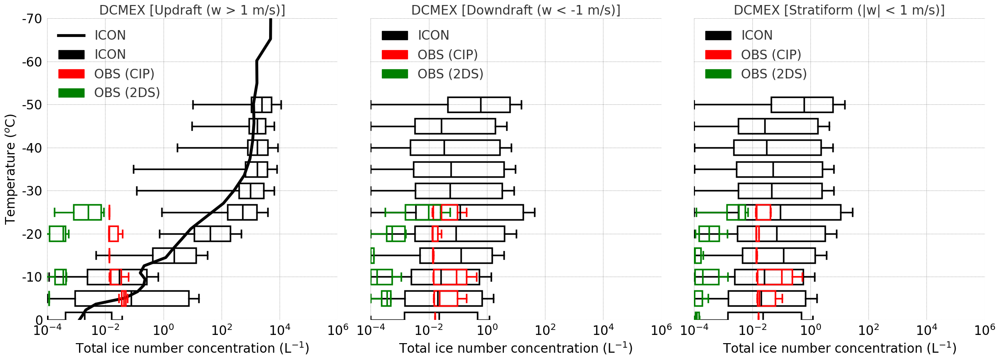

In [27]:

## ============== ICON
w_thres = 1.
thres_q = 1.e-4
###### Without SIP
# lwc gperm3
inc_sip_up_perl = xr.where((ds_4sip_new.inc_perl > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.inc_perl, np.nan)
avg_inc_sip_up_perl = inc_sip_up_perl.median(dim=('time','ncells'))
avg_tempc = ds_4sip_new.tempc.mean(dim=('time','ncells')) 

## ================

fontsize = 20;
linewidth = 2.5;
width=3.5;
alpha1=1;
alpha2=1.;

fig, axes = plt.subplots(1, 3, figsize=(22, 8), sharey=True)
plot_titles = ['DCMEX [Updraft (w > 1 m/s)]', 'DCMEX [Downdraft (w < -1 m/s)]', 'DCMEX [Stratiform (|w| < 1 m/s)]']

for i, ax in enumerate(axes):
    #temp_bins = temp_bins_list[i]
    #data_by_bin = data_list[i]

    # Plot ICON line if applicable (replace with actual values)
    if i == 0:
        #ax.plot(tinc_up_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        ax.plot(avg_inc_sip_up_perl, avg_tempc, 'k-', linewidth=linewidth+2, label='ICON')
        ax.boxplot(inc_sip_up_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),
                   medianprops=dict(color='black', linewidth=linewidth),
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(inc_cip_up_by_bin, positions=temp_cip_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)
        
        ax.boxplot(inc_2ds_up_by_bin, positions=temp_2ds_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='green', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='green', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='green', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='green', alpha=alpha2),
                   showfliers=False)
        
    elif i == 1:
        #ax.plot(tinc_dn_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        ax.boxplot(inc_sip_dn_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),
                   medianprops=dict(color='black', linewidth=linewidth),
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(inc_cip_dn_by_bin, positions=temp_cip_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)
        
        ax.boxplot(inc_2ds_dn_by_bin, positions=temp_2ds_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='green', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='green', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='green', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='green', alpha=alpha2),
                   showfliers=False)
        
    elif i == 2:
        #ax.plot(tinc_st_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        ax.boxplot(inc_sip_st_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),
                   medianprops=dict(color='black', linewidth=linewidth),
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(inc_cip_st_by_bin, positions=temp_cip_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)
        
        ax.boxplot(inc_2ds_st_by_bin, positions=temp_2ds_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='green', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='green', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='green', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='green', alpha=alpha2),
                   showfliers=False)

    ax.set_xscale('log')
    ax.set_xlim(1.e-4, 1.e6)
    ax.set_xticklabels([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6], fontsize=fontsize)
    ax.set_ylim(0, -70)
    ax.set_title(plot_titles[i], fontsize=fontsize)
    ax.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fontsize)
    ax.tick_params(axis='x', labelsize=fontsize)
    ax.grid(True, linestyle=':', color='grey',alpha=alpha1)

    # Combine both ICON line and boxplot legend
    handles, labels = ax.get_legend_handles_labels()

    obs_patch1 = mpatches.Patch(color='black', label='ICON')
    obs_patch2 = mpatches.Patch(color='red', label='OBS (CIP)')
    obs_patch3 = mpatches.Patch(color='green', label='OBS (2DS)')

    ax.legend(handles=handles + [obs_patch1, obs_patch2, obs_patch3], frameon=False, loc='upper left', fontsize=fontsize)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_xscale('log')
axes[1].set_xscale('log')
axes[2].set_xscale('log')
axes[0].set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
axes[0].set_yticks([0, -10, -20, -30, -40, -50, -60, -70])
axes[0].set_yticklabels(['0', '-10', '-20', '-30', '-40', '-50', '-60', '-70'], fontsize=fontsize)
#axes[0].set_yticks([0, -5, -10, -15, -20, -25, -30, -35, -40])
#axes[0].set_yticklabels(['0', '-5', '-10', '-15', '-20', '-25', '-30', '-35', '-40'], fontsize=fontsize)

plt.tight_layout()
plt.show()


In [86]:

time_nev = pd.to_datetime(data_faam_nevrozov['Time'].values)
time_core = pd.to_datetime(data_faam_core_1hz['Time'].values)

common_times = time_nev[time_nev.isin(time_core)]

# Now select data_faam_cpi where time is in common_times
#ds_core_1hz_new = data_faam_core_1hz_new.sel(time=common_times)

ds_faam_core_new = data_faam_core_1hz.sel(Time=common_times)
ds_nev_new = data_faam_nevrozov.sel(Time=common_times)

ds_nev_new = xr.merge([ds_faam_core_new, ds_nev_new])

ds_nev_new['tempc'] = ds_nev_new['TAT_DI_R']-273.16

w_thres=1.;
filt_lwc_nev_up_cond = (ds_nev_new.LWC1 > 1.e-1) & (ds_nev_new.LWC1 < 2.) & (ds_nev_new.W_C > w_thres)
filt_lwc_nev_dn_cond = (ds_nev_new.LWC1 > 1.e-1) & (ds_nev_new.LWC1 < 2.) & (ds_nev_new.W_C < -1*w_thres)
filt_lwc_nev_st_cond = (ds_nev_new.LWC1 > 1.e-1) & (ds_nev_new.LWC1 < 2.) & (np.abs(ds_nev_new.W_C) < w_thres)

filt_iwc_nev_up_cond = (ds_nev_new.IWC1 > 1.e-3) & (ds_nev_new.W_C > w_thres)
filt_iwc_nev_dn_cond = (ds_nev_new.IWC1 > 1.e-3) & (ds_nev_new.W_C < -1.*w_thres)
filt_iwc_nev_st_cond = (ds_nev_new.IWC1 > 1.e-3) & (np.abs(ds_nev_new.W_C) < w_thres)

# store variables
ds_nev_new['lwc_up_gperm3'] = xr.where(filt_lwc_nev_up_cond, ds_nev_new.LWC1, np.nan)
ds_nev_new['lwc_dn_gperm3'] = xr.where(filt_lwc_nev_dn_cond, ds_nev_new.LWC1, np.nan)
ds_nev_new['lwc_st_gperm3'] = xr.where(filt_lwc_nev_st_cond, ds_nev_new.LWC1, np.nan)

ds_nev_new['iwc_up_gperm3'] = xr.where(filt_iwc_nev_up_cond, ds_nev_new.IWC1, np.nan)
ds_nev_new['iwc_dn_gperm3'] = xr.where(filt_iwc_nev_dn_cond, ds_nev_new.IWC1, np.nan)
ds_nev_new['iwc_st_gperm3'] = xr.where(filt_iwc_nev_st_cond, ds_nev_new.IWC1, np.nan)

# Define temperature bins
#temp_nev_bin = np.array([30., 27., 24., 21., 18., 15., 12., 9., 6., 3., 0., -3., -6., -9., -12., -15., -18., -21., -24., -27., -30.])

temp_nev_bin = np.arange(-30, 30, 5)
temp_nev_bin = np.sort(temp_nev_bin)

tempc_values = ds_nev_new['tempc'].values
nan_mask = np.isnan(tempc_values)

valid_tempc_values = tempc_values[~nan_mask]

# which temperature bin each 'ds_cip_new.tempc' value belongs to?
temp_bins_indices = np.digitize(valid_tempc_values, bins=np.append(temp_nev_bin, np.inf)) - 1
temp_bins_indices = np.clip(temp_bins_indices, 0, len(temp_nev_bin) - 1)

# assign temp_bin to temp_bin_labels
temp_bin_labels = temp_nev_bin[temp_bins_indices]
temp_bin_labels_full = np.full_like(tempc_values, np.nan)
temp_bin_labels_full[~nan_mask] = temp_bin_labels

time_coord = ds_nev_new['tempc'].coords['Time']
ds_nev_new['temp_nev_bin'] = xr.DataArray(temp_bin_labels_full, coords={'Time': time_coord}, dims=['Time'])

df_up_lwc_nev = ds_nev_new[['lwc_up_gperm3', 'temp_nev_bin']].to_dataframe().dropna()
df_dn_lwc_nev = ds_nev_new[['lwc_dn_gperm3', 'temp_nev_bin']].to_dataframe().dropna()
df_st_lwc_nev = ds_nev_new[['lwc_st_gperm3', 'temp_nev_bin']].to_dataframe().dropna()

df_up_iwc_nev = ds_nev_new[['iwc_up_gperm3', 'temp_nev_bin']].to_dataframe().dropna()
df_dn_iwc_nev = ds_nev_new[['iwc_dn_gperm3', 'temp_nev_bin']].to_dataframe().dropna()
df_st_iwc_nev = ds_nev_new[['iwc_st_gperm3', 'temp_nev_bin']].to_dataframe().dropna()

df_up_lwc_nev = df_up_lwc_nev.dropna(subset=['temp_nev_bin'])
df_dn_lwc_nev = df_dn_lwc_nev.dropna(subset=['temp_nev_bin'])
df_st_lwc_nev = df_st_lwc_nev.dropna(subset=['temp_nev_bin'])

df_up_iwc_nev = df_up_iwc_nev.dropna(subset=['temp_nev_bin'])
df_dn_iwc_nev = df_dn_iwc_nev.dropna(subset=['temp_nev_bin'])
df_st_iwc_nev = df_st_iwc_nev.dropna(subset=['temp_nev_bin'])

# Sort the data by bin
lwc_nev_up_by_bin = [df_up_lwc_nev[df_up_lwc_nev['temp_nev_bin'] == temp]['lwc_up_gperm3'].values for temp in temp_nev_bin]
lwc_nev_dn_by_bin = [df_dn_lwc_nev[df_dn_lwc_nev['temp_nev_bin'] == temp]['lwc_dn_gperm3'].values for temp in temp_nev_bin]
lwc_nev_st_by_bin = [df_st_lwc_nev[df_st_lwc_nev['temp_nev_bin'] == temp]['lwc_st_gperm3'].values for temp in temp_nev_bin]

iwc_nev_up_by_bin = [df_up_iwc_nev[df_up_iwc_nev['temp_nev_bin'] == temp]['iwc_up_gperm3'].values for temp in temp_nev_bin]
iwc_nev_dn_by_bin = [df_dn_iwc_nev[df_dn_iwc_nev['temp_nev_bin'] == temp]['iwc_dn_gperm3'].values for temp in temp_nev_bin]
iwc_nev_st_by_bin = [df_st_iwc_nev[df_st_iwc_nev['temp_nev_bin'] == temp]['iwc_st_gperm3'].values for temp in temp_nev_bin]


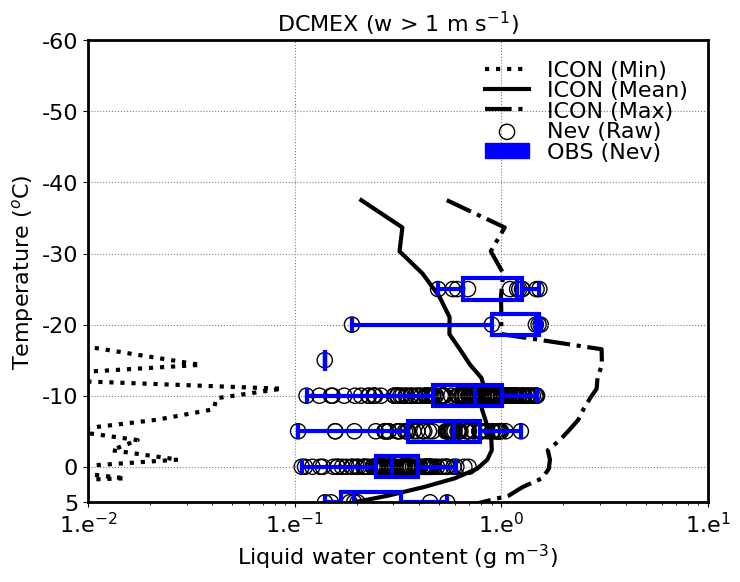

In [101]:


## ============== ICON
w_thres = 1.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
lwc_4sip_up_gperm3 = xr.where((ds_4sip_new.qc > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.lwc_gperm3, np.nan)
median_lwc_4sip_up_gperm3 = lwc_4sip_up_gperm3.median(dim=('time','ncells'))
mean_lwc_4sip_up_gperm3 = lwc_4sip_up_gperm3.mean(dim=('time','ncells'))
min_lwc_4sip_up_gperm3 = lwc_4sip_up_gperm3.min(dim=('time','ncells'))
max_lwc_4sip_up_gperm3 = lwc_4sip_up_gperm3.max(dim=('time','ncells'))
avg_4sip_tempc = ds_4sip_new.tempc.mean(dim=('time','ncells')) 

std_lwc_4sip_up_gperm3 = lwc_4sip_up_gperm3.std(dim=('time', 'ncells'), skipna=True)
count_lwc_4sip_up_gperm3 = lwc_4sip_up_gperm3.count(dim=('time', 'ncells'))
se_lwc_4sip_up_gperm3 = std_lwc_4sip_up_gperm3 / np.sqrt(count_lwc_4sip_up_gperm3)

lwc_nosip_up_gperm3 = xr.where((ds_nosip_new.qc > thres_q) & (ds_nosip_new.w_vel > w_thres), ds_nosip_new.lwc_gperm3, np.nan)
median_lwc_nosip_up_gperm3 = lwc_nosip_up_gperm3.median(dim=('time','ncells'))
mean_lwc_nosip_up_gperm3 = lwc_nosip_up_gperm3.mean(dim=('time','ncells'))
min_lwc_nosip_up_gperm3 = lwc_nosip_up_gperm3.min(dim=('time','ncells'))
max_lwc_nosip_up_gperm3 = lwc_nosip_up_gperm3.max(dim=('time','ncells'))
avg_nosip_tempc = ds_nosip_new.tempc.mean(dim=('time','ncells')) 

std_lwc_nosip_up_gperm3 = lwc_nosip_up_gperm3.std(dim=('time', 'ncells'), skipna=True)
count_lwc_nosip_up_gperm3 = lwc_nosip_up_gperm3.count(dim=('time', 'ncells'))
se_lwc_nosip_up_gperm3 = std_lwc_nosip_up_gperm3 / np.sqrt(count_lwc_4sip_up_gperm3)
## ================


fnt=16;
ln=3;
ln1=3;
al1=1.#0.4;
al2=1.#0.6;
al3=0.3
alpha=al2;
wd=3
fig, ax = plt.subplots(figsize=(8,6))
plt.style.use('default')

#ax.plot(median_lwc_sip_up_gperm3, avg_tempc, 'k--', linewidth=ln, label='ICON (Median)');
ax.plot(min_lwc_4sip_up_gperm3, avg_4sip_tempc, 'k:', linewidth=ln, label='ICON (Min)');
ax.plot(mean_lwc_4sip_up_gperm3, avg_4sip_tempc, 'k-', linewidth=ln, label='ICON (Mean)');
ax.plot(max_lwc_4sip_up_gperm3, avg_4sip_tempc, 'k-.', linewidth=ln, label='ICON (Max)');

ax.scatter(ds_nev_new['lwc_up_gperm3'], ds_nev_new['temp_nev_bin'], marker='o', s=120, 
           facecolors='none', edgecolors='k', alpha=al1, label='Nev (Raw)')


ax.boxplot(lwc_nev_up_by_bin[:], positions=temp_nev_bin[:], vert=False, patch_artist=True, widths=wd,
            boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln1, alpha=al2),  
            medianprops=dict(color='blue', linewidth=ln1), whiskerprops=dict(linewidth=ln1, color='blue', alpha=al2),  
            capprops=dict(linewidth=ln1, color='blue', alpha=al2), showfliers=False)

# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e-2, 1.e1)
ax.set_xticks([1.e-2, 1.e-1, 1.e0, 1.e1])
ax.set_xticklabels(['1.e$^{-2}$', '1.e$^{-1}$', '1.e$^{0}$', '1.e$^{1}$'], fontsize=fnt)

ax.set_xlabel('Liquid water content (g m$^{-3}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(5, -60)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([5, 0, -10, -20, -30, -40, -50, -60])
ax.set_yticklabels(['5', '0', '-10', '-20', '-30', '-40', '-50', '-60'], fontsize=fnt)


ax.set_title('DCMEX (w > 1 m s$^{-1}$)', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=alpha)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_nev_patch = mpatches.Patch(color='blue', label='OBS (Nev)')

ax.legend(handles=handles + [obs_nev_patch], frameon=False, loc='best', labelspacing=0.02, fontsize=fnt)


for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(2)
    ax.spines[spine].set_color('black')
plt.show()



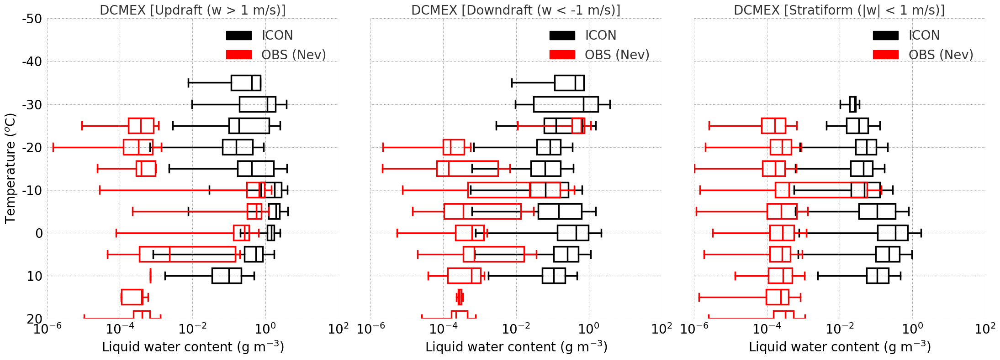

In [28]:


fontsize = 20;
linewidth = 2.5;
width=3.5;
alpha=1;
alpha1=1;
alpha2=1.;

fig, axes = plt.subplots(1, 3, figsize=(22, 8), sharey=True)
plot_titles = ['DCMEX [Updraft (w > 1 m/s)]', 'DCMEX [Downdraft (w < -1 m/s)]', 'DCMEX [Stratiform (|w| < 1 m/s)]']

for i, ax in enumerate(axes):
    #temp_bins = temp_bins_list[i]
    #data_by_bin = data_list[i]

    # Plot ICON line if applicable (replace with actual values)
    if i == 0:
        #ax.plot(lwc_up_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        
        ax.boxplot(lwc_sip_up_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),  
                   medianprops=dict(color='black', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),  
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(lwc_nev_up_by_bin, positions=temp_nev_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)
        
    elif i == 1:
        #ax.plot(lwc_dn_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        
        ax.boxplot(lwc_sip_dn_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),  
                   medianprops=dict(color='black', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),  
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(lwc_nev_dn_by_bin, positions=temp_nev_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)
        
    elif i == 2:
        #ax.plot(lwc_st_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        
        ax.boxplot(lwc_sip_st_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),  
                   medianprops=dict(color='black', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),  
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(lwc_nev_st_by_bin, positions=temp_nev_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)

    ax.set_xscale('log')
    ax.set_xlim(1.e-6, 1.e2)
    ax.set_xticklabels([1.e-6, 1.e-4, 1.e-2, 1.e0, 1.e2], fontsize=fontsize)
    ax.set_ylim(20, -50)
    ax.set_title(plot_titles[i], fontsize=fontsize)
    ax.set_xlabel('Liquid water content (g m$^{-3}$)', fontsize=fontsize)
    ax.tick_params(axis='x', labelsize=fontsize)
    ax.grid(True, linestyle=':', color='grey',alpha=alpha)

    # Combine both ICON line and boxplot legend
    handles, labels = ax.get_legend_handles_labels()

    obs_patch1 = mpatches.Patch(color='black', label='ICON')
    obs_patch2 = mpatches.Patch(color='red', label='OBS (Nev)')

    ax.legend(handles=handles + [obs_patch1, obs_patch2], frameon=False, loc='upper right', fontsize=fontsize)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_xscale('log')
axes[1].set_xscale('log')
axes[2].set_xscale('log')
axes[0].set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
axes[0].set_yticks([20, 10, 0, -10, -20, -30, -40, -50])
axes[0].set_yticklabels(['20', '10', '0', '-10', '-20', '-30', '-40', '-50'], fontsize=fontsize)
#axes[0].set_yticks([20, 10, 0, -10, -20, -30, -40])
#axes[0].set_yticklabels(['20', '10', '0', '-10', '-20', '-30', '-40'], fontsize=fontsize)

plt.tight_layout()
plt.show()


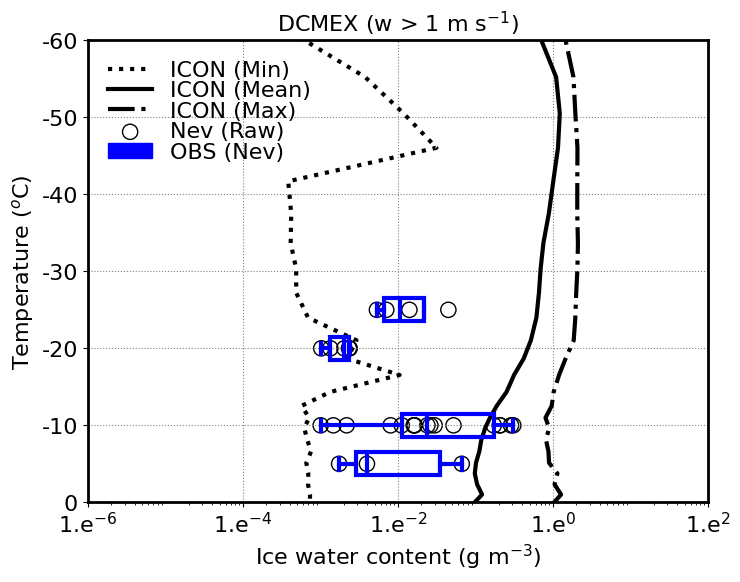

In [90]:


## ============== ICON
w_thres = 1.
thres_q1 = 1.e-6
thres_q2 = 1.e0
###### Without SIP
# lwc gperm3
tiwc_4sip_up_gperm3 = xr.where((ds_4sip_new.tqi > thres_q1) & (ds_4sip_new.tqi < thres_q2) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.tiwc_gperm3, np.nan)
median_tiwc_4sip_up_gperm3 = tiwc_4sip_up_gperm3.median(dim=('time','ncells'))
mean_tiwc_4sip_up_gperm3 = tiwc_4sip_up_gperm3.mean(dim=('time','ncells'))
min_tiwc_4sip_up_gperm3 = tiwc_4sip_up_gperm3.min(dim=('time','ncells'))
max_tiwc_4sip_up_gperm3 = tiwc_4sip_up_gperm3.max(dim=('time','ncells'))
avg_4sip_tempc = ds_4sip_new.tempc.mean(dim=('time','ncells')) 

std_tiwc_4sip_up_gperm3 = tiwc_4sip_up_gperm3.std(dim=('time', 'ncells'), skipna=True)
count_tiwc_4sip_up_gperm3 = tiwc_4sip_up_gperm3.count(dim=('time', 'ncells'))
se_tiwc_4sip_up_gperm3 = std_tiwc_4sip_up_gperm3 / np.sqrt(count_tiwc_4sip_up_gperm3)

tiwc_nosip_up_gperm3 = xr.where((ds_nosip_new.tqi > thres_q) & (ds_nosip_new.w_vel > w_thres), ds_nosip_new.tiwc_gperm3, np.nan)
median_tiwc_nosip_up_gperm3 = tiwc_nosip_up_gperm3.median(dim=('time','ncells'))
mean_tiwc_nosip_up_gperm3 = tiwc_nosip_up_gperm3.mean(dim=('time','ncells'))
min_tiwc_nosip_up_gperm3 = tiwc_nosip_up_gperm3.min(dim=('time','ncells'))
max_tiwc_nosip_up_gperm3 = tiwc_nosip_up_gperm3.max(dim=('time','ncells'))
avg_nosip_tempc = ds_nosip_new.tempc.mean(dim=('time','ncells')) 

std_tiwc_nosip_up_gperm3 = tiwc_nosip_up_gperm3.std(dim=('time', 'ncells'), skipna=True)
count_tiwc_nosip_up_gperm3 = tiwc_nosip_up_gperm3.count(dim=('time', 'ncells'))
se_tiwc_nosip_up_gperm3 = std_tiwc_nosip_up_gperm3 / np.sqrt(count_tiwc_nosip_up_gperm3)
## ================


fnt=16;
ln=3;
ln1=3;
al1=1.#0.4;
al2=1.#0.6;
al3=0.3
alpha=al2;
wd=3
fig, ax = plt.subplots(figsize=(8,6))


ax.plot(min_tiwc_4sip_up_gperm3, avg_4sip_tempc, 'k:', linewidth=ln, label='ICON (Min)');
ax.plot(mean_tiwc_4sip_up_gperm3, avg_4sip_tempc, 'k-', linewidth=ln, label='ICON (Mean)');
ax.plot(max_tiwc_4sip_up_gperm3, avg_4sip_tempc, 'k-.', linewidth=ln, label='ICON (Max)');

ax.scatter(ds_nev_new['iwc_up_gperm3'], ds_nev_new['temp_nev_bin'], marker='o', s=120, 
           facecolors='none', edgecolors='k', alpha=al1, label='Nev (Raw)')


ax.boxplot(iwc_nev_up_by_bin[:], positions=temp_nev_bin[:], vert=False, patch_artist=True, widths=wd,
            boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln1, alpha=al2),  
            medianprops=dict(color='blue', linewidth=ln1), whiskerprops=dict(linewidth=ln1, color='blue', alpha=al2),  
            capprops=dict(linewidth=ln1, color='blue', alpha=al2), showfliers=False)

# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e-6, 1.e2)
ax.set_xticks([1.e-6, 1.e-4, 1.e-2, 1.e0, 1.e2])
ax.set_xticklabels(['1.e$^{-6}$', '1.e$^{-4}$', '1.e$^{-2}$', '1.e$^{0}$', '1.e$^{2}$'], fontsize=fnt)

ax.set_xlabel('Ice water content (g m$^{-3}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(0, -60)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([0, -10, -20, -30, -40, -50, -60])
ax.set_yticklabels(['0', '-10', '-20', '-30', '-40', '-50', '-60'], fontsize=fnt)


ax.set_title('DCMEX (w > 1 m s$^{-1}$)', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=alpha)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_nev_patch = mpatches.Patch(color='blue', label='OBS (Nev)')

ax.legend(handles=handles + [obs_nev_patch], frameon=False, loc='best', labelspacing=0.02, fontsize=fnt)


for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(2)
    ax.spines[spine].set_color('black')
plt.show()



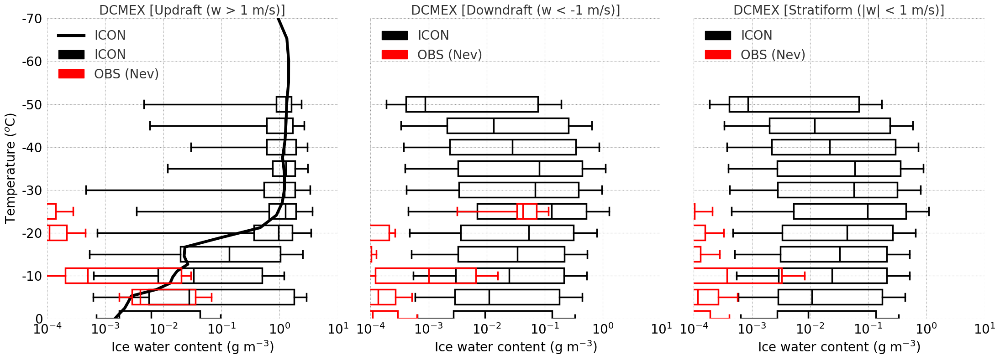

In [29]:


## ============== ICON
w_thres = 2.
thres_q = 1.e-4
###### Without SIP
# lwc gperm3
iwc_sip_up_gperm3 = xr.where((ds_4sip_new.tiwc_gperm3 > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.tiwc_gperm3, np.nan)
avg_iwc_sip_up_gperm3 = iwc_sip_up_gperm3.median(dim=('time','ncells'))
avg_tempc = ds_4sip_new.tempc.mean(dim=('time','ncells')) 

fontsize = 20;
linewidth = 2.5;
width=3.5;
alpha=1;
alpha1=1;
alpha2=1.;

fig, axes = plt.subplots(1, 3, figsize=(22, 8), sharey=True)
plot_titles = ['DCMEX [Updraft (w > 1 m/s)]', 'DCMEX [Downdraft (w < -1 m/s)]', 'DCMEX [Stratiform (|w| < 1 m/s)]']

for i, ax in enumerate(axes):
    #temp_bins = temp_bins_list[i]
    #data_by_bin = data_list[i]

    # Plot ICON line if applicable (replace with actual values)
    if i == 0:
        #ax.plot(tiwc_up_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        
        ax.plot(avg_iwc_sip_up_gperm3, avg_tempc, 'k-', linewidth=linewidth+2, label='ICON')
        ax.boxplot(iwc_sip_up_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),  
                   medianprops=dict(color='black', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),  
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(iwc_nev_up_by_bin, positions=temp_nev_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)
        
    elif i == 1:
        #ax.plot(tiwc_dn_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        
        ax.boxplot(iwc_sip_dn_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),  
                   medianprops=dict(color='black', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),  
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(iwc_nev_dn_by_bin, positions=temp_nev_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)
        
    elif i == 2:
        #ax.plot(tiwc_st_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        
        ax.boxplot(iwc_sip_st_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),  
                   medianprops=dict(color='black', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),  
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(iwc_nev_st_by_bin, positions=temp_nev_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)

    ax.set_xscale('log')
    ax.set_xlim(1.e-4, 1.e1)
    ax.set_xticklabels([1.e-4, 1.e-3, 1.e-2, 1.e-1, 1.e0, 1.e1], fontsize=fontsize)
    ax.set_ylim(0, -70)
    ax.set_title(plot_titles[i], fontsize=fontsize)
    ax.set_xlabel('Ice water content (g m$^{-3}$)', fontsize=fontsize)
    ax.tick_params(axis='x', labelsize=fontsize)
    ax.grid(True, linestyle=':', color='grey',alpha=alpha)

    # Combine both ICON line and boxplot legend
    handles, labels = ax.get_legend_handles_labels()

    
    obs_patch1 = mpatches.Patch(color='black', label='ICON')
    obs_patch2 = mpatches.Patch(color='red', label='OBS (Nev)')
    
    #obs_patch = mpatches.Patch(color='lightgrey', label='OBS (CIP)')

    ax.legend(handles=handles + [obs_patch1, obs_patch2], frameon=False, loc='upper left', fontsize=fontsize)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_xscale('log')
axes[1].set_xscale('log')
axes[2].set_xscale('log')
axes[0].set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
axes[0].set_yticks([0, -10, -20, -30, -40, -50, -60, -70])
axes[0].set_yticklabels(['0', '-10', '-20', '-30', '-40', '-50', '-60', '-70'], fontsize=fontsize)
#axes[0].set_yticks([0, -5, -10, -15, -20, -25, -30, -35, -40])
#axes[0].set_yticklabels(['0', '-5', '-10', '-15', '-20', '-25', '-30', '-35', '-40'], fontsize=fontsize)

plt.tight_layout()
plt.show()


In [94]:
ds_faam_cdp_phy = data_faam_core_cld_phy

ds_faam_cdp_phy['CDP_TSPM'] = ds_faam_cdp_phy['CDP_TSPM'].dt.floor('s')
ds_faam_cdp_phy['cdnc_percm3'] = ds_faam_cdp_phy['CDP_CONC'].rename({'CDP_TSPM': 'Time'})



ds_faam_cdp_phy['TAT_DI_R'] = data_faam_core_1hz['TAT_DI_R']
ds_faam_cdp_phy['W_C'] = data_faam_core_1hz['W_C']
ds_faam_cdp_phy['tempc'] = data_faam_core_1hz.TAT_DI_R-273.16

w_thres=1.;
filt_cdnc_cdp_up_cond = (ds_faam_cdp_phy.cdnc_percm3 > 1.e-1) & (ds_faam_cdp_phy.W_C > w_thres)
filt_cdnc_cdp_dn_cond = (ds_faam_cdp_phy.cdnc_percm3 > 1.e-1) & (ds_faam_cdp_phy.W_C < -1*w_thres) & (ds_faam_cdp_phy.W_C > -20.)
filt_cdnc_cdp_st_cond = (ds_faam_cdp_phy.cdnc_percm3 > 1.e-1) & (np.abs(ds_faam_cdp_phy.W_C) < w_thres)

# store variables
ds_faam_cdp_phy['cdnc_up_percm3'] = xr.where(filt_cdnc_cdp_up_cond, ds_faam_cdp_phy.cdnc_percm3, np.nan)
ds_faam_cdp_phy['cdnc_dn_percm3'] = xr.where(filt_cdnc_cdp_dn_cond, ds_faam_cdp_phy.cdnc_percm3, np.nan)
ds_faam_cdp_phy['cdnc_st_percm3'] = xr.where(filt_cdnc_cdp_st_cond, ds_faam_cdp_phy.cdnc_percm3, np.nan)

print(ds_faam_cdp_phy.Time)
# Define temperature bins
#temp_cdp_bin = np.array([30., 27., 24., 21., 18., 15., 12., 9., 6., 3., 0., -3., -6., -9., -12., -15., -18., -21., -24., -27., -30.])
temp_cdp_bin = np.arange(-30, 30, 5)
temp_cdp_bin = np.sort(temp_cdp_bin)

tempc_values = ds_faam_cdp_phy['tempc'].values
nan_mask = np.isnan(tempc_values)

valid_tempc_values = tempc_values[~nan_mask]

# which temperature bin each 'ds_cip_new.tempc' value belongs to?
temp_bins_indices = np.digitize(valid_tempc_values, bins=np.append(temp_cdp_bin, np.inf)) - 1
temp_bins_indices = np.clip(temp_bins_indices, 0, len(temp_cdp_bin) - 1)

# assign temp_bin to temp_bin_labels
temp_bin_labels = temp_cdp_bin[temp_bins_indices]
temp_bin_labels_full = np.full_like(tempc_values, np.nan)
temp_bin_labels_full[~nan_mask] = temp_bin_labels

time_coord = ds_faam_cdp_phy['tempc'].coords['Time']
ds_faam_cdp_phy['temp_cdp_bin'] = xr.DataArray(temp_bin_labels_full, coords={'Time': time_coord}, dims=['Time'])

df_up_cdnc_cdp = ds_faam_cdp_phy[['cdnc_up_percm3', 'temp_cdp_bin']].to_dataframe().dropna()
df_dn_cdnc_cdp = ds_faam_cdp_phy[['cdnc_dn_percm3', 'temp_cdp_bin']].to_dataframe().dropna()
df_st_cdnc_cdp = ds_faam_cdp_phy[['cdnc_st_percm3', 'temp_cdp_bin']].to_dataframe().dropna()

df_up_cdnc_cdp = df_up_cdnc_cdp.dropna(subset=['temp_cdp_bin'])
df_dn_cdnc_cdp = df_dn_cdnc_cdp.dropna(subset=['temp_cdp_bin'])
df_st_cdnc_cdp = df_st_cdnc_cdp.dropna(subset=['temp_cdp_bin'])

# Sort the data by bin
cdnc_cdp_up_by_bin = [df_up_cdnc_cdp[df_up_cdnc_cdp['temp_cdp_bin'] == temp]['cdnc_up_percm3'].values for temp in temp_cdp_bin]
cdnc_cdp_dn_by_bin = [df_dn_cdnc_cdp[df_dn_cdnc_cdp['temp_cdp_bin'] == temp]['cdnc_dn_percm3'].values for temp in temp_cdp_bin]
cdnc_cdp_st_by_bin = [df_st_cdnc_cdp[df_st_cdnc_cdp['temp_cdp_bin'] == temp]['cdnc_st_percm3'].values for temp in temp_cdp_bin]

<xarray.DataArray 'Time' (Time: 24313)> Size: 195kB
array(['2022-08-02T13:26:01.000000000', '2022-08-02T13:26:02.000000000',
       '2022-08-02T13:26:03.000000000', ..., '2022-08-02T20:11:11.000000000',
       '2022-08-02T20:11:12.000000000', '2022-08-02T20:11:13.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * Time     (Time) datetime64[ns] 195kB 2022-08-02T13:26:01 ... 2022-08-02T2...
    LAT_GIN  (Time) float32 97kB nan nan nan nan nan nan ... nan nan nan nan nan
    LON_GIN  (Time) float32 97kB nan nan nan nan nan nan ... nan nan nan nan nan


In [36]:

count_per_bin = df_dn_cdnc_cdp.groupby('temp_cdp_bin')['cdnc_dn_percm3'].count()

# Print the result
print(count_per_bin)

temp_cdp_bin
-25.0     15
-20.0      4
-15.0     11
-10.0    100
-5.0      29
 0.0      11
 5.0      11
 25.0      1
Name: cdnc_dn_percm3, dtype: int64


In [ ]:
cdnc_cdp_up_by_bin

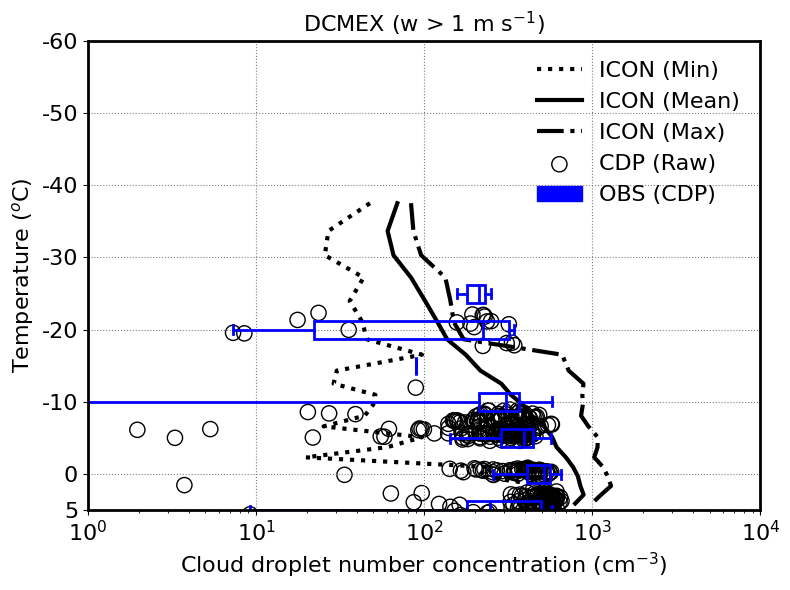

In [103]:


## ============== ICON
w_thres = 1.
thres_q = 1.e-3
###### Without SIP
# INC
cdnc_4sip_up_percm3 = xr.where((ds_4sip_new.qc > thres_q) & (ds_4sip_new.w_vel > w_thres), ds_4sip_new.cdnc_percm3, np.nan)
median_cdnc_4sip_up_percm3 = cdnc_4sip_up_percm3.median(dim=('time','ncells'))
mean_cdnc_4sip_up_percm3 = cdnc_4sip_up_percm3.mean(dim=('time','ncells'))
min_cdnc_4sip_up_percm3 = cdnc_4sip_up_percm3.min(dim=('time','ncells'))
max_cdnc_4sip_up_percm3 = cdnc_4sip_up_percm3.max(dim=('time','ncells'))
avg_4sip_tempc = ds_4sip_new.tempc.mean(dim=('time','ncells')) 

std_cdnc_4sip_up_percm3 = cdnc_4sip_up_percm3.std(dim=('time', 'ncells'), skipna=True)
count_cdnc_4sip_up_percm3 = cdnc_4sip_up_percm3.count(dim=('time', 'ncells'))
se_cdnc_4sip_up_percm3 = std_cdnc_4sip_up_percm3 / np.sqrt(count_cdnc_4sip_up_percm3)


cdnc_nosip_up_percm3 = xr.where((ds_nosip_new.qc > thres_q) & (ds_nosip_new.w_vel > w_thres), ds_nosip_new.cdnc_percm3, np.nan)
median_cdnc_nosip_up_percm3 = cdnc_nosip_up_percm3.median(dim=('time','ncells'))
mean_cdnc_nosip_up_percm3 = cdnc_nosip_up_percm3.mean(dim=('time','ncells'))
min_cdnc_nosip_up_percm3 = cdnc_nosip_up_percm3.min(dim=('time','ncells'))
max_cdnc_nosip_up_percm3 = cdnc_nosip_up_percm3.max(dim=('time','ncells'))
avg_nosip_tempc = ds_nosip_new.tempc.mean(dim=('time','ncells')) 

std_cdnc_nosip_up_percm3 = cdnc_nosip_up_percm3.std(dim=('time', 'ncells'), skipna=True)
count_cdnc_nosip_up_percm3 = cdnc_nosip_up_percm3.count(dim=('time', 'ncells'))
se_cdnc_nosip_up_percm3 = std_cdnc_nosip_up_percm3 / np.sqrt(count_cdnc_nosip_up_percm3)
#==========================================

fnt=16;
ln=3;
ln1=3;
al1=1.#0.4;
al2=1.#0.6;
al3=0.3
wd=2.5
fig, ax = plt.subplots(figsize=(8,6))

#ax.plot(min_inc_sip_up_percm3, avg_4sip_tempc, 'k-.', linewidth=ln, label='ICON (Min)');
#ax.plot(median_cdnc_4sip_up_percm3, avg_4sip_tempc, 'k--', linewidth=ln, label='ICON (Median)');
ax.plot(min_cdnc_4sip_up_percm3, avg_4sip_tempc, 'k:', linewidth=ln, label='ICON (Min)');
ax.plot(mean_cdnc_4sip_up_percm3, avg_4sip_tempc, 'k-', linewidth=ln, label='ICON (Mean)');
ax.plot(max_cdnc_4sip_up_percm3, avg_4sip_tempc, 'k-.', linewidth=ln, label='ICON (Max)');


ax.scatter(ds_faam_cdp_phy['cdnc_up_percm3'], ds_faam_cdp_phy['tempc'], marker='o', s=120, 
           facecolors='none', edgecolors='k', alpha=al1, label='CDP (Raw)')

ax.boxplot(cdnc_cdp_up_by_bin[:], positions=temp_cdp_bin[:], vert=False, patch_artist=True, widths=wd,
           boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln-1, alpha=al2),
           medianprops=dict(color='blue', linewidth=ln-1),
           whiskerprops=dict(linewidth=ln-1, color='blue', alpha=al2),
           capprops=dict(linewidth=ln-1, color='blue', alpha=al2), showfliers=False)


# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e0, 1.e4)
ax.set_xticks([1.e0, 1.e1, 1.e2, 1.e3, 1.e4])
#ax.set_xticklabels([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6], fontsize=fontsize)

ax.set_xlabel('Cloud droplet number concentration (cm$^{-3}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(5, -60)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([5, 0, -10, -20, -30, -40, -50, -60])
ax.set_yticklabels(['5', '0', '-10', '-20', '-30', '-40', '-50', '-60'], fontsize=fnt)


ax.set_title('DCMEX (w > 1 m s$^{-1}$)', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=al1)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_2dc_patch = mpatches.Patch(color='blue', label='OBS (CDP)')

#ax.legend(handles=handles + [obs_icon_patch, obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', fontsize=fnt)
ax.legend(handles=handles + [obs_2dc_patch], frameon=False, loc='best', fontsize=fnt)

# Customize axis spines
for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(2)
    ax.spines[spine].set_color('black')


# Display the plot
plt.tight_layout()
plt.show()


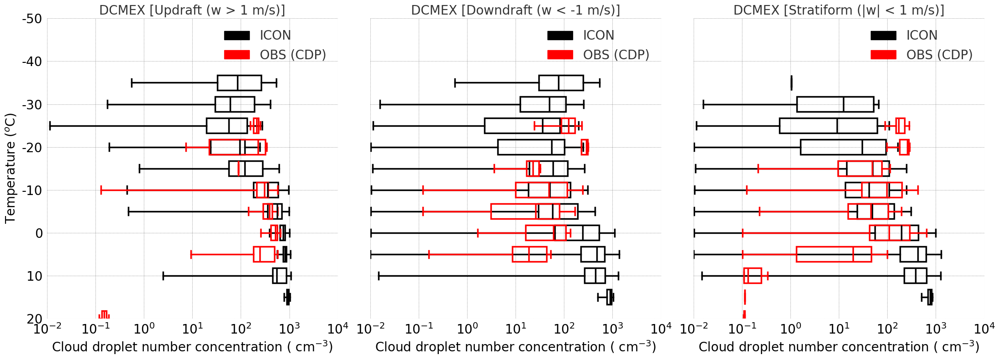

In [31]:


fontsize = 20;
linewidth = 3;
width=2;
alpha=1;

fig, axes = plt.subplots(1, 3, figsize=(22, 8), sharey=True)
plot_titles = ['DCMEX [Updraft (w > 1 m/s)]', 'DCMEX [Downdraft (w < -1 m/s)]', 'DCMEX [Stratiform (|w| < 1 m/s)]']

linewidth = 2.5;
width=3.5;
alpha1=1;
alpha2=1.;
for i, ax in enumerate(axes):
    #temp_bins = temp_bins_list[i]
    #data_by_bin = data_list[i]

    # Plot ICON line if applicable (replace with actual values)
    if i == 0:
        #ax.plot(cdnc_up_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        
        ax.boxplot(cdnc_sip_up_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),
                   medianprops=dict(color='black', linewidth=linewidth),
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(cdnc_cdp_up_by_bin, positions=temp_cdp_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)
        
    elif i == 1:
        #ax.plot(cdnc_dn_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        
        ax.boxplot(cdnc_sip_dn_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),
                   medianprops=dict(color='black', linewidth=linewidth),
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(cdnc_cdp_dn_by_bin, positions=temp_cdp_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)
        
    elif i == 2:
        #ax.plot(cdnc_st_2mom, tempc_2mom, 'k-', linewidth=linewidth+2, label='ICON')
        
        ax.boxplot(cdnc_sip_st_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='black', linewidth=linewidth, alpha=alpha1),
                   medianprops=dict(color='black', linewidth=linewidth),
                   whiskerprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   capprops=dict(linewidth=linewidth, color='black', alpha=alpha1),
                   showfliers=False)
        
        ax.boxplot(cdnc_cdp_st_by_bin, positions=temp_cdp_bin, vert=False, patch_artist=True,
                   widths=width,
                   boxprops=dict(facecolor='none', edgecolor='red', linewidth=linewidth, alpha=alpha2),  
                   medianprops=dict(color='red', linewidth=linewidth),  
                   whiskerprops=dict(linewidth=linewidth, color='red', alpha=alpha2),  
                   capprops=dict(linewidth=linewidth, color='red', alpha=alpha2),
                   showfliers=False)

    ax.set_xscale('log')
    ax.set_xlim(1.e-2, 1.e4)
    ax.set_xticklabels([1.e-2, 1.e-1, 1.e0, 1.e1, 1.e2, 1.e3, 1.e4], fontsize=fontsize)
    ax.set_ylim(20, -50)
    #ax.set_yticklabels([20, 10, 0, -10, -20, -30, -40], fontsize=fontsize)
    ax.set_title(plot_titles[i], fontsize=fontsize)
    ax.set_xlabel('Cloud droplet number concentration ( cm$^{-3}$)', fontsize=fontsize)
    ax.tick_params(axis='x', labelsize=fontsize)
    ax.grid(True, linestyle=':', color='grey',alpha=1.0)

    # Combine both ICON line and boxplot legend
    handles, labels = ax.get_legend_handles_labels()

    obs_patch1 = mpatches.Patch(color='black', label='ICON')
    obs_patch2 = mpatches.Patch(color='red', label='OBS (CDP)')

    ax.legend(handles=handles + [obs_patch1, obs_patch2], frameon=False, loc='upper right', fontsize=fontsize)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_xscale('log')
axes[1].set_xscale('log')
axes[2].set_xscale('log')
axes[0].set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
axes[0].set_yticks([20, 10, 0, -10, -20, -30, -40, -50])
axes[0].set_yticklabels(['20', '10', '0', '-10', '-20', '-30', '-40', '-50'], fontsize=fontsize)
#axes[0].set_yticks([20, 10, 0, -10, -20, -30, -40])
#axes[0].set_yticklabels(['20', '10', '0', '-10', '-20', '-30', '-40'], fontsize=fontsize)

plt.tight_layout()
plt.show()


# Radar

##### Before we go into details of the S-Pol radar data from STEPS, lets understand a few basic things 
##### about the radar scan

##### Radar scans rotate 360°, and the azimuth tells you where the radar is “looking.”

##### Interpreting scan direction from the radar Azimuth angle
#####     Azimuth(°) ==  Direction
#####         0      ==   North
#####        90      ==   East
#####       180      ==   South
#####       270      ==   West              

##### When we say "eastward distance", we mean: “How far something is to the east or west of the radar?”
##### If a target (like a cloud or storm) is directly east of the radar → its eastward distance is positive
##### If it’s directly west of the radar → its eastward distance is negative

##### ===========================================================================================
##### Azimuth tells the direction the radar is scanning.
##### Eastward distance means “how far east or west something is from the radar.”
##### If azimuth is in the east half (0–180°), targets are generally eastward (positive).
##### If azimuth is in the west half (180–360°), targets are generally westward (negative).
##### ===========================================================================================


(0.0, 140.0)

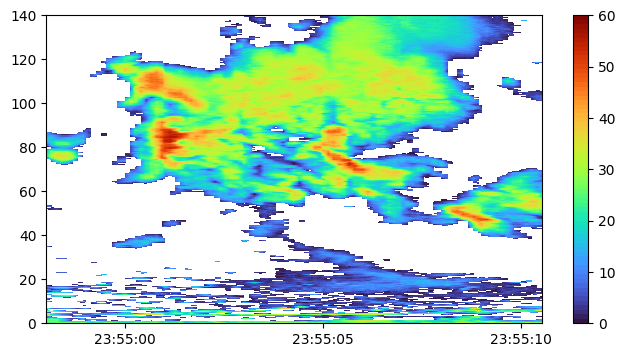

In [38]:

file_path='/work/bk1415/b382718/output/steps/observations/radar_data/deepa405903/20000619_0620'
ds_spol_steps = xr.open_mfdataset(f'{file_path}/cfrad.20000619_235458.000_to_20000619_235510.533_SPOL_PPI.nc');
ds_spol_steps

ds_spol_steps['refl'] = xr.where(ds_spol_steps.DZ > 0., ds_spol_steps.DZ, np.nan)

lev = np.linspace(0,60,70)
plt.figure(figsize=(8, 4))
cont = plt.contourf(ds_spol_steps.time, 1.e-3*ds_spol_steps.range, ds_spol_steps.refl.T, levels=lev, cmap='turbo')
plt.colorbar(cont, ticks=[0, 10, 20, 30, 40, 50, 60])
plt.ylim(0, 140)

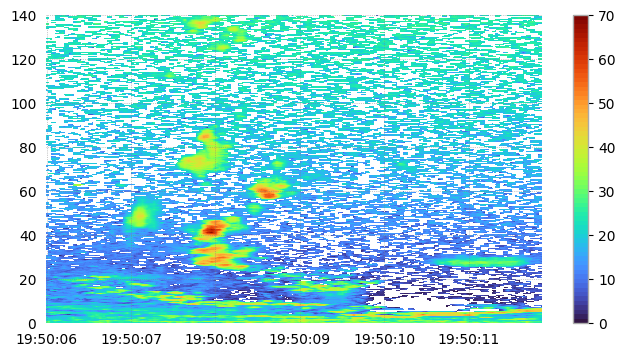

In [32]:

file_path='/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'
ds_spol1 = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195005.995_to_20220802_195011.870_SR1_v10_s00_el1.60_PPI.nc');

ds_spol1
ds_spol1['refl'] = xr.where(ds_spol1.DBZ > 0., ds_spol1.DBZ, np.nan)

lev = np.linspace(0,70,70)


plt.figure(figsize=(8, 4))
deg_faint_errbar = 0.6
lnwdth1=3
lnwdth2=3
fontsize=18
cont = plt.contourf(ds_spol1.time, 1.e-3*ds_spol1.range, ds_spol1.refl.T, levels=lev, cmap='turbo')
plt.colorbar(cont, ticks=[0, 10, 20, 30, 40, 50, 60, 70])
plt.ylim(0, 140)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_color('k')
plt.gca().spines['left'].set_color('k')
plt.show()

<xarray.Dataset> Size: 7MB
Dimensions:                           (frequency: 1, sweep: 1, r_calib: 1,
                                       time: 130, range: 1001)
Coordinates:
  * frequency                         (frequency) float32 4B 5.593e+09
  * time                              (time) datetime64[ns] 1kB 2022-08-02T20...
  * range                             (range) float32 4kB 0.0 150.0 ... 1.5e+05
Dimensions without coordinates: sweep, r_calib
Data variables: (12/134)
    volume_number                     float64 8B ...
    platform_type                     |S32 32B ...
    primary_axis                      |S32 32B ...
    status_xml                        |S1 1B ...
    instrument_type                   |S32 32B ...
    radar_antenna_gain_h              float32 4B ...
    ...                                ...
    RHOHV                             (time, range) float32 521kB ...
    DM                                (time, range) float32 521kB ...
    VRo                    

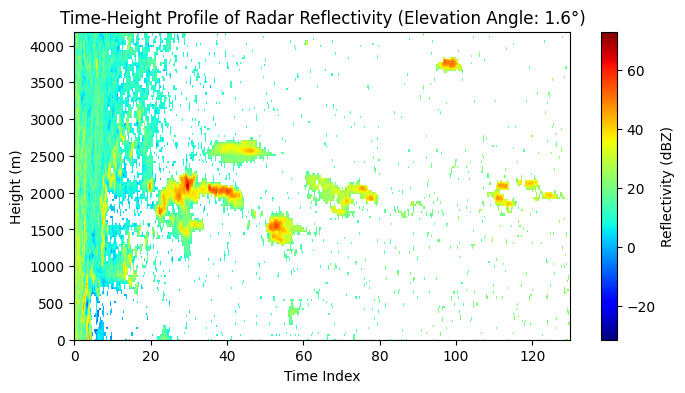

In [39]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Function to convert range to height based on the radar's elevation angle
def range_to_height(range_data, elevation_angle_deg):
    """
    Convert radar range to height (z) given the elevation angle.
    :param range_data: 1D array of range values (meters)
    :param elevation_angle_deg: Elevation angle in degrees
    :return: 1D array of height values (meters)
    """
    # Convert elevation angle to radians
    elevation_angle_rad = np.radians(elevation_angle_deg)
    
    # Compute height using radar geometry
    # z = range * sin(elevation_angle)
    height_data = range_data * np.sin(elevation_angle_rad)
    return height_data

# Load the radar data from NetCDF (adjust path as needed)
file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802/cfrad.20220802_200005.252_to_20220802_200011.131_SR1_v14_s00_el1.60_PPI.nc'
dataset = xr.open_dataset(file_path)

# Check the dataset to confirm we have the correct structure
print(dataset)

# Extract reflectivity (DBZ), range, and time data from the dataset
reflectivity = dataset['DBZ']  # Adjust if the variable name is different
range_data = dataset['range']  # The radar range data (distance from radar)
time_data = dataset['time']  # The time data (timestamps)

# Define the elevation angle (from your file, it appears to be 1.6 degrees)
elevation_angle = 1.60  # Adjust as needed for each file (1.6°, 2.4°, etc.)

# Convert range data to height using the given elevation angle
height_data = range_to_height(range_data, elevation_angle)

# Create a time-height profile by extracting reflectivity at each time step and mapping to height
time_height_profile = []

# Loop through each time step and extract reflectivity values
for time_idx in range(reflectivity.shape[0]):  # 130 time steps
    reflectivity_time = reflectivity[time_idx, :]  # Extract reflectivity at this time
    time_height_profile.append(reflectivity_time)

# Convert the time-height profile to a numpy array
time_height_profile = np.array(time_height_profile)

# Plot the time-height profile
plt.figure(figsize=(8, 4))
plt.imshow(time_height_profile, aspect='auto', cmap='jet', extent=[0, len(time_data), 0, np.max(height_data)])
plt.colorbar(label='Reflectivity (dBZ)')
plt.ylabel('Height (m)')
plt.xlabel('Time Index')
plt.title(f'Time-Height Profile of Radar Reflectivity (Elevation Angle: {elevation_angle}°)')
plt.show()


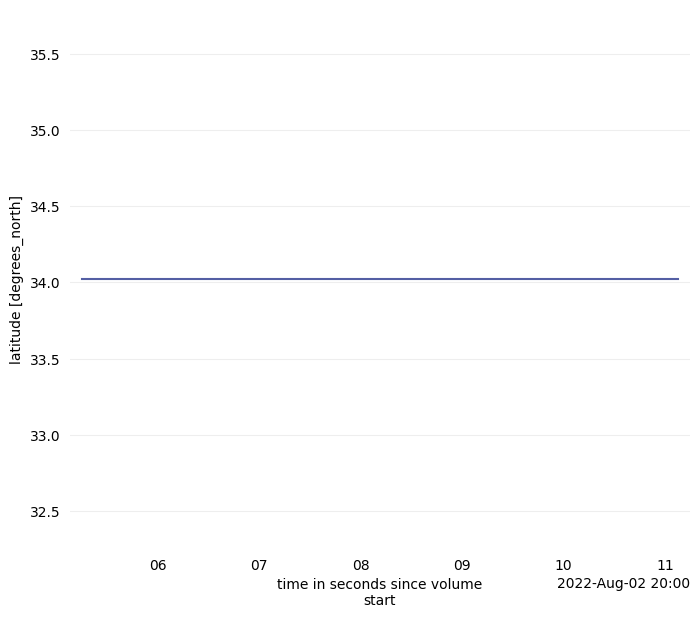

In [88]:
dataset.latitude.plot()

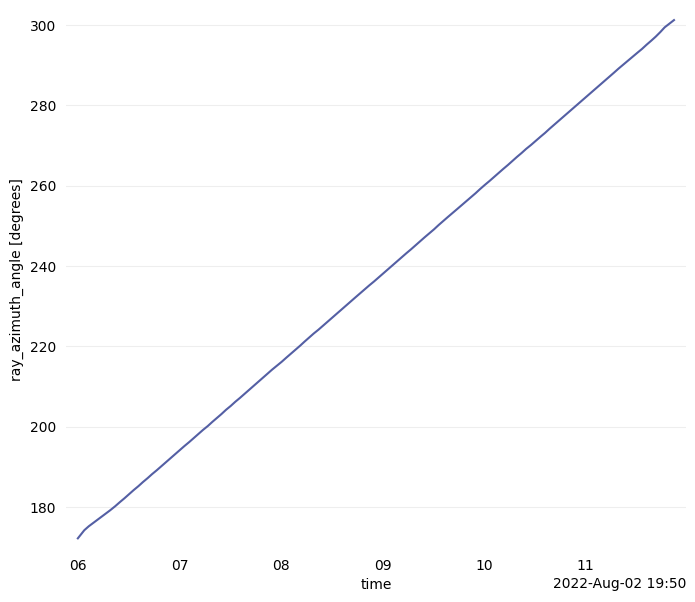

In [118]:
ds_ppi.azimuth.plot()

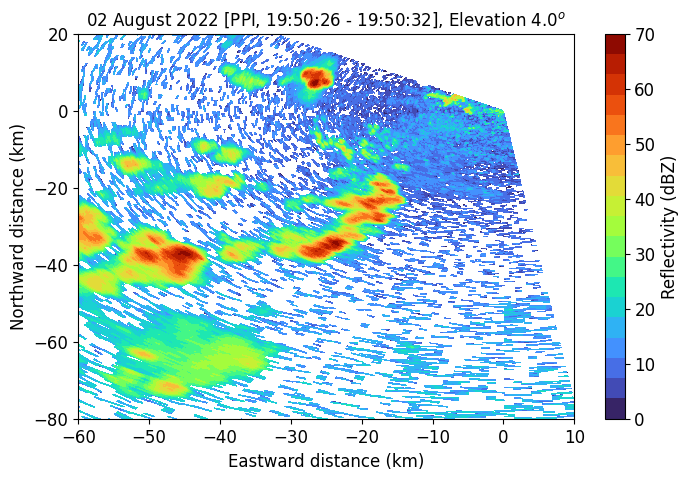

In [40]:

file_path='/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

#ds_ppi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195005.995_to_20220802_195011.870_SR1_v10_s00_el1.60_PPI.nc');
ds_ppi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195026.400_to_20220802_195032.295_SR1_v10_s03_el4.00_PPI.nc');

ds_ppi['refl'] = xr.where(ds_ppi.DBZ > 0., ds_ppi.DBZ, np.nan)

# Get azimuth and range, convert to radians and km
azimuth = ds_ppi['azimuth'].values             # shape: (azimuth,)
range_gate = ds_ppi['range'].values * 1e-3     # convert m to km, shape: (range,)
theta = np.deg2rad(azimuth)                # radians

# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
eastward_dist = r_grid * np.sin(theta_grid)            # eastward (km)
northward_dist = r_grid * np.cos(theta_grid)            # northward (km)


lev = np.linspace(0, 70, 20)
cont_lev = range(0, 51, 10)
fontsize=12


# Plotting
plt.figure(figsize=(8, 5))

cont = plt.contourf(eastward_dist, northward_dist, ds_ppi.refl, cmap='turbo', levels=lev, shading='auto')

#contour=plt.contour(eastward_dist, northward_dist, ds_ppi.refl, levels=cont_lev, colors='k', linestyles='-', linewidths=0.5)
#plt.clabel(contour, inline=True, fontsize=fontsize-2, fmt='%d')

plt.xlim(-60, 10)
plt.ylim(-80, 20)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Eastward distance (km)', fontsize=fontsize)
plt.ylabel('Northward distance (km)', fontsize=fontsize)
plt.title('02 August 2022 [PPI, 19:50:26 - 19:50:32], Elevation 4.0$^{o}$', fontsize=fontsize)
cb=plt.colorbar(cont, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Reflectivity (dBZ)')
cb.ax.tick_params(labelsize=fontsize)
cb.set_label(label='Reflectivity (dBZ)', size=fontsize)

#plt.tight_layout()
plt.show()

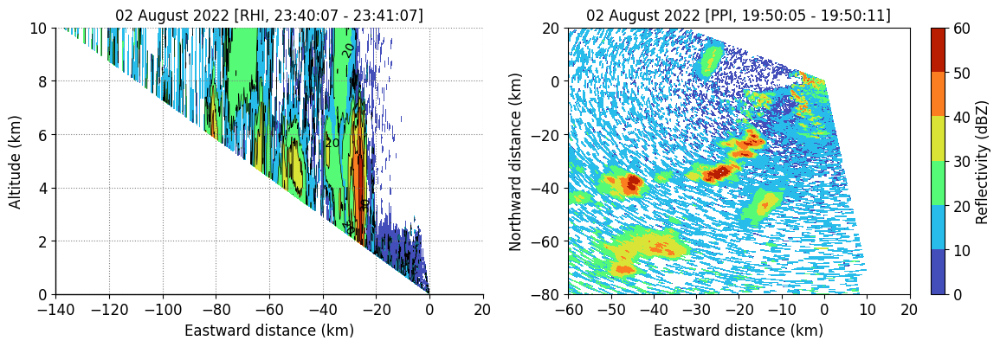

In [41]:


file_path='/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_ppi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195005.995_to_20220802_195011.870_SR1_v10_s00_el1.60_PPI.nc');

ds_ppi['refl'] = xr.where(ds_ppi.DBZ > 0., ds_ppi.DBZ, np.nan)


ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195806.088_to_20220802_195811.678_SR1_v13_s00_az224.00_RHI.nc');

ds_rhi['refl'] = xr.where(ds_rhi.DBZ > 0., ds_rhi.DBZ, np.nan)
 
## Need to convert radar data from polar to cartesian coordinate to plot properly 
## To plot eastward-northward plot, convert data into eastward & northward distance from ds.range and ds.azimuth 

# Get azimuth and range, convert to radians and km
azimuth = ds_ppi['azimuth'].values             # shape: (azimuth,)
range_gate = ds_ppi['range'].values * 1e-3     # convert m to km, shape: (range,)
theta = np.deg2rad(azimuth)                # radians

# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
eastward_dist = r_grid * np.sin(theta_grid)            # eastward (km)
northward_dist = r_grid * np.cos(theta_grid)            # northward (km)

## To plot range-height plot, convert data into horizontal distance and height from ds.range and ds.elevation 

# Get elevation and range, convert to radians and km

theta_elev = ds_rhi['elevation'].values             # shape: (elevation,)
range_gate = ds_rhi['range'].values * 1e-3     # convert m to km, shape: (range,)
theta = np.deg2rad(theta_elev)                # radians


# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
hor_dist = r_grid * np.cos(theta_grid)            # horizontal distance (km)
height = r_grid * np.sin(theta_grid)            # height (km)

lev = np.linspace(0, 60, 7)
cont_lev = range(0, 51, 10)
fontsize=12


# Plotting
plt.figure(figsize=(14, 4))
plt.subplot(1,2,1)
cont = plt.contourf(-1*hor_dist, height, ds_rhi.refl, cmap='turbo', levels=lev, shading='auto')

contour=plt.contour(-1*hor_dist, height, ds_rhi.refl, levels=cont_lev, colors='k', linestyles='-', linewidths=0.5)
plt.clabel(contour, inline=True, fontsize=fontsize-2, fmt='%d')

plt.grid(True, linestyle=':', color='grey', alpha=1.0)
plt.xlim(-140, 20)
plt.ylim(0, 10)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Eastward distance (km)', fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)
plt.title('02 August 2022 [RHI, 23:40:07 - 23:41:07]', fontsize=fontsize)
#cb=plt.colorbar(cont, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], label='Reflectivity (dBZ)')
#cb.ax.tick_params(labelsize=fontsize)
#cb.set_label(label='Reflectivity (dBZ)', size=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

plt.subplot(1,2,2)
cont = plt.contourf(eastward_dist, northward_dist, ds_ppi.refl, cmap='turbo', levels=lev, shading='auto')

#contour=plt.contour(eastward_dist, northward_dist, ds_ppi.refl, levels=cont_lev, colors='k', linestyles='-', linewidths=0.5)
#plt.clabel(contour, inline=True, fontsize=fontsize-2, fmt='%d')

plt.xlim(-60, 20)
plt.ylim(-80, 20)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Eastward distance (km)', fontsize=fontsize)
plt.ylabel('Northward distance (km)', fontsize=fontsize)
plt.title('02 August 2022 [PPI, 19:50:05 - 19:50:11]', fontsize=fontsize)
cb=plt.colorbar(cont, ticks=[0, 10, 20, 30, 40, 50, 60], label='Reflectivity (dBZ)')
cb.ax.tick_params(labelsize=fontsize)
cb.set_label(label='Reflectivity (dBZ)', size=fontsize)

#plt.tight_layout()
plt.show()

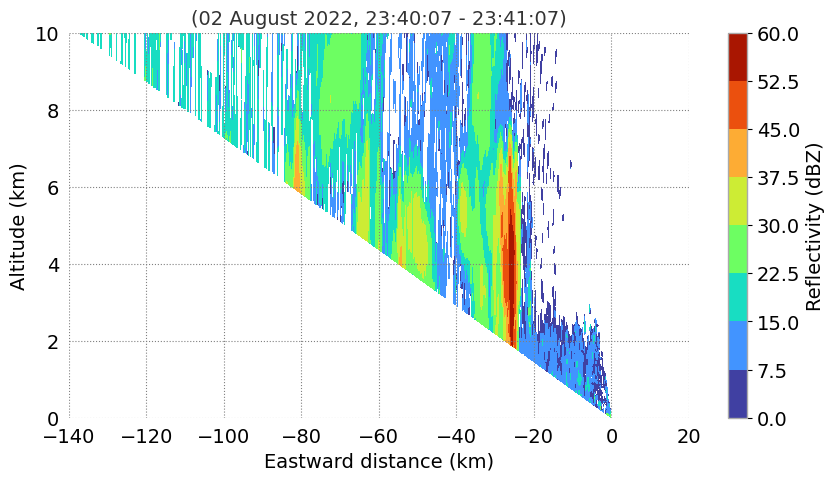

In [36]:


file_path='/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'
ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195806.088_to_20220802_195811.678_SR1_v13_s00_az224.00_RHI.nc');
#ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.20000619_234058.267_to_20000619_234107.667_SPOL_RHI.nc');

ds_rhi['refl'] = xr.where(ds_rhi.DBZ > 0., ds_rhi.DBZ, np.nan)
 
## Need to convert radar data from polar to cartesian coordinate to plot properly 

## To plot range-height plot, convert data into horizontal distance and height from ds.range and ds.elevation 

# Get azimuth and range, convert to radians and km

theta_elev = ds_rhi['elevation'].values             # shape: (elevation,)
range_gate = ds_rhi['range'].values * 1e-3     # convert m to km, shape: (range,)
theta = np.deg2rad(theta_elev)                # radians


# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
hor_dist = r_grid * np.cos(theta_grid)            # horizontal distance (km)
height = r_grid * np.sin(theta_grid)            # height (km)

lev = np.linspace(0, 60, 9)
cont_lev = range(0, 51, 10)
fontsize=14
# Plotting
plt.figure(figsize=(10, 5))
cont = plt.contourf(-1*hor_dist, height, ds_rhi.refl, cmap='turbo', levels=lev, shading='auto')

#contour=plt.contour(-1*hor_dist, height, ds_rhi.refl, levels=cont_lev, colors='k', linestyles='-', linewidths=0.5)
#plt.clabel(contour, inline=True, fontsize=fontsize-2, fmt='%d')

plt.grid(True, linestyle=':', color='grey', alpha=1.0)
plt.xlim(-140, 20)
plt.ylim(0, 10)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Eastward distance (km)', fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)
plt.title('(02 August 2022, 23:40:07 - 23:41:07)', fontsize=fontsize)
cb=plt.colorbar(cont)#, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], label='Reflectivity (dBZ)')
cb.ax.tick_params(labelsize=fontsize)
cb.set_label(label='Reflectivity (dBZ)', size=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

#plt.tight_layout()
plt.show()

In [74]:
ds_4sip.time

<xarray.DataArray 'time' (time: 49)> Size: 392B
array(['2022-08-02T00:00:00.000000000', '2022-08-02T00:30:00.000000000',
       '2022-08-02T01:00:00.000000000', '2022-08-02T01:30:00.000000000',
       '2022-08-02T02:00:00.000000000', '2022-08-02T02:30:00.000000000',
       '2022-08-02T03:00:00.000000000', '2022-08-02T03:30:00.000000000',
       '2022-08-02T04:00:00.000000000', '2022-08-02T04:30:00.000000000',
       '2022-08-02T05:00:00.000000000', '2022-08-02T05:30:00.000000000',
       '2022-08-02T06:00:00.000000000', '2022-08-02T06:30:00.000000000',
       '2022-08-02T07:00:00.000000000', '2022-08-02T07:30:00.000000000',
       '2022-08-02T08:00:00.000000000', '2022-08-02T08:30:00.000000000',
       '2022-08-02T09:00:00.000000000', '2022-08-02T09:30:00.000000000',
       '2022-08-02T10:00:00.000000000', '2022-08-02T10:30:00.000000000',
       '2022-08-02T11:00:00.000000000', '2022-08-02T11:30:00.000000000',
       '2022-08-02T12:00:00.000000000', '2022-08-02T12:30:00.000000000',
       '2022-08-02T13:00:00.000000000', '2022-08-02T13:30:00.000000000',
       '2022-08-02T14:00:00.000000000', '2022-08-02T14:30:00.000000000',
       '2022-08-02T15:00:00.000000000', '2022-08-02T15:30:00.000000000',
       '2022-08-02T16:00:00.000000000', '2022-08-02T16:30:00.000000000',
       '2022-08-02T17:00:00.000000000', '2022-08-02T17:30:00.000000000',
       '2022-08-02T18:00:00.000000000', '2022-08-02T18:30:00.000000000',
       '2022-08-02T19:00:00.000000000', '2022-08-02T19:30:00.000000000',
       '2022-08-02T20:00:00.000000000', '2022-08-02T20:30:00.000000000',
       '2022-08-02T21:00:00.000000000', '2022-08-02T21:30:00.000000000',
       '2022-08-02T22:00:00.000000000', '2022-08-02T22:30:00.000000000',
       '2022-08-02T23:00:00.000000000', '2022-08-02T23:30:00.000000000',
       '2022-08-03T00:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 392B 2022-08-02 ... 2022-08-03
Attributes:
    standard_name:  time
    axis:           T

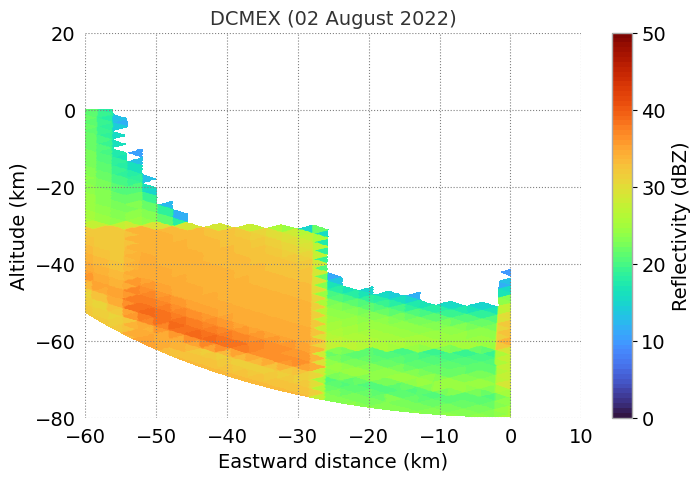

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


stime='2022-08-02T19:30:00.000000000'
etime='2022-08-02T20:00:00.000000000'

ds_sip_new = ds_4sip#.sel(ncells=mask,time=slice(stime, etime))

# ICON grid info
icon_lons = np.degrees(ds_sip_new['clon'].values)  # (ncells,)
icon_lats = np.degrees(ds_sip_new['clat'].values)  # (ncells,)

# Radar location
radar_lat = 34.0
radar_lon = -107.0
elev_angle = 4.0  # degrees

# Projection
import pyproj
proj = pyproj.Proj(proj='aeqd', lat_0=radar_lat, lon_0=radar_lon)
icon_x, icon_y = proj(icon_lons, icon_lats)  # (ncells,)

# PPI grid
azimuths = np.linspace(180, 270, 361)  # 0.25 deg steps
ranges = np.linspace(0, 80000, 400)    # up to 80 km, 200 m steps
az_grid, r_grid = np.meshgrid(azimuths, ranges, indexing='ij')
az_rad = np.radians(az_grid)

elev_rad = np.radians(elev_angle)
ppi_x = r_grid * np.sin(az_rad) * np.cos(elev_rad)
ppi_y = r_grid * np.cos(az_rad) * np.cos(elev_rad)
ppi_z = r_grid * np.sin(elev_rad)  # height above radar (meters)

# Prepare ICON vertical info
tidx = 0
z_mc = ds_sip_new['z_mc'].values[tidx]  # (height, ncells)
#dbz_icon = ds_4sip['dbz'].values[tidx]  # (height, ncells)
dbz_icon = ds_sip_new['dbz'].values[tidx]  # (height, ncells)
dbz_icon = np.where(dbz_icon <= -150, np.nan, dbz_icon)

nheight, ncells = z_mc.shape

# For each ICON cell, interpolate its vertical dBZ profile to the beam height at that cell
# The beam height at each ICON cell is the distance from radar to cell * sin(elev_angle)
# But for PPI, we want to interpolate horizontally at the beam height, so:
# For each ICON cell, get its (x, y), compute range from radar, then compute beam height

icon_range = np.sqrt(icon_x**2 + icon_y**2)
beam_height_icon = icon_range * np.sin(elev_rad)  # shape: (ncells,)

# Interpolate dBZ vertically for each cell to the beam height
dbz_at_beam = np.full(ncells, np.nan)
for i in range(ncells):
    z_profile = z_mc[:, i]
    dbz_profile = dbz_icon[:, i]
    # Remove NaNs
    mask = np.isfinite(z_profile) & np.isfinite(dbz_profile)
    z_valid = z_profile[mask]
    dbz_valid = dbz_profile[mask]
    if len(z_valid) > 1:
        # Sort by height
        sort_idx = np.argsort(z_valid)
        z_sorted = z_valid[sort_idx]
        dbz_sorted = dbz_valid[sort_idx]
        # Only interpolate if strictly increasing
        if np.all(np.diff(z_sorted) > 0):
            dbz_at_beam[i] = np.interp(
                beam_height_icon[i], z_sorted, dbz_sorted, left=np.nan, right=np.nan
            )
        #except Exception:
        #    dbz_at_beam[i] = np.nan

# Now, horizontally interpolate dbz_at_beam to the PPI grid
ppi_dbz = griddata(
    np.column_stack((icon_x, icon_y)), dbz_at_beam,
    (ppi_x, ppi_y), method='nearest'
)

# Plot
ppi_dbz_masked = np.where(ppi_dbz > 0, ppi_dbz, np.nan)
lev = np.linspace(0,50,80)
#lev = np.linspace(0, 60, 9)
cont_lev = range(0, 51, 10)
fontsize=14
# Plotting
plt.figure(figsize=(8, 5))
#fig, ax = plt.subplots(figsize=(8, 7))
x_km = ppi_x / 1000
y_km = ppi_y / 1000
#c = ax.contourf(x_km, y_km, ppi_dbz_masked, cmap='turbo', levels=lev)#, vmin=0, vmax=50)
cont = plt.contourf(x_km, y_km, ppi_dbz_masked, cmap='turbo', levels=lev, shading='auto')

#contour=plt.contour(-1*hor_dist, height, ds_rhi.refl, levels=cont_lev, colors='k', linestyles='-', linewidths=0.5)
#plt.clabel(contour, inline=True, fontsize=fontsize-2, fmt='%d')

plt.grid(True, linestyle=':', color='grey', alpha=1.0)
plt.xlim(-60, 10)
plt.ylim(-80, 20)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Eastward distance (km)', fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)
plt.title('DCMEX (02 August 2022)', fontsize=fontsize)
cb=plt.colorbar(cont, ticks=[0, 10, 20, 30, 40, 50], label='Reflectivity (dBZ)')
cb.ax.tick_params(labelsize=fontsize)
cb.set_label(label='Reflectivity (dBZ)', size=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
plt.show()

In [38]:
# Find ICON cells within 100 km of the radar (i.e., near the PPI grid)
icon_r = np.sqrt(icon_x**2 + icon_y**2)
near_radar = icon_r < 100000  # 100 km

print("ICON cells near radar:", np.sum(near_radar))
print("Valid dbz_at_beam near radar:", np.sum(~np.isnan(dbz_at_beam[near_radar])))
print("Sample dbz_at_beam near radar:", dbz_at_beam[near_radar][:20])


ICON cells near radar: 12696
Valid dbz_at_beam near radar: 9241
Sample dbz_at_beam near radar: [24.31297538 24.30809179 24.63296198 24.62984546 24.17690569 23.84980461
 23.85170308 23.40181734 23.41265084 23.75943685 23.74149374 24.18883624
 24.11893234 24.49173895 24.45806175 24.51906439 24.53704806 24.0919998
 24.44685735 24.49765927]


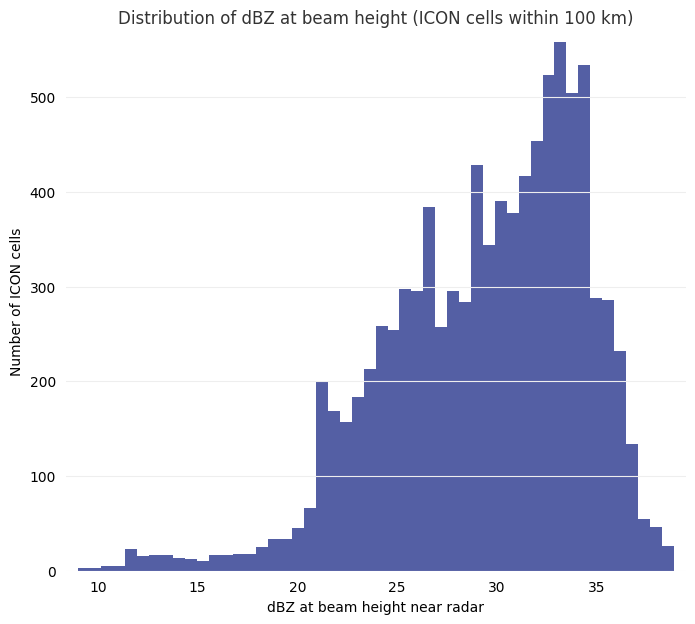

In [39]:
import matplotlib.pyplot as plt
plt.hist(dbz_at_beam[near_radar][~np.isnan(dbz_at_beam[near_radar])], bins=50)
plt.xlabel('dBZ at beam height near radar')
plt.ylabel('Number of ICON cells')
plt.title('Distribution of dBZ at beam height (ICON cells within 100 km)')
plt.show()


In [40]:
for i in np.where(near_radar)[0][:10]:
    z_profile = z_mc[:, i]
    dbz_profile = dbz_icon[:, i]
    mask = np.isfinite(z_profile) & np.isfinite(dbz_profile)
    z_valid = z_profile[mask]
    dbz_valid = dbz_profile[mask]
    print(f"Cell {i}: beam_height={beam_height_icon[i]}, z_min={z_valid.min() if len(z_valid)>0 else None}, z_max={z_valid.max() if len(z_valid)>0 else None}")


Cell 25535: beam_height=6874.07893767543, z_min=4432.85302734375, z_max=16438.19140625
Cell 25536: beam_height=6872.971849111119, z_min=4435.89306640625, z_max=16438.16796875
Cell 25537: beam_height=6944.983715366968, z_min=4445.87939453125, z_max=16438.16796875
Cell 25538: beam_height=6944.3279435635095, z_min=4446.89697265625, z_max=16438.171875
Cell 25540: beam_height=6843.954051547491, z_min=4440.47509765625, z_max=16438.138671875
Cell 25541: beam_height=6770.877406760349, z_min=4421.98681640625, z_max=16438.134765625
Cell 25542: beam_height=6771.502556886856, z_min=4436.29296875, z_max=16438.119140625
Cell 25543: beam_height=6670.502496393186, z_min=4411.9873046875, z_max=16438.072265625
Cell 25544: beam_height=6672.909418570332, z_min=4412.9697265625, z_max=16438.060546875
Cell 25545: beam_height=6750.637976842913, z_min=4425.318359375, z_max=16438.1015625


In [41]:

print("Valid PPI grid points after nearest interpolation:", np.sum(~np.isnan(ppi_dbz)))


Valid PPI grid points after nearest interpolation: 53141


In [42]:
print(ppi_dbz[~np.isnan(ppi_dbz)])

[ 9.84084745  9.84084745  9.84084745 ... 26.19034964 26.19034964
 26.19034964]


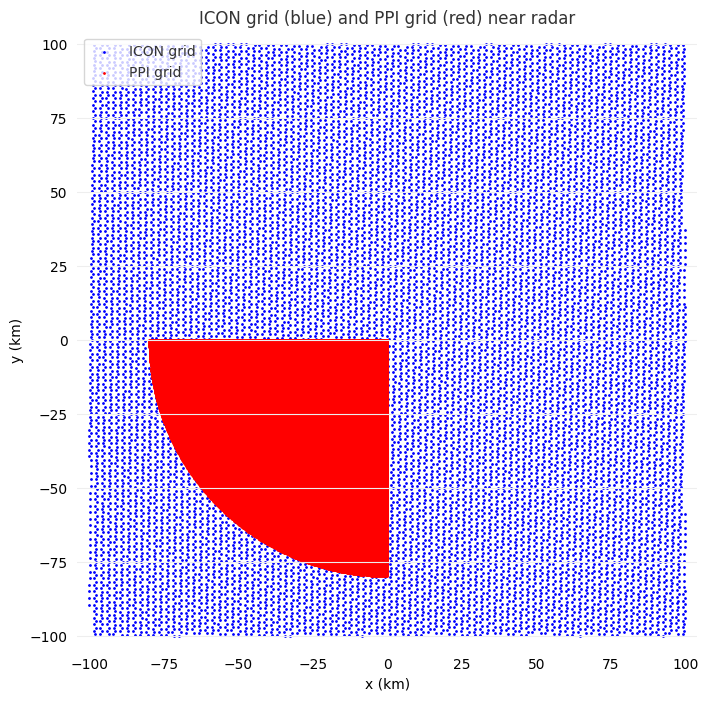

In [43]:

mask = (np.abs(icon_x) < 100000) & (np.abs(icon_y) < 100000)
plt.figure(figsize=(8,8))
plt.scatter(1.e-3*icon_x[mask], 1.e-3*icon_y[mask], s=1, color='b', label='ICON grid')
plt.scatter(1.e-3*ppi_x.flatten(), 1.e-3*ppi_y.flatten(), s=1, color='r', label='PPI grid')
plt.legend()
plt.xlabel('x (km)')
plt.ylabel('y (km)')
plt.title('ICON grid (blue) and PPI grid (red) near radar')
plt.show()


In [44]:
for i in range(0, len(icon_x), len(icon_x)//10):  # sample 10 cells
    print(f"Cell {i}: z_profile min={z_mc[:,i].min()}, max={z_mc[:,i].max()}, beam_height={beam_height_icon[i]}")

Cell 0: z_profile min=1439.6539306640625, max=20700.92578125, beam_height=26479.85029994643
Cell 6620: z_profile min=2573.577392578125, max=20700.92578125, beam_height=11348.964171954034
Cell 13240: z_profile min=2201.18505859375, max=20700.92578125, beam_height=13619.397886891818
Cell 19860: z_profile min=1754.9287109375, max=20700.92578125, beam_height=22881.56749768121
Cell 26480: z_profile min=1874.105224609375, max=20700.92578125, beam_height=3901.3096565792275
Cell 33100: z_profile min=1897.45263671875, max=20700.92578125, beam_height=12630.097916018167
Cell 39720: z_profile min=1437.7611083984375, max=20700.92578125, beam_height=4271.708877670428
Cell 46340: z_profile min=2008.3660888671875, max=20700.92578125, beam_height=7519.380838478913
Cell 52960: z_profile min=1578.5960693359375, max=20700.92578125, beam_height=2271.0240485570025
Cell 59580: z_profile min=2384.407958984375, max=20700.92578125, beam_height=23589.211218110308
Cell 66200: z_profile min=1857.5648193359375, max

In [45]:
print(np.sum(~np.isnan(dbz_at_beam)), "ICON cells have valid dBZ at beam height (after sorting)")


41340 ICON cells have valid dBZ at beam height (after sorting)


In [46]:
for i in range(0, len(icon_x), len(icon_x)//10):  # sample 10 cells
    print(f"Cell {i}:")
    print("z_profile:", z_mc[:, i])
    print("dbz_profile:", dbz_icon[:, i])
    print("Any NaNs in z_profile?", np.any(np.isnan(z_mc[:, i])))
    print("Any NaNs in dbz_profile?", np.any(np.isnan(dbz_icon[:, i])))


Cell 0:
z_profile: [20700.926  18707.63   17459.836  16435.898  15546.913  14750.141
 14025.778  13359.568  12741.68   12164.97   11624.041  11114.689
 10633.56   10177.919   9745.504   9334.414   8943.032   8569.965
  8214.001   7874.0767  7549.249   7238.6772  6941.603   6657.34
  6385.2593  6124.786   5875.386   5636.5635  5407.855   5188.8247
  4979.062   4778.1777  4585.8013  4401.58    4225.1777  4056.2715
  3894.552   3739.7224  3591.4983  3449.606   3313.7832  3183.779
  3059.3533  2940.2761  2826.3303  2717.3088  2613.0178  2513.275
  2417.9114  2326.7725  2239.719   2156.627   2077.3916  2001.9271
  1930.171   1862.0869  1797.6693  1736.9513  1680.0138  1627.0027
  1578.1548  1533.8469  1494.6989  1463.0829  1439.6539]
dbz_profile: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan 

In [47]:
for i in range(0, len(icon_x), len(icon_x)//10):
    print(f"Cell {i}: is monotonic?", np.all(np.diff(z_mc[:, i]) > 0))


Cell 0: is monotonic? False
Cell 6620: is monotonic? False
Cell 13240: is monotonic? False
Cell 19860: is monotonic? False
Cell 26480: is monotonic? False
Cell 33100: is monotonic? False
Cell 39720: is monotonic? False
Cell 46340: is monotonic? False
Cell 52960: is monotonic? False
Cell 59580: is monotonic? False
Cell 66200: is monotonic? False


In [48]:
print("Valid ICON cells at beam height:", np.sum(~np.isnan(dbz_at_beam)))
print("Valid PPI grid points after interpolation:", np.sum(~np.isnan(ppi_dbz)))
print("Valid PPI grid points >0 dBZ:", np.sum(ppi_dbz_masked > 0))


Valid ICON cells at beam height: 41340
Valid PPI grid points after interpolation: 53141
Valid PPI grid points >0 dBZ: 53141


# Get time-height REFL plot from PPI data

In [42]:
import re
from datetime import datetime

# Function to extract time and elevation from filenames using regex.

def parse_filename(filename):
    # Example: cfrad.20220802_190259.360_to_20220802_190305.238_SR1_v1_s00_el1.60_PPI.nc
    time_match = re.search(r'cfrad\.(\d{8}_\d{6}\.\d+)', filename)
    el_match = re.search(r'el(\d+\.\d+)', filename)
    if time_match and el_match:
        time_str = time_match.group(1)  # '20220802_190259.360'
        time = datetime.strptime(time_str, "%Y%m%d_%H%M%S.%f")
        elevation = float(el_match.group(1))
        return time, elevation
    else:
        return None, None


# Function to read Reflectivity (DBZ) and Range

def read_reflectivity(file):
    ds = xr.open_dataset(file)
    # Try common variable names
    for var in ['reflectivity', 'DBZ', 'ZH']:
        if var in ds.variables:
            refl = ds[var].values
            break
    else:
        raise ValueError(f"Reflectivity variable not found in {file}")
    # Range in meters
    if 'range' in ds.variables:
        rng = ds['range'].values
    else:
        rng = ds['gate'].values  # fallback
    ds.close()
    return refl, rng


#Build the Time-Height Matrix
#For each file:
    #Get the time (UTC), elevation (degrees), and reflectivity profile (as a function of range).
    #Convert elevation + range → height above radar (using simple trigonometry).
def range_elev_to_height(range_m, elev_deg):
    # Height above radar in km
    return range_m * np.sin(np.deg2rad(elev_deg)) / 1000.0


#Aggregate Data
#For each file, extract:
#    UTC time
#    Height array (from range and elevation)
#    Reflectivity profile (e.g., mean over azimuth)
#Store these in a list for later plotting.

import glob

#file_path='/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'
#ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195806.088_to_20220802_195811.678_SR1_v13_s00_az224.00_RHI.nc');

data = []
files = sorted(glob.glob("/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802/cfrad.*_PPI.nc"))  # adjust path as needed

for file in files:
    time, elev = parse_filename(file)
    if time is None:
        continue
    refl, rng = read_reflectivity(file)
    # Take mean over azimuth (axis 0 or 1, check shape)
    if refl.ndim == 2:
        # Usually (azimuth, range)
        refl_profile = np.nanmean(refl, axis=0)
    else:
        refl_profile = refl
    heights = range_elev_to_height(rng, elev)
    data.append({'time': time, 'height': heights, 'reflectivity': refl_profile})


In [100]:
# Define common height grid (e.g., 0 to 10 km, every 0.1 km)
height_grid = np.arange(0, 10, 0.1)
times = []
refl_matrix = []

for entry in data:
    times.append(entry['time'])
    # Interpolate reflectivity to common height grid
    interp_refl = np.interp(height_grid, entry['height'], entry['reflectivity'], left=np.nan, right=np.nan)
    refl_matrix.append(interp_refl)

refl_matrix = np.array(refl_matrix)  # shape: (ntimes, nheights)


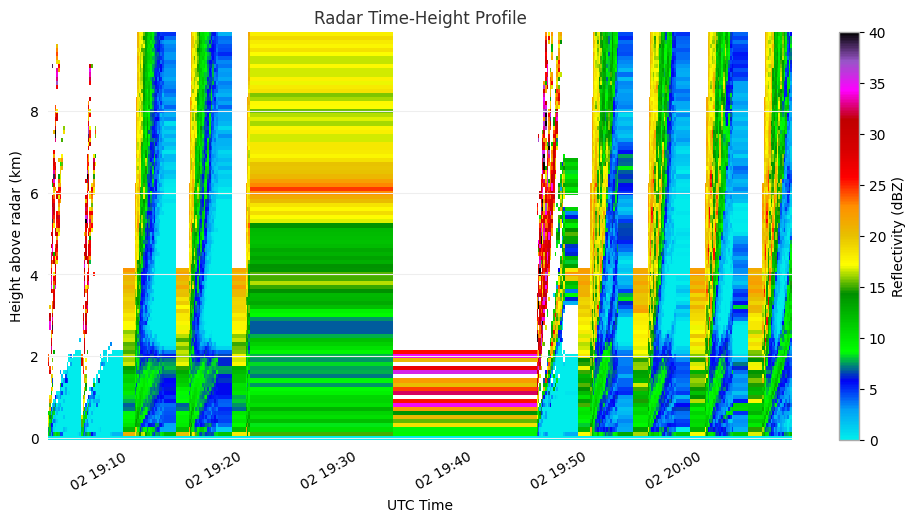

In [102]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, ax = plt.subplots(figsize=(12,6))
X, Y = np.meshgrid(mdates.date2num(times), height_grid)
pcm = ax.pcolormesh(X, Y, refl_matrix.T, cmap='pyart_NWSRef', shading='auto', vmin=0, vmax=40)
ax.set_ylabel("Height above radar (km)")
ax.set_xlabel("UTC Time")
ax.xaxis_date()
fig.autofmt_xdate()
plt.colorbar(pcm, label="Reflectivity (dBZ)")
plt.title("Radar Time-Height Profile")
plt.show()


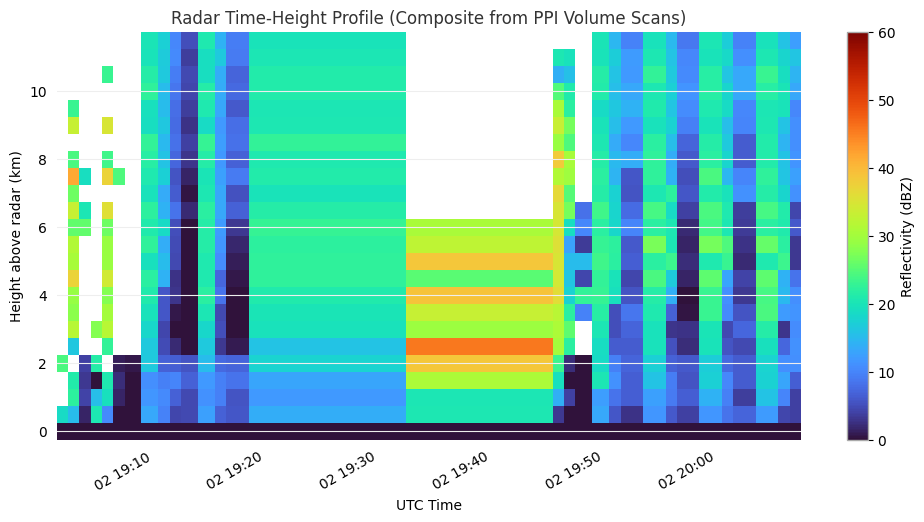

In [107]:
import re
from datetime import datetime, timedelta
import numpy as np
import xarray as xr
import glob
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# --- Helper functions ---

def parse_filename(filename):
    time_match = re.search(r'cfrad\.(\d{8}_\d{6})\.\d+', filename)
    el_match = re.search(r'el(\d+\.\d+)', filename)
    if time_match and el_match:
        time_str = time_match.group(1)  # '20220802_190259'
        time = datetime.strptime(time_str, "%Y%m%d_%H%M%S")
        elevation = float(el_match.group(1))
        return time, elevation
    else:
        return None, None

def read_reflectivity(file):
    ds = xr.open_dataset(file)
    for var in ['reflectivity', 'DBZ', 'ZH']:
        if var in ds.variables:
            refl = ds[var].values
            break
    else:
        raise ValueError(f"Reflectivity variable not found in {file}")
    if 'range' in ds.variables:
        rng = ds['range'].values
    else:
        rng = ds['gate'].values
    ds.close()
    return refl, rng

def range_elev_to_height(range_m, elev_deg):
    # Height above radar in km
    return range_m * np.sin(np.deg2rad(elev_deg)) / 1000.0

# --- Group files by volume scan time ---

files = sorted(glob.glob("/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802/cfrad.*_PPI.nc"))

# Group by volume scan: here, files within 1 minute are grouped together
volume_groups = defaultdict(list)
for file in files:
    time, elev = parse_filename(file)
    if time is None:
        continue
    # Round time to nearest minute for grouping
    vol_time = time.replace(second=0, microsecond=0)
    volume_groups[vol_time].append((file, elev))

# --- Build composite vertical profiles for each volume scan ---

height_grid = np.arange(0, 12, 0.5)  # 0 to 12 km, 100 m bins
time_list = []
refl_profiles = []

for vol_time, file_elev_list in sorted(volume_groups.items()):
    # For each elevation, get reflectivity and height
    all_heights = []
    all_refls = []
    for file, elev in file_elev_list:
        refl, rng = read_reflectivity(file)
        if refl.ndim == 2:
            refl_profile = np.nanmean(refl, axis=0)
        else:
            refl_profile = refl
        heights = range_elev_to_height(rng, elev)
        all_heights.append(heights)
        all_refls.append(refl_profile)
    # For each height in grid, take the max reflectivity from all elevations
    refl_at_heights = np.full_like(height_grid, np.nan, dtype=float)
    for i, h in enumerate(height_grid):
        vals = []
        for heights, refl_profile in zip(all_heights, all_refls):
            idx = np.abs(heights - h).argmin()
            # Use value if height is within 100 m
            if np.abs(heights[idx] - h) < 0.5:
                vals.append(refl_profile[idx])
        if vals:
            refl_at_heights[i] = np.nanmax(vals)
    time_list.append(vol_time)
    refl_profiles.append(refl_at_heights)

refl_matrix = np.array(refl_profiles)  # shape: (ntimes, nheights)

# --- Plotting ---

fig, ax = plt.subplots(figsize=(12,6))
X, Y = np.meshgrid(mdates.date2num(time_list), height_grid)
pcm = ax.pcolormesh(X, Y, refl_matrix.T, cmap='turbo', shading='auto', vmin=0, vmax=60)
ax.set_ylabel("Height above radar (km)")
ax.set_xlabel("UTC Time")
ax.xaxis_date()
fig.autofmt_xdate()
plt.colorbar(pcm, label="Reflectivity (dBZ)")
plt.title("Radar Time-Height Profile (Composite from PPI Volume Scans)")
plt.show()


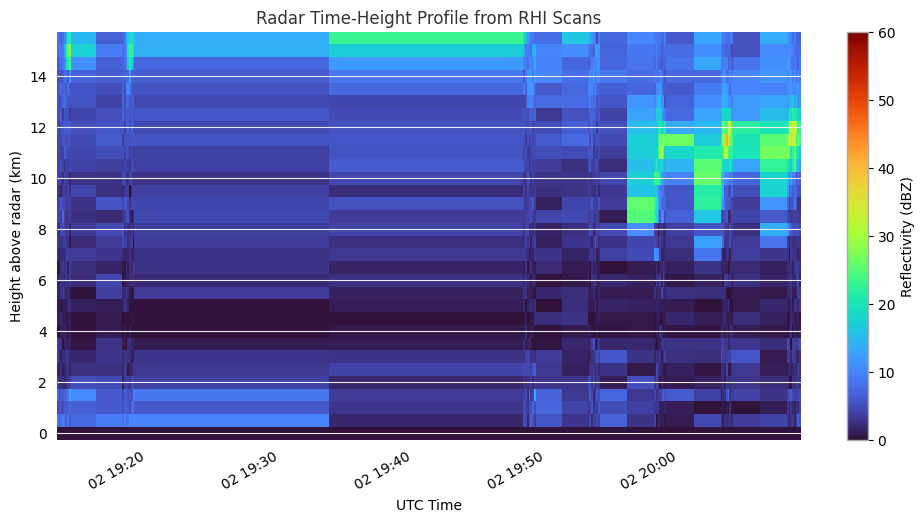

In [112]:
import xarray as xr
import numpy as np
import glob
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

def parse_rhi_filename(filename):
    # Example: cfrad.20220802_195806.088_to_20220802_195811.678_SR1_v13_s00_az224.00_RHI.nc
    import re
    time_match = re.search(r'cfrad\.(\d{8}_\d{6})\.\d+', filename)
    if time_match:
        time_str = time_match.group(1)
        time = datetime.strptime(time_str, "%Y%m%d_%H%M%S")
        return time
    else:
        return None

def range_elev_to_height(range_m, elev_deg):
    return range_m * np.sin(np.deg2rad(elev_deg)) / 1000.0  # km

# Get all RHI files
rhi_files = sorted(glob.glob("/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802/*RHI.nc"))
height_grid = np.arange(0, 16, 0.5)  # 0 to 16 km, 100 m bins
time_list = []
refl_profiles = []

for file in rhi_files:
    time = parse_rhi_filename(file)
    if time is None:
        continue
    ds = xr.open_dataset(file)
    # Find reflectivity variable
    for var in ['reflectivity', 'DBZ', 'ZH']:
        if var in ds.variables:
            refl = ds[var].values
            break
    else:
        continue
    # Get range and elevation
    rng = ds['range'].values  # meters
    elev = ds['elevation'].values  # degrees, shape (n_elevations,)
    # Average over azimuth if needed, or select a fixed azimuth slice
    # For a single RHI scan, usually one azimuth, multiple elevations
    # Take mean over azimuth if more than one
    if refl.ndim == 2:
        # (elevation, range)
        refl_profile = np.nanmean(refl, axis=0)
        elev_profile = np.nanmean(elev)
    else:
        refl_profile = refl
        elev_profile = elev
    heights = range_elev_to_height(rng, elev_profile)
    # Interpolate to common height grid
    interp_refl = np.interp(height_grid, heights, refl_profile, left=np.nan, right=np.nan)
    time_list.append(time)
    refl_profiles.append(interp_refl)
    ds.close()

refl_matrix = np.array(refl_profiles)

# Plot
fig, ax = plt.subplots(figsize=(12,6))
X, Y = np.meshgrid(mdates.date2num(time_list), height_grid)
pcm = ax.pcolormesh(X, Y, refl_matrix.T, cmap='turbo', shading='auto', vmin=0, vmax=60)
ax.set_ylabel("Height above radar (km)")
ax.set_xlabel("UTC Time")
ax.xaxis_date()
fig.autofmt_xdate()
plt.colorbar(pcm, label="Reflectivity (dBZ)")
plt.title("Radar Time-Height Profile from RHI Scans")
plt.show()


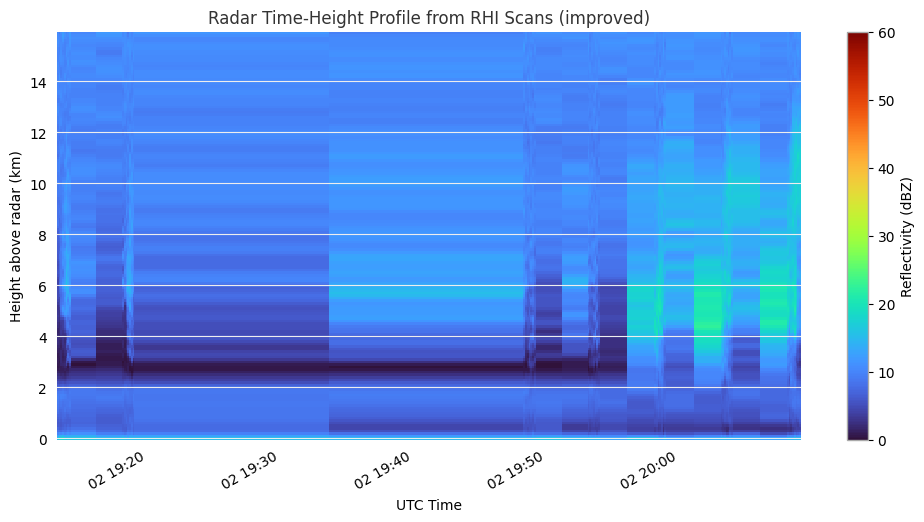

In [167]:
import matplotlib.dates as mdates
from scipy.ndimage import gaussian_filter1d

def parse_rhi_filename(filename):
    import re
    time_match = re.search(r'cfrad\.(\d{8}_\d{6})\.\d+', filename)
    if time_match:
        time_str = time_match.group(1)
        time = datetime.strptime(time_str, "%Y%m%d_%H%M%S")
        return time
    else:
        return None

def range_elev_to_height(range_m, elev_deg):
    # returns 2D array: (elevation, range)
    elev_rad = np.deg2rad(elev_deg)
    return range_m[None, :] * np.sin(elev_rad[:, None]) / 1000.0



# Get all RHI files
rhi_files = sorted(glob.glob("/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802/*RHI.nc"))

height_grid = np.arange(0, 16, 0.1)  # 0 to 16 km, 100 m bins
time_list = []
refl_profiles = []

for file in rhi_files:
    time = parse_rhi_filename(file)
    if time is None:
        continue
    ds = xr.open_dataset(file)
    # Find reflectivity variable
    for var in ['reflectivity', 'DBZ', 'ZH']:
        if var in ds.variables:
            refl = ds[var].values
            break
    else:
        continue
    rng = ds['range'].values  # meters
    elev = ds['elevation'].values  # degrees
    # refl shape: (elevation, range)
    heights = range_elev_to_height(rng, elev)
    # Flatten all (elevation, range) pairs into 1D arrays
    heights_flat = heights.flatten()
    refl_flat = refl.flatten()
    refl_flat[refl_flat <= -10] = np.nan
    # For each height in height_grid, take the max reflectivity from all (elev, range) pairs within 100 m
    refl_at_heights = np.full_like(height_grid, np.nan, dtype=float)
    for i, h in enumerate(height_grid):
        idx = np.where(np.abs(heights_flat - h) < 0.1)[0]
        if len(idx) > 0:
            refl_at_heights[i] = np.nanmean(refl_flat[idx])
    # Optional: smooth the profile (Gaussian filter)
    refl_at_heights = gaussian_filter1d(refl_at_heights, sigma=1, mode='nearest', truncate=2.0)
    time_list.append(time)
    refl_profiles.append(refl_at_heights)
    ds.close()

refl_matrix = np.array(refl_profiles)

# Plot
fig, ax = plt.subplots(figsize=(12,6))
X, Y = np.meshgrid(mdates.date2num(time_list), height_grid)
pcm = ax.pcolormesh(X, Y, refl_matrix.T, cmap='turbo', shading='auto', vmin=0, vmax=60)
ax.set_ylabel("Height above radar (km)")
ax.set_xlabel("UTC Time")
ax.xaxis_date()
fig.autofmt_xdate()
plt.colorbar(pcm, label="Reflectivity (dBZ)")
plt.title("Radar Time-Height Profile from RHI Scans (improved)")
plt.show()

In [ ]:

ds_rhi = xr.open_mfdataset('');
ds_rhi

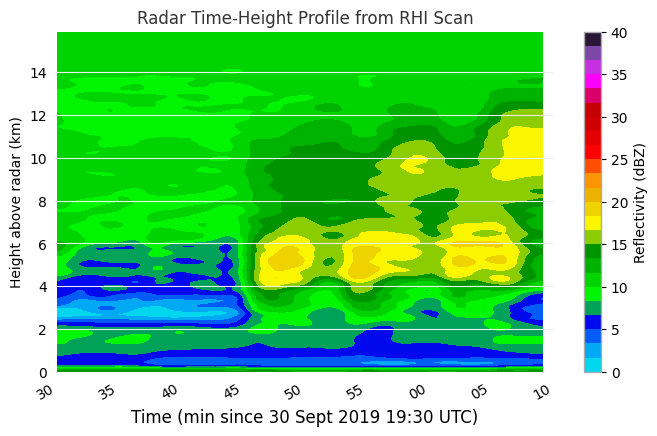

In [84]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter

import matplotlib.dates as mdates
from scipy.ndimage import gaussian_filter1d

def parse_rhi_filename(filename):
    import re
    time_match = re.search(r'cfrad\.(\d{8}_\d{6})\.\d+', filename)
    if time_match:
        time_str = time_match.group(1)
        time = datetime.strptime(time_str, "%Y%m%d_%H%M%S")
        return time
    else:
        return None

def range_elev_to_height(range_m, elev_deg):
    # returns 2D array: (elevation, range)
    elev_rad = np.deg2rad(elev_deg)
    return range_m[None, :] * np.sin(elev_rad[:, None]) / 1000.0



# Get all RHI files
rhi_files = sorted(glob.glob("/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802/*RHI.nc"))

height_grid = np.arange(0, 16, 0.1)  # 0 to 16 km, 100 m bins
time_list = []
refl_profiles = []

for file in rhi_files:
    time = parse_rhi_filename(file)
    if time is None:
        continue
    ds = xr.open_dataset(file)
    # Find reflectivity variable
    for var in ['reflectivity', 'DBZ', 'ZH']:
        if var in ds.variables:
            refl = ds[var].values
            break
    else:
        continue
    rng = ds['range'].values  # meters
    elev = ds['elevation'].values  # degrees
    # refl shape: (elevation, range)
    heights = range_elev_to_height(rng, elev)
    # Flatten all (elevation, range) pairs into 1D arrays
    heights_flat = heights.flatten()
    refl_flat = refl.flatten()
    refl_flat[refl_flat <= -10] = np.nan
    # For each height in height_grid, take the max reflectivity from all (elev, range) pairs within 100 m
    refl_at_heights = np.full_like(height_grid, np.nan, dtype=float)
    for i, h in enumerate(height_grid):
        idx = np.where(np.abs(heights_flat - h) < 0.1)[0]
        if len(idx) > 0:
            refl_at_heights[i] = np.nanmean(refl_flat[idx])
    # Optional: smooth the profile (Gaussian filter)
    refl_at_heights = gaussian_filter1d(refl_at_heights, sigma=1, mode='nearest', truncate=2.0)
    time_list.append(time)
    refl_profiles.append(refl_at_heights)
    ds.close()

refl_matrix = np.array(refl_profiles)


# Prepare the grid
ntime, nheight = refl_matrix.shape
T, H = np.meshgrid(np.arange(ntime), height_grid, indexing='ij')  # Use 'ij' indexing!
mask = ~np.isnan(refl_matrix)
points = np.column_stack((T[mask], H[mask]))
values = refl_matrix[mask]


# Define a finer grid for interpolation
fine_time = np.linspace(0, ntime-1, ntime*2)
fine_height = np.linspace(height_grid[0], height_grid[-1], nheight*4)
Fine_T, Fine_H = np.meshgrid(fine_time, fine_height)

# Interpolate
refl_interp = griddata(points, values, (Fine_T, Fine_H), method='nearest')

# Optional: smooth with a Gaussian filter
refl_smooth = gaussian_filter(refl_interp, sigma=2)

# Plot
lev=np.linspace(0,40,25)
fig, ax = plt.subplots(figsize=(8,5))
# Convert fine_time to datetime for x-axis
fine_time_dt = mdates.date2num([time_list[0] + (time_list[-1]-time_list[0]) * t/(ntime-1) for t in fine_time])
pcm = ax.contourf(fine_time_dt, fine_height, refl_smooth, cmap='pyart_NWSRef', levels=lev)#, shading='auto', vmin=0, vmax=60)
ax.set_ylabel("Height above radar (km)")
ax.set_xlabel("UTC Time")
ax.xaxis_date()
fig.autofmt_xdate()
plt.xlabel('Time (min since 30 Sept 2019 19:30 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%M'))
start_date = datetime(2022, 8, 2, 19, 30) 
end_date = datetime(2022, 8, 2, 20, 10)

plt.xlim(start_date, end_date)
plt.colorbar(pcm, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40] ,label="Reflectivity (dBZ)")
plt.title("Radar Time-Height Profile from RHI Scan")
plt.show()


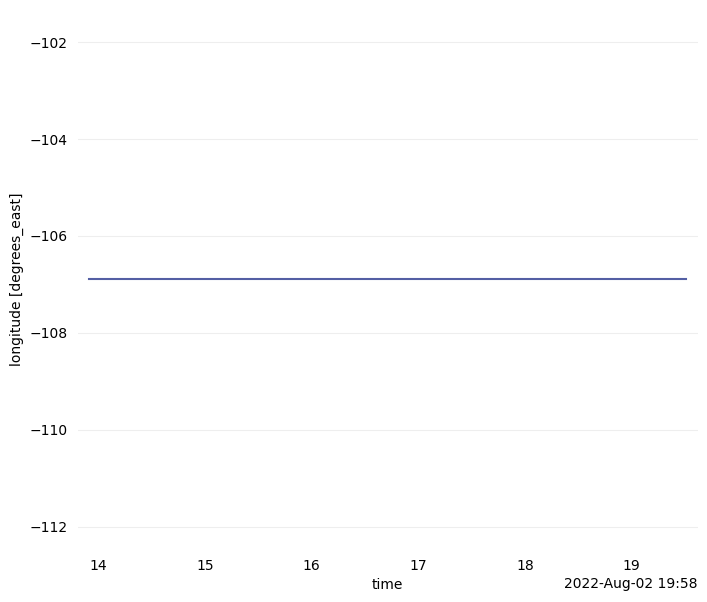

In [71]:

ds_rhi.longitude.plot()

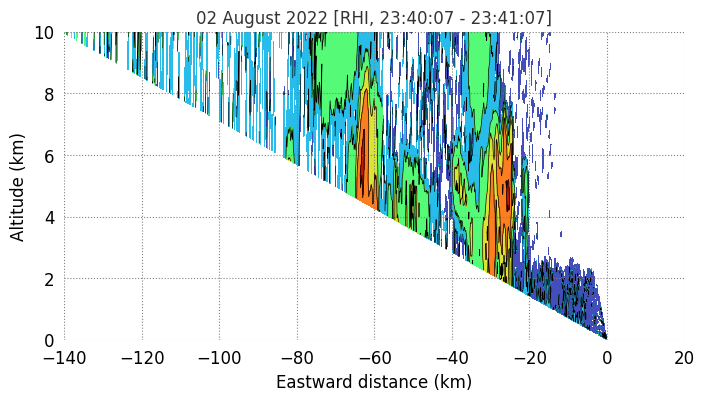

In [85]:


ds_rhi = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802/cfrad.20220802_195813.915_to_20220802_195819.506_SR1_v13_s01_az225.50_RHI.nc');


ds_rhi['refl'] = xr.where(ds_rhi.DBZ > 0., ds_rhi.DBZ, np.nan)
 
## Need to convert radar data from polar to cartesian coordinate to plot properly 

## To plot range-height plot, convert data into horizontal distance and height from ds.range and ds.elevation 

# Get azimuth and range, convert to radians and km

theta_elev = ds_rhi['elevation'].values             # shape: (elevation,)
range_gate = ds_rhi['range'].values * 1e-3     # convert m to km, shape: (range,)
theta = np.deg2rad(theta_elev)                # radians


# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
hor_dist = r_grid * np.cos(theta_grid)            # horizontal distance (km)
height = r_grid * np.sin(theta_grid)            # height (km)

# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
hor_dist = r_grid * np.cos(theta_grid)            # horizontal distance (km)
height = r_grid * np.sin(theta_grid)            # height (km)

lev = np.linspace(0, 60, 7)
cont_lev = range(0, 51, 10)
fontsize=12


# Plotting
plt.figure(figsize=(8, 4))
cont = plt.contourf(-1*hor_dist, height, ds_rhi.refl, cmap='turbo', levels=lev, shading='auto')

contour=plt.contour(-1*hor_dist, height, ds_rhi.refl, levels=cont_lev, colors='k', linestyles='-', linewidths=0.5)
#plt.clabel(contour, inline=True, fontsize=fontsize-2, fmt='%d')

plt.grid(True, linestyle=':', color='grey', alpha=1.0)
plt.xlim(-140, 20)
plt.ylim(0, 10)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Eastward distance (km)', fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)
plt.title('02 August 2022 [RHI, 23:40:07 - 23:41:07]', fontsize=fontsize)
#cb=plt.colorbar(cont, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], label='Reflectivity (dBZ)')
#cb.ax.tick_params(labelsize=fontsize)
#cb.set_label(label='Reflectivity (dBZ)', size=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

plt.show()

In [43]:

#ds_4sip = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/control/dcmex_2mom_sip/NWP_*.nc');

stime='2022-08-02T19:30:00.000000000'
etime='2022-08-02T21:00:00.000000000'

ds_refl_4sip = ds_4sip.sel(time=slice(stime, etime))

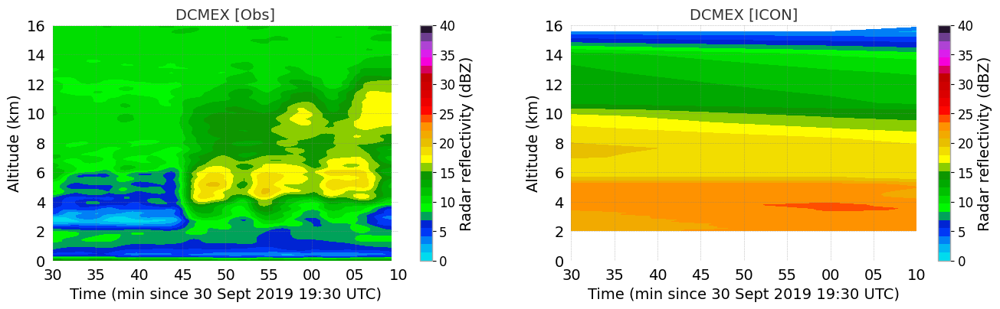

In [90]:

#ds_4sip = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/control/dcmex_2mom_sip/NWP_*.nc');

stime='2022-08-02T19:30:00.000000000'
etime='2022-08-02T21:00:00.000000000'

ds_refl_4sip = ds_4sip.sel(time=slice(stime, etime))


avg_ht = 1.e-3*ds_refl_4sip.z_mc.mean(dim=('time','ncells'))
avg_refl_sip = ds_refl_4sip.dbz.where(ds_refl_4sip.dbz > 0).mean(dim=('ncells'))
#avg_refl_sip = ds_4sip.dbz.mean(dim=('ncells'))

colors = ['cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod', 
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']
cmap = ListedColormap(colors)

lnwdth = 3
fontsize = 14
lev = np.linspace(0, 40, 30)

plt.figure(figsize=(16, 4))

plt.subplot(1,2,1)
contour = plt.contourf(fine_time_dt, fine_height, refl_smooth, cmap='pyart_NWSRef', levels=lev)
#colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Radar reflectivity (dBZ)')
colorbar = plt.colorbar(contour, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)

plt.xlabel('Time (min since 30 Sept 2019 19:30 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%M'))
start_date = datetime(2022, 8, 2, 19, 30) 
end_date = datetime(2022, 8, 2, 20, 10)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX [Obs]', fontsize=fontsize)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
contour = plt.contourf(ds_refl_4sip.time, avg_ht, avg_refl_sip.T, cmap='pyart_NWSRef', levels=lev)
#colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Radar reflectivity (dBZ)')
colorbar = plt.colorbar(contour, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)

plt.xlabel('Time (min since 30 Sept 2019 19:30 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%M'))
start_date = datetime(2022, 8, 2, 19, 30) 
end_date = datetime(2022, 8, 2, 20, 10)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX [ICON]', fontsize=fontsize)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()



### ICON reflectivity cross-section along 107°W and 34°N (Corresponding to RHI scan)


[0.06301077 0.06309677 0.06291778 ... 0.04931729 0.04919362 0.04931526]


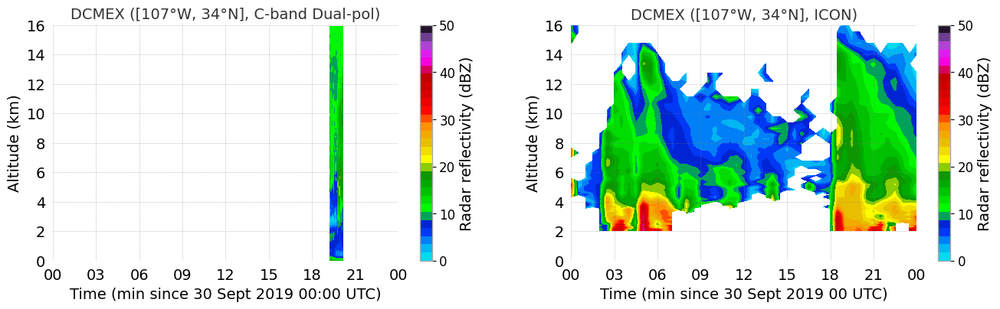

In [91]:
import numpy as np

# Convert target coordinates to radians
target_lon_rad = np.deg2rad(-107)
target_lat_rad = np.deg2rad(34)

# Extract lon/lat arrays (no parentheses!)
clon = ds_4sip.clon.values
clat = ds_4sip.clat.values

# Define a tolerance (in radians, e.g., ~0.01 rad ≈ 60 km)
tolerance = 0.01

# Find closest cells within the tolerance
distance = np.sqrt((clon - target_lon_rad)**2 + (clat - target_lat_rad)**2)
selected_cells = np.where(distance < tolerance)[0]

print(distance)
# Extract dbz for those cells
dbz_section = ds_4sip['dbz'][:, :, selected_cells]


avg_ht = 1.e-3*ds_4sip.z_mc.mean(dim=('time','ncells'))
avg_refl_sip = dbz_section.where(dbz_section > 0).mean(dim=('ncells'))


######### Plotting

lnwdth = 3
fontsize = 14
lev = np.linspace(0, 50, 30)

plt.figure(figsize=(16, 4))

plt.subplot(1,2,1)
contour = plt.contourf(fine_time_dt, fine_height, refl_smooth, cmap='pyart_NWSRef', levels=lev)
#colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Radar reflectivity (dBZ)')
colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)

plt.xlabel('Time (min since 30 Sept 2019 00:00 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2022, 8, 2, 0, 0) 
end_date = datetime(2022, 8, 3, 0, 0)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX ([107°W, 34°N], C-band Dual-pol)', fontsize=fontsize)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
contour = plt.contourf(ds_4sip.time, avg_ht, avg_refl_sip.T, cmap='pyart_NWSRef', levels=lev)
#colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Radar reflectivity (dBZ)')
colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)

plt.xlabel('Time (min since 30 Sept 2019 00 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2022, 8, 2, 0, 0) 
end_date = datetime(2022, 8, 3, 0, 0)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX ([107°W, 34°N], ICON)', fontsize=fontsize)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()

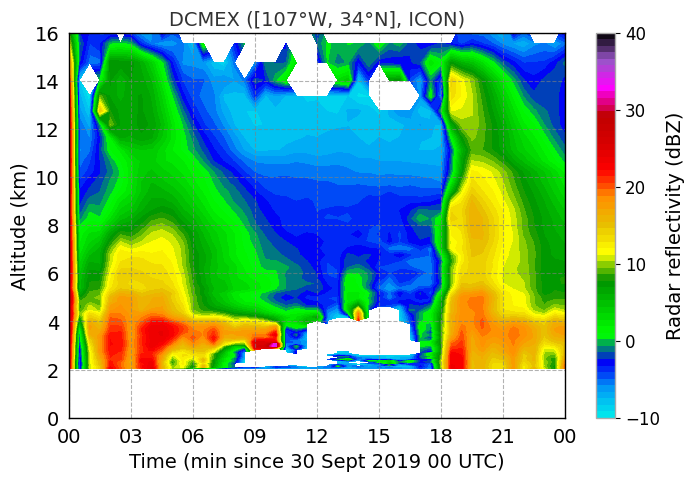

In [100]:

filt_refl = xr.where(ds_4sip.dbz > -10., ds_4sip.dbz, np.nan)

avg_filt_refl = filt_refl.mean('ncells')

lev=np.linspace(-10., 40, 60)
plt.figure(figsize=(8,5))
#contour = plt.contourf(ds_4sip.time, avg_ht, avg_refl_sip.T, cmap='pyart_NWSRef', levels=lev)

contour = plt.contourf(ds_4sip.time, avg_ht, avg_filt_refl.T, cmap='pyart_NWSRef', levels=lev)


#colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Radar reflectivity (dBZ)')
colorbar = plt.colorbar(contour, ticks=[-10, 0, 10, 20, 30, 40], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)

plt.xlabel('Time (min since 30 Sept 2019 00 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2022, 8, 2, 0, 0) 
end_date = datetime(2022, 8, 3, 0, 0)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX ([107°W, 34°N], ICON)', fontsize=fontsize)

plt.grid(True, linestyle='--', color='grey', alpha=0.6)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
plt.show()

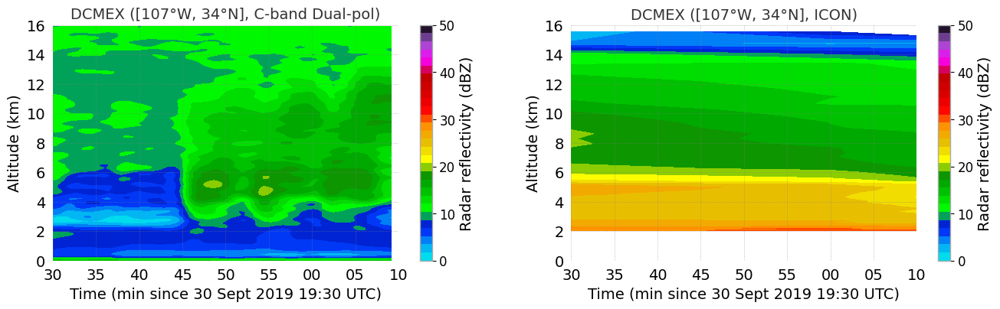

In [108]:

lnwdth = 3
fontsize = 14
lev = np.linspace(0, 50, 30)

plt.figure(figsize=(16, 4))

plt.subplot(1,2,1)
contour = plt.contourf(fine_time_dt, fine_height, refl_smooth, cmap='pyart_NWSRef', levels=lev)
#colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Radar reflectivity (dBZ)')
colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)

plt.xlabel('Time (min since 30 Sept 2019 19:30 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%M'))
start_date = datetime(2022, 8, 2, 19, 30) 
end_date = datetime(2022, 8, 2, 20, 10)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX ([107°W, 34°N], C-band Dual-pol)', fontsize=fontsize)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
contour = plt.contourf(ds_4sip.time, avg_ht, avg_refl_sip.T, cmap='pyart_NWSRef', levels=lev)
#colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Radar reflectivity (dBZ)')
colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)

plt.xlabel('Time (min since 30 Sept 2019 19:30 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%M'))
start_date = datetime(2022, 8, 2, 19, 30) 
end_date = datetime(2022, 8, 2, 20, 10)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX ([107°W, 34°N], ICON)', fontsize=fontsize)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)
plt.show()

## Radar PX-1000 data analysis

In [60]:
ds_rhi

<xarray.Dataset> Size: 1MB
Dimensions:                           (frequency: 1, sweep: 1, r_calib: 1,
                                       time: 40, range: 1001)
Coordinates:
  * frequency                         (frequency) float32 4B 5.593e+09
  * time                              (time) datetime64[ns] 320B 2022-08-02T1...
  * range                             (range) float32 4kB 0.0 150.0 ... 1.5e+05
Dimensions without coordinates: sweep, r_calib
Data variables: (12/135)
    volume_number                     float64 8B ...
    platform_type                     |S32 32B ...
    primary_axis                      |S32 32B ...
    status_xml                        |S1 1B ...
    instrument_type                   |S32 32B ...
    radar_antenna_gain_h              float32 4B ...
    ...                                ...
    ZDR                               (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    KDP                               (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    PHIDP                             (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    SQI                               (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    RHOHV                             (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    DBZV                              (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
Attributes: (12/25)
    Conventions:          CF-1.7
    Sub_conventions:      CF-Radial instrument_parameters radar_parameters ra...
    version:              CF-Radial-1.4
    title:                RHI_DCM
    institution:          
    references:           Conversi
    ...                   ...
    site_name:            SR1
    scan_name:            
    scan_id:              0
    platform_is_mobile:   false
    n_gates_vary:         false
    ray_times_increase:   true

In [44]:
file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195813.915_to_20220802_195819.506_SR1_v13_s01_az225.50_RHI.nc');


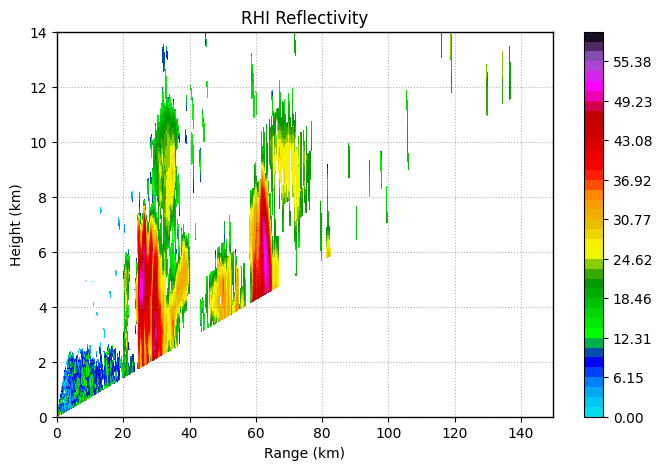

In [45]:
import wradlib as wrl

file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195813.915_to_20220802_195819.506_SR1_v13_s01_az225.50_RHI.nc');

filt_refl = xr.where(ds_rhi.ZDR > 1., ds_rhi.DBZ, np.nan)

import matplotlib.pyplot as plt
import numpy as np

# Assume 'reflectivity' is [elevation, range]


####################################
refl = ds_rhi['DBZ'].values
theta_elev = ds_rhi['elevation'].values             # shape: (elevation,)
range_gate = ds_rhi['range'].values * 1e-3     # convert m to km, shape: (range,)
theta = np.deg2rad(theta_elev)                # radians


# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
hor_dist = r_grid * np.cos(theta_grid)            # horizontal distance (km)
alt_km = r_grid * np.sin(theta_grid)            # height (km)
####################################

lev=np.linspace(0,60,40)
#lev=np.linspace(0,6,40)
plt.figure(figsize=(8,5))
plt.contourf(hor_dist, alt_km, filt_refl, cmap='pyart_NWSRef', levels=lev)

#plt.xlim(0,140)
plt.ylim(0,14)
plt.xlabel('Range (km)')
plt.ylabel('Height (km)')
plt.title('RHI Reflectivity')
plt.colorbar()#ticks=[0,10,20,30,40,50,60], label='dBZ')

plt.grid(True, linestyle=':', color='grey', alpha=0.6)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
    
plt.show()




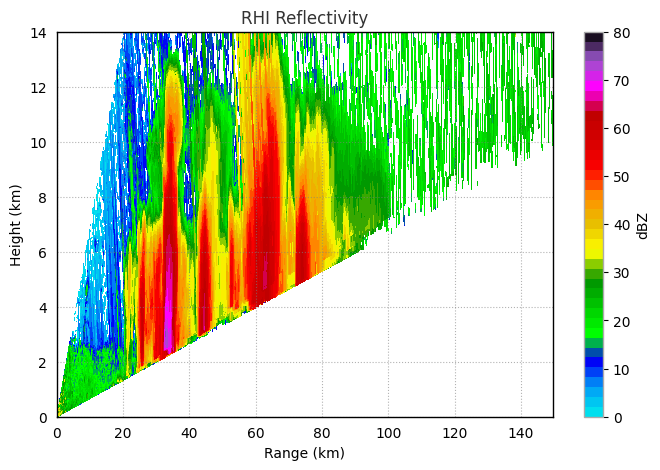

In [125]:
file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.*_RHI.nc');



filt_refl = xr.where(ds_rhi.ZDR > 1., ds_rhi.DBZ, np.nan)

import matplotlib.pyplot as plt
import numpy as np

# Assume 'reflectivity' is [elevation, range]


####################################
refl = ds_rhi['DBZ'].values
theta_elev = ds_rhi['elevation'].values             # shape: (elevation,)
range_gate = ds_rhi['range'].values * 1e-3     # convert m to km, shape: (range,)
theta = np.deg2rad(theta_elev)                # radians


# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
hor_dist = r_grid * np.cos(theta_grid)            # horizontal distance (km)
alt_km = r_grid * np.sin(theta_grid)            # height (km)
####################################

lev=np.linspace(0,80,40)
#lev=np.linspace(0,6,40)
plt.figure(figsize=(8,5))
plt.contourf(hor_dist, alt_km, filt_refl, cmap='pyart_NWSRef', levels=lev)

#plt.xlim(0,140)
plt.ylim(0,14)
plt.xlabel('Range (km)')
plt.ylabel('Height (km)')
plt.title('RHI Reflectivity')
plt.colorbar(ticks=[0,10,20,30,40,50,60,70,80], label='dBZ')

plt.grid(True, linestyle=':', color='grey', alpha=0.6)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
    
plt.show()

In [32]:

filt_refl.mean('time')
alt_km.mean(axis=0).shape

(1001,)

In [46]:

file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.*_RHI.nc');

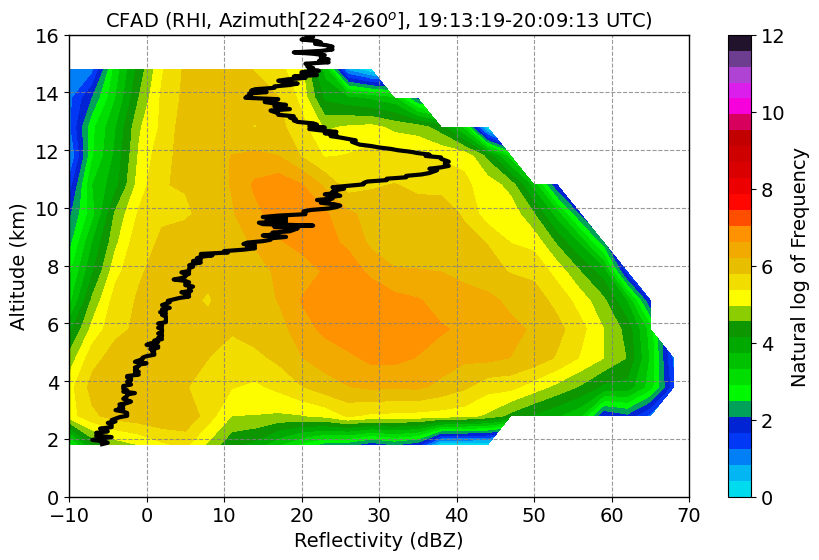

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.*_RHI.nc');

# 1. Extract reflectivity and compute height grid
refl = ds_rhi['DBZ'].values                  # shape: (elevation, range)
theta_elev = ds_rhi['elevation'].values      # (elevation,)
range_gate = ds_rhi['range'].values * 1e-3   # (range,) in km

# 2. Build 2D grids for range and elevation
r_grid, theta_grid = np.meshgrid(range_gate, theta_elev)
alt_km = r_grid * np.sin(np.deg2rad(theta_grid))  # height (km)

filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV > 0.97)
filt_refl = xr.where(filt_cond, ds_rhi.DBZ, np.nan)

# 3. Flatten both arrays to 1D for histogramming
refl_flat = filt_refl.values.flatten()
alt_flat = alt_km.flatten()

# 4. Filter out NaNs and physically unrealistic values
mask = (~np.isnan(refl_flat)) & (~np.isnan(alt_flat)) & (refl_flat > -10) & (alt_flat >= 0)
refl_flat = refl_flat[mask]
alt_flat = alt_flat[mask]

# 5. Define bins
dbz_bins = np.arange(-10, 81, 3)   # dBZ bins from -10 to 80 in 1 dBZ steps
alt_bins = np.arange(0.8, 15.1, 1.) # Altitude bins from 0 to 15 km in 0.1 km steps

#dbz_bins = np.linspace(-10, 81, 60)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_bins = np.linspace(0, 15.1, 60) # Altitude bins from 0 to 15 km in 0.1 km steps

# 6. 2D Histogram (CFAD)
cfad, xedges, yedges = np.histogram2d(refl_flat, alt_flat, bins=[dbz_bins, alt_bins])

# Optional: Normalize by altitude (so each row sums to 1)
cfad_norm = cfad / np.maximum(cfad.sum(axis=0, keepdims=True), 1)

cfad_smooth = gaussian_filter(np.log(cfad.T + 1), sigma=1.0)
##########################################


##############################################
med_filt_refl_obs = filt_refl.median('time')
mean_alt_km_obs   = alt_km.mean(axis=0)

med_filt_refl_obs[mean_alt_km_obs < 1.8] = np.nan
##############################################

ln=3
fnt=14
lev=np.linspace(0,12,30)
# 7. Plot CFAD
plt.figure(figsize=(10, 6))
plt.style.use('default')
X, Y = np.meshgrid(dbz_bins, alt_bins)
#pcm = plt.pcolormesh(X, Y, np.log(cfad.T), cmap='pyart_NWSRef', shading='auto')


pcm = plt.contourf(dbz_bins[:-1], 1.+alt_bins[:-1], np.log(cfad.T), cmap='pyart_NWSRef', levels=lev)  # altitude is adjusted to match the actual  
                                                                                                      # station (34.022°N, 106.89°W) altitude (~1.1 km) 
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='HomeyerRainbow', levels=lev)

plt.plot(med_filt_refl_obs[:-1], mean_alt_km_obs[:-1], 'k-', linewidth=ln)
plt.xlabel('Reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CFAD (RHI, Azimuth[224-260$^{o}$], 19:13:19-20:09:13 UTC)', fontsize=fnt)
cbar = plt.colorbar(pcm, ticks=[0, 2, 4, 6, 8, 10, 12])#, label='Natural log of Frequency')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

plt.ylim(0, 16)
plt.xlim(-10, 70)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle='--', color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
    
plt.show()


In [27]:

np.max(alt_km)

np.float32(149.67427)

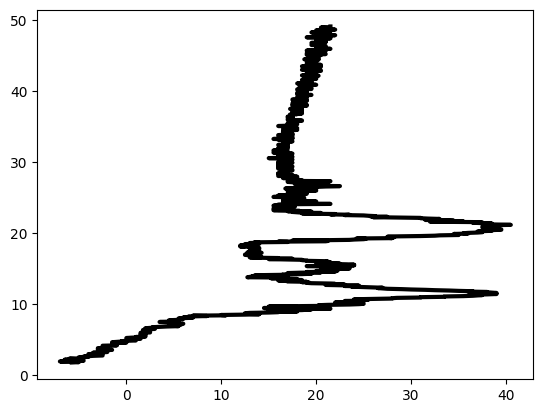

In [24]:

plt.plot(med_filt_refl_obs[:-1], mean_alt_km_obs[:-1], 'k-', linewidth=ln)

## ICON CFAD

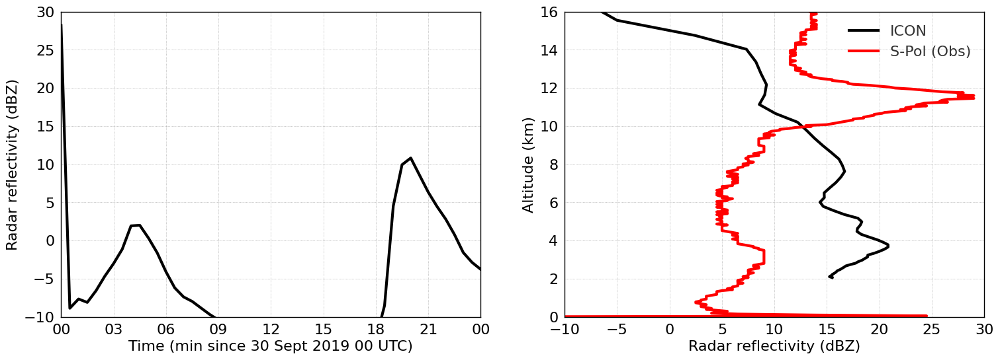

In [180]:

filt_refl_4sip = xr.where(ds_4sip.dbz > -20., ds_4sip.dbz, np.nan);
alt_4sip_km = 1.e-3*ds_4sip.z_mc

ds_filt_4sip1 = ds_4sip.sel(time=slice('2022-08-02T19:00:00.000000000','2022-08-02T20:30:00.000000000'))
filt_refl_4sip1 = xr.where(ds_filt_4sip1.dbz > -10., ds_filt_4sip1.dbz, np.nan);
alt_4sip_km1 = 1.e-3*ds_filt_4sip1.z_mc

ln=3
fnt=16
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
plt.plot(ds_4sip.time, filt_refl_4sip.median(dim=('height','ncells')), 'k-', linewidth=ln)
plt.xlabel('Time (min since 30 Sept 2019 00 UTC)', fontsize=fnt)
plt.ylabel('Radar reflectivity (dBZ)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2022, 8, 2, 0, 0) 
end_date = datetime(2022, 8, 3, 0, 0)

plt.xlim(start_date, end_date)
plt.ylim(-10,30)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')



plt.subplot(1,2,2)
plt.plot(filt_refl_4sip1.median(dim=('time','ncells')), alt_4sip_km1.mean(dim=('time','ncells')), 'k-', linewidth=ln, label='ICON')

plt.plot(filt_refl.median('time'), alt_km.mean(axis=0), 'r-', linewidth=ln, label='S-Pol (Obs)')
plt.xlabel('Radar reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2022, 8, 2, 0, 0) 
end_date = datetime(2022, 8, 3, 0, 0)

plt.xlim(-10, 30)
plt.ylim(0,16)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.legend(frameon=False, loc='best', fontsize=fnt)


for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
    
plt.show()

In [ ]:



filt_refl = xr.where(ds_4sip.dbz > -10., ds_4sip.dbz, np.nan)

avg_filt_refl = filt_refl.mean('ncells')

lev=np.linspace(-10., 40, 60)
plt.figure(figsize=(8,5))
#contour = plt.contourf(ds_4sip.time, avg_ht, avg_refl_sip.T, cmap='pyart_NWSRef', levels=lev)

contour = plt.contourf(ds_4sip.time, avg_ht, avg_filt_refl.T, cmap='pyart_NWSRef', levels=lev)


#colorbar = plt.colorbar(contour, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Radar reflectivity (dBZ)')
colorbar = plt.colorbar(contour, ticks=[-10, 0, 10, 20, 30, 40], label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fontsize)

plt.xlabel('Time (min since 30 Sept 2019 00 UTC)', fontsize=fontsize)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2022, 8, 2, 0, 0) 
end_date = datetime(2022, 8, 3, 0, 0)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fontsize)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

plt.title('DCMEX ([107°W, 34°N], ICON)', fontsize=fontsize)

plt.grid(True, linestyle='--', color='grey', alpha=0.6)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
plt.show()


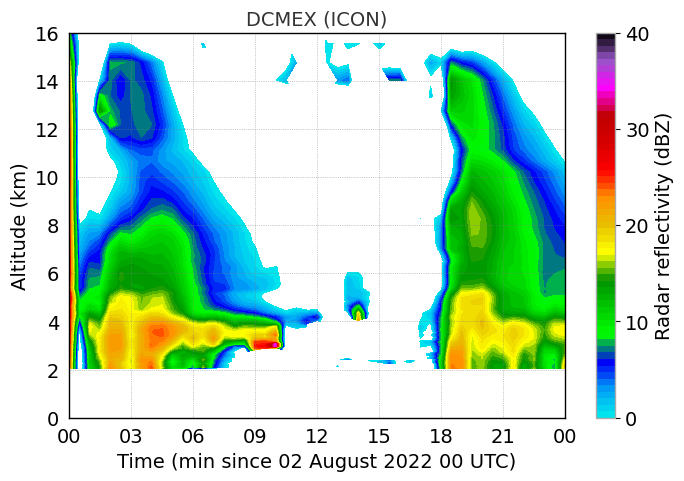

In [105]:


filt_refl = xr.where(ds_4sip.dbz > -10., ds_4sip.dbz, np.nan)

avg_filt_refl = filt_refl.mean('ncells')

lev=np.linspace(0,40,60)
fnt=14;

plt.figure(figsize=(8,5))
#cnt=plt.contourf(ds_4sip.time, 1.e-3*ds_4sip.z_mc.mean(dim=('time','ncells')), ds_4sip.dbz.mean(dim=('ncells')).T, cmap='pyart_NWSRef', levels=lev)
cnt=plt.contourf(ds_4sip.time, 1.e-3*ds_4sip.z_mc.mean(dim=('time','ncells')), avg_filt_refl.T, cmap='pyart_NWSRef', levels=lev)
colorbar = plt.colorbar(cnt, ticks=[-10, 0, 10, 20, 30, 40], label='Radar reflectivity (dBZ)')
#colorbar = plt.colorbar(cnt, label='Radar reflectivity (dBZ)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fnt)

plt.xlabel('Time (min since 02 August 2022 00 UTC)', fontsize=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2022, 8, 2, 0, 0) 
end_date = datetime(2022, 8, 3, 0, 0)

plt.xlim(start_date, end_date)

plt.xticks(fontsize=fnt)

plt.ylim([0, 16])
plt.yticks([0, 2, 4, 6, 8, 10, 12, 14, 16], fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.title('DCMEX (ICON)', fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
    
plt.show()

In [184]:

print(ds_4sip.z_mc.min().values, ds_4sip.z_mc.max().values)

1169.7472 20700.926


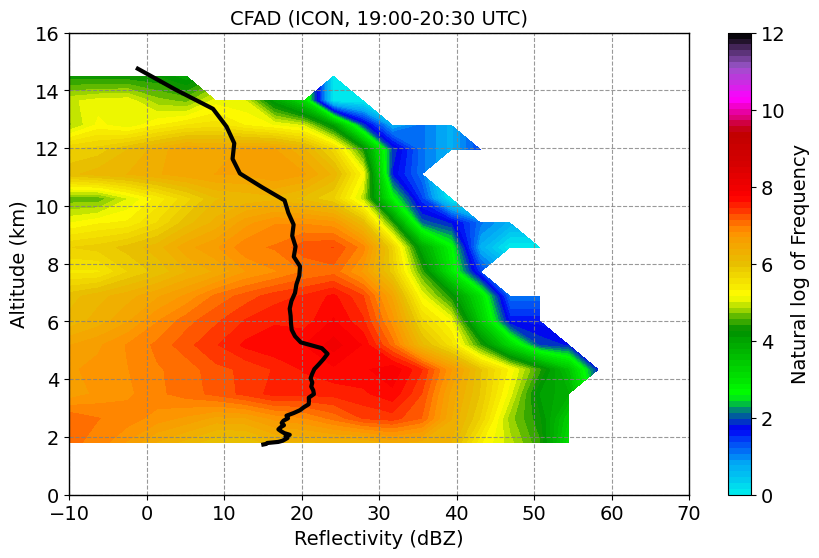

In [62]:

#filt_refl_4sip = xr.where(ds_4sip.dbz > -10., ds_4sip.dbz, np.nan)
#alt_4sip_km = 1.e-3*ds_4sip.z_mc

#avg_filt_refl = filt_refl.mean('ncells')

ds_filt = ds_4sip.sel(ncells=mask_ncells_dcmex, time=slice('2022-08-02T19:00:00.000000000','2022-08-02T20:30:00.000000000'))
filt_refl_4sip = xr.where(ds_filt.dbz > -10., ds_filt.dbz, np.nan);
alt_4sip_km = 1.e-3*ds_filt.z_mc

# 3. Flatten both arrays to 1D for histogramming
refl_flat = filt_refl_4sip.values.flatten()
alt_flat = alt_4sip_km.values.flatten()

# 4. Filter out NaNs and physically unrealistic values
mask = (~np.isnan(refl_flat)) & (~np.isnan(alt_flat)) & (refl_flat > -10) & (alt_flat >= 0)
refl_flat = refl_flat[mask]
alt_flat = alt_flat[mask]

# 5. Define bins
#dbz_bins = np.arange(-10, 81, 3)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_bins = np.arange(1.8, 20.1, 1) # Altitude bins from 0 to 15 km in 0.1 km steps

#dbz_bins = np.linspace(-10, 81, 25)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_bins = np.linspace(1.8, 22.1, 25) # Altitude bins from 0 to 15 km in 0.1 km steps

# 6. 2D Histogram (CFAD)
cfad_4sip, xedges, yedges = np.histogram2d(refl_flat, alt_flat, bins=[dbz_bins, alt_bins])

# Optional: Normalize by altitude (so each row sums to 1)
#cfad_norm = cfad / np.maximum(cfad_4sip.sum(axis=0, keepdims=True), 1)

#cfad_smooth = gaussian_filter(np.log(cfad.T + 1), sigma=1.0)


ln=3
fnt=14
lev=np.linspace(0,12,80)
# 7. Plot CFAD
plt.figure(figsize=(10, 6))
X, Y = np.meshgrid(dbz_bins, alt_bins)
#pcm = plt.pcolormesh(X, Y, np.log(cfad.T), cmap='pyart_NWSRef', shading='auto')


pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad_4sip.T), cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='HomeyerRainbow', levels=lev)

plt.plot(filt_refl_4sip.median(dim=('time','ncells')), alt_4sip_km.mean(dim=('time','ncells')), 'k-', linewidth=ln)
plt.xlabel('Reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CFAD (ICON, 19:00-20:30 UTC)', fontsize=fnt)
cbar = plt.colorbar(pcm, ticks=[0, 2, 4, 6, 8, 10, 12])#, label='Natural log of Frequency')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

plt.ylim(0, 16)
plt.xlim(-10, 70)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle='--', color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
    
plt.show()

In [48]:

file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.*_RHI.nc');

In [49]:

print(ds_rhi.longitude.min().values, ds_rhi.longitude.max().values)
print(ds_rhi.latitude.min().values, ds_rhi.latitude.max().values)

-106.89783 -106.89783
34.02243 34.02243


In [10]:

grid_dcmex = xr.open_dataset(f'{file_path}/4sip/dcmex_2mom/domain4_DOM04.nc');

clon_deg = np.degrees(grid_dcmex.clon)
clat_deg = np.degrees(grid_dcmex.clat)

print(clon_deg.min().values); print(clon_deg.max().values);
print(clat_deg.min().values); print(clat_deg.max().values);

okla_x, okla_y = np.array([-107., 34.])
#print(okla_x), print(okla_y)
dx_deg = 0.4; dy_deg = 0.4
left_bound = okla_x - dx_deg
right_bound = okla_x + dx_deg
top_bound = okla_y + dy_deg
bottom_bound = okla_y - dy_deg

print(left_bound), print(right_bound)
print(top_bound), print(bottom_bound)

window_cell = (
    (grid_dcmex.clat >= np.deg2rad(bottom_bound))
    & (grid_dcmex.clat <= np.deg2rad(top_bound))
    & (grid_dcmex.clon >= np.deg2rad(left_bound))
    & (grid_dcmex.clon <= np.deg2rad(right_bound))
).values

(window_cell_indices,) = np.where(window_cell)

# select cells matching with the area of interest (windows_cell_indices:: matching to that with the area sampled by the aircraft)
window_vertex_indices = (np.unique(grid_dcmex.vertex_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_vertex_indices ::',window_vertex_indices)

# select edges matching with the area of interest (corresponding to the windows_cell_indices)
window_edge_indices = (np.unique(grid_dcmex.edge_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_edge_indices ::',window_edge_indices)

selected_indices = xr.Dataset(
    {
        "cell": ("cell", window_cell_indices),
        "vertex": ("vertex", window_vertex_indices),
        "edge": ("edge", window_edge_indices),
    }
)

vars_to_renumber = {
    "cell": [
        "adjacent_cell_of_edge",
        "cells_of_vertex",
        "neighbor_cell_index",
    ],
    "vertex": ["vertex_of_cell", "edge_vertices", "vertices_of_vertex"],
    "edge": ["edge_of_cell", "edges_of_vertex"],
}

def reindex_grid(grid, indices, vars_to_renumber):
    new_grid = grid.load().isel(
        cell=indices.cell, vertex=indices.vertex, edge=indices.edge
    )
    for dim, idx in indices.coords.items():
        renumbering = np.full(grid.dims[dim], -2, dtype="int")
        renumbering[idx] = np.arange(len(idx))
        for name in vars_to_renumber[dim]:
            new_grid[name].data = renumbering[new_grid[name].data - 1] + 1
    return new_grid

new_grid_dcmex = reindex_grid(grid_dcmex, selected_indices, vars_to_renumber)

mask=np.isin(ds_4sip['ncells'], selected_indices.cell)
mask_cell = mask
mask_ncells_dcmex = mask


-109.03369797063944
-104.96560387399306
32.96608133463784
37.035429759321914
-107.4
-106.6
34.4
33.6
window_vertex_indices :: [ 3601  3603  3691 ... 31347 31348 31349]
window_edge_indices :: [11231 11232 11233 ... 91282 91283 91284]


In [129]:
ds_rhi.time

<xarray.DataArray 'time' (time: 2502)> Size: 20kB
array(['2022-08-02T19:13:19.418999910', '2022-08-02T19:13:19.562000036',
       '2022-08-02T19:13:19.704999923', ..., '2022-08-02T20:09:13.460999965',
       '2022-08-02T20:09:13.604000091', '2022-08-02T20:09:13.747000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 20kB 2022-08-02T19:13:19.418999910 ... 202...
Attributes:
    standard_name:  time
    long_name:      time in seconds since volume start
    comment:        times are relative to the volume start_time

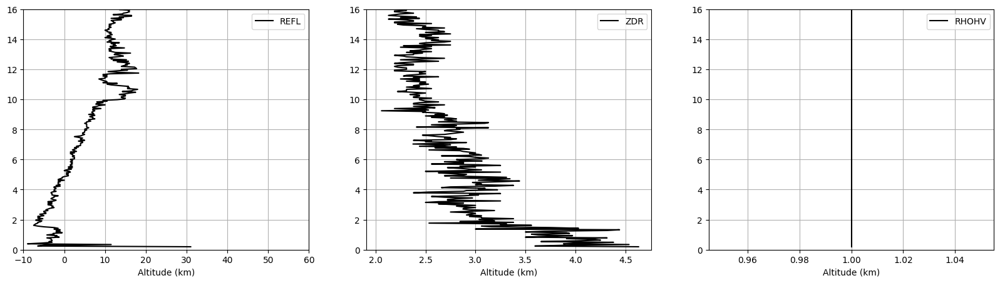

In [16]:
file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(
    f"{file_path}/cfrad.*_RHI.nc",
    engine="h5netcdf",
    combine="by_coords",
    parallel=False
)

# 1. Extract reflectivity and compute height grid
refl = ds_rhi['DBZ'].values                  # shape: (elevation, range)
theta_elev = ds_rhi['elevation'].values      # (elevation,)
range_gate = ds_rhi['range'].values * 1e-3   # (range,) in km

# 2. Build 2D grids for range and elevation
r_grid, theta_grid = np.meshgrid(range_gate, theta_elev)
alt_km = r_grid * np.sin(np.deg2rad(theta_grid))  # height (km)

#filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV > 0.97)
filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV == 1.)

filt_cond.load()
filt_refl = xr.where(filt_cond, ds_rhi.DBZ, np.nan)
filt_zdr  = xr.where(filt_cond, ds_rhi.ZDR, np.nan)
filt_rhohv  = xr.where(filt_cond, ds_rhi.RHOHV, np.nan)

filt_refl.load()
filt_rhohv.load()
filt_zdr.load()
#alt_km.load()

med_filt_refl_obs = filt_refl.median('time')
med_filt_zdr_obs = filt_zdr.median('time')
med_filt_rhohv_obs = filt_rhohv.median('time')
mean_alt_km_obs   = alt_km.mean(axis=0)

#med_filt_refl_obs[mean_alt_km_obs < 1.8] = np.nan

plt.style.use('default')

plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.plot(med_filt_refl_obs, mean_alt_km_obs, 'k-', label='REFL')
plt.xlim(-10,60)
plt.ylim(0,16)
plt.xlabel('dBZ')
plt.xlabel('Altitude (km)')
plt.grid()
plt.legend()


plt.subplot(1,3,2)
plt.plot(med_filt_zdr_obs, mean_alt_km_obs, 'k-', label='ZDR')
#plt.xlim(-10,60)
plt.ylim(0,16)
plt.xlabel('ZDR')
plt.xlabel('Altitude (km)')
plt.grid()
plt.legend()


plt.subplot(1,3,3)
plt.plot(med_filt_rhohv_obs, mean_alt_km_obs, 'k-', label='RHOHV')
#plt.xlim(-10,60)
plt.ylim(0,16)
plt.xlabel('RHOHV')
plt.xlabel('Altitude (km)')
plt.grid()
plt.legend()
plt.show()

In [206]:
ds_rhi

<xarray.Dataset> Size: 92MB
Dimensions:                           (time: 2502, sweep: 1, r_calib: 1,
                                       range: 1001, frequency: 1)
Coordinates:
  * frequency                         (frequency) float32 4B 5.593e+09
  * time                              (time) datetime64[ns] 20kB 2022-08-02T1...
  * range                             (range) float32 4kB 0.0 150.0 ... 1.5e+05
Dimensions without coordinates: sweep, r_calib
Data variables: (12/135)
    volume_number                     (time) float64 20kB 4.0 4.0 ... 17.0 17.0
    platform_type                     (time) |S32 80kB b'fixed' ... b'fixed'
    primary_axis                      (time) |S32 80kB b'axis_z' ... b'axis_z'
    status_xml                        (time) |S1 3kB b'' b'' b'' ... b'' b'' b''
    instrument_type                   (time) |S32 80kB b'radar' ... b'radar'
    radar_antenna_gain_h              (time) float32 10kB nan nan ... nan nan
    ...                                ...
    ZDR                               (time, range) float32 10MB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    KDP                               (time, range) float32 10MB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    PHIDP                             (time, range) float32 10MB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    SQI                               (time, range) float32 10MB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    RHOHV                             (time, range) float32 10MB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    DBZV                              (time, range) float32 10MB dask.array<chunksize=(40, 1001), meta=np.ndarray>
Attributes: (12/25)
    Conventions:          CF-1.7
    Sub_conventions:      CF-Radial instrument_parameters radar_parameters ra...
    version:              CF-Radial-1.4
    title:                RHI_DCM
    institution:          
    references:           Conversi
    ...                   ...
    site_name:            SR1
    scan_name:            
    scan_id:              0
    platform_is_mobile:   false
    n_gates_vary:         false
    ray_times_increase:   true

In [32]:
ds_rhi = xr.open_mfdataset(
    f"{file_path}/cfrad.*_RHI.nc",
    engine="h5netcdf",
    combine="by_coords",
    parallel=False
)


refl = ds_rhi['DBZ'].values                  # shape: (elevation, range)
theta_elev = ds_rhi['elevation'].values      # (elevation,)
range_gate = ds_rhi['range'].values * 1e-3   # (range,) in km

# 2. Build 2D grids for range and elevation
r_grid, theta_grid = np.meshgrid(range_gate, theta_elev)
alt_km = r_grid * np.sin(np.deg2rad(theta_grid))  # height (km)

#filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV > 0.97)
filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV == 1)
filt_refl = xr.where(filt_cond, ds_rhi.DBZ, np.nan)

filt_refl = xr.where(filt_cond, ds_rhi.DBZ, np.nan)
filt_refl.load()    # now safe
refl_flat = filt_refl.values.flatten()

#refl_flat = filt_refl.values.flatten()
#alt_flat = alt_km.flatten()


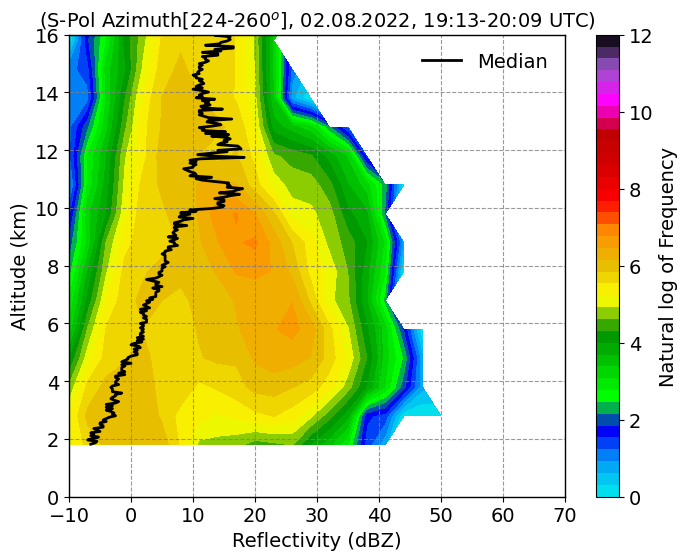

In [59]:

##################################################
################### Observation ##################
##################################################

file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(
    f"{file_path}/cfrad.*_RHI.nc",
    engine="h5netcdf",
    combine="by_coords",
    parallel=False
)

# 1. Extract reflectivity and compute height grid
refl = ds_rhi['DBZ'].values                  # shape: (elevation, range)
theta_elev = ds_rhi['elevation'].values      # (elevation,)
range_gate = ds_rhi['range'].values * 1e-3   # (range,) in km

# 2. Build 2D grids for range and elevation
r_grid, theta_grid = np.meshgrid(range_gate, theta_elev)
alt_km = r_grid * np.sin(np.deg2rad(theta_grid))  # height (km)

#filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV > 0.97)
filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV == 1)
filt_refl = xr.where(filt_cond, ds_rhi.DBZ, np.nan)

# 3. Flatten both arrays to 1D for histogramming
filt_refl = xr.where(filt_cond, ds_rhi.DBZ, np.nan)
filt_refl.load()    # now safe
refl_flat = filt_refl.values.flatten()
#filt_alt = alt_km.load()
alt_flat = alt_km.flatten()

# 4. Filter out NaNs and physically unrealistic values
mask = (~np.isnan(refl_flat)) & (~np.isnan(alt_flat)) & (refl_flat > -10) & (alt_flat >= 0)
refl_flat = refl_flat[mask]
alt_flat = alt_flat[mask]

# 5. Define bins
dbz_bins = np.arange(-10, 81, 3)   # dBZ bins from -10 to 80 in 1 dBZ steps
alt_bins = np.arange(1.8, 20.1, 1.) # Altitude bins from 0 to 15 km in 0.1 km steps

#dbz_bins = np.linspace(-10, 81, 25)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_bins = np.linspace(0, 20.1, 25) # Altitude bins from 0 to 15 km in 0.1 km steps

# 6. 2D Histogram (CFAD)
cfad, xedges, yedges = np.histogram2d(refl_flat, alt_flat, bins=[dbz_bins, alt_bins])

# Normalize by altitude (so each row sums to 1)
cfad_norm = cfad / np.maximum(cfad.sum(axis=0, keepdims=True), 1)

#cfad_smooth = gaussian_filter(np.log(cfad.T + 1), sigma=1.0)

med_filt_refl_obs = filt_refl.median('time')
mean_alt_km_obs   = alt_km.mean(axis=0)

med_filt_refl_obs[mean_alt_km_obs < 1.8] = np.nan

######################################################
################### End Observation ##################
######################################################


######### Observation ##########
#med_refl_obs = filt_refl.median('time')
#mean_alt_km_obs = alt_km.mean(axis=0)

#med_refl_obs[mean_alt_km_obs < 2.] = np.nan

mask_obs = alt_bins[:-1] < 1.8  # Create a boolean mask based on alt_bins

# Set cfad_4sip values to NaN for alt_bins < 1.1
cfad[:, mask_obs] = np.nan
################################

######### ICON ##########
#med_refl_4sip = filt_refl_4sip.median(dim=('time','ncells'))
#mean_alt_km_4sip = alt_4sip_km.mean(dim=('time','ncells'))

#med_refl_4sip[mean_alt_km_4sip < 2.] = np.nan

#med_refl_4sip = xr.where(mean_alt_km_4sip > 0.5, med_refl_4sip, np.nan)

#cfad_4sip_masked = cfad_4sip.copy()

# Set rows to NaN where alt_4sip_bins < 2
#cfad_4sip_masked[:,alt_4sip_bins[:-1] < 1.5] = np.nan
################################

ln=2
fnt=14
lev=np.linspace(0,12,40)
#lev=np.linspace(0,0.4,40)
# 7. Plot CFAD
plt.figure(figsize=(8, 6))
plt.style.use('default')

#X, Y = np.meshgrid(dbz_bins, alt_bins)
#pcm = plt.pcolormesh(X, Y, np.log(cfad.T), cmap='pyart_NWSRef', shading='auto')


pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], cfad_norm.T, cmap='pyart_NWSRef', levels=lev)  # altitude is adjusted to match the actual  
                                                                                                      # station (34.022°N, 106.89°W) altitude (~1.1 km) 
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='HomeyerRainbow', levels=lev)

plt.plot(med_filt_refl_obs, mean_alt_km_obs, 'k-', linewidth=ln, label='Median')
#plt.plot(ds_rhi.DBZ.where(ds_rhi.DBZ > 15, np.nan).median('time'), 1.e-3*ds_rhi.range, 'k-', linewidth=ln, label='Median')

plt.xlabel('Reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('(S-Pol Azimuth[224-260$^{o}$], 02.08.2022, 19:13-20:09 UTC)', fontsize=fnt)
cbar = plt.colorbar(pcm, ticks=[0, 2, 4, 6, 8, 10, 12])#, label='Natural log of Frequency')
#cbar = plt.colorbar(pcm, ticks=[0, 0.1, 0.2, 0.3, 0.4])
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

plt.ylim(0, 16)
plt.xlim(-10, 70)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle='--', color='grey', alpha=0.8)
plt.legend(frameon=False, loc='best', fontsize=fnt)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

In [7]:


##################################################
################### Observation ##################
##################################################

file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(
    f"{file_path}/cfrad.*_RHI.nc",
    engine="h5netcdf",
    combine="by_coords",
    parallel=False
)

# 1. Extract reflectivity and compute height grid
refl = ds_rhi['DBZ'].values                  # shape: (elevation, range)
theta_elev = ds_rhi['elevation'].values      # (elevation,)
range_gate = ds_rhi['range'].values * 1e-3   # (range,) in km

# 2. Build 2D grids for range and elevation
r_grid, theta_grid = np.meshgrid(range_gate, theta_elev)
alt_km_obs = r_grid * np.sin(np.deg2rad(theta_grid))  # height (km)

#filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV > 0.97)
filt_cond_obs = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV == 1)
filt_refl_obs = xr.where(filt_cond_obs, ds_rhi.DBZ, np.nan)

# 3. Flatten both arrays to 1D for histogramming
filt_refl_obs = xr.where(filt_cond_obs, ds_rhi.DBZ, np.nan)
filt_refl_obs.load()    # now safe
refl_flat_obs = filt_refl_obs.values.flatten()
#filt_alt = alt_km.load()
alt_flat_obs = alt_km_obs.flatten()

# 4. Filter out NaNs and physically unrealistic values
mask_obs = (~np.isnan(refl_flat_obs)) & (~np.isnan(alt_flat_obs)) & (refl_flat_obs > -10) & (alt_flat_obs >= 0)
refl_flat_obs = refl_flat_obs[mask_obs]
alt_flat_obs = alt_flat_obs[mask_obs]

# 5. Define bins
dbz_bins = np.arange(-10, 81, 3)   # dBZ bins from -10 to 80 in 1 dBZ steps
alt_bins = np.arange(1.8, 20.1, 1.) # Altitude bins from 0 to 15 km in 0.1 km steps

#dbz_bins = np.linspace(-10, 81, 25)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_bins = np.linspace(0, 20.1, 25) # Altitude bins from 0 to 15 km in 0.1 km steps

# 6. 2D Histogram (CFAD)
cfad_obs, xedges, yedges = np.histogram2d(refl_flat_obs, alt_flat_obs, bins=[dbz_bins, alt_bins])

# Normalize by altitude (so each row sums to 1)
cfad_obs_norm = cfad_obs / np.maximum(cfad_obs.sum(axis=0, keepdims=True), 1)

#cfad_smooth = gaussian_filter(np.log(cfad.T + 1), sigma=1.0)

med_filt_refl_obs = filt_refl_obs.median('time')
mean_alt_km_obs   = alt_km_obs.mean(axis=0)

med_filt_refl_obs[mean_alt_km_obs < 1.8] = np.nan

############################################
############ End Observation ###############
############################################


###########################################
################### ICON ##################
###########################################


#file_path='/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/sull_ds'
#ds_4sip = xr.open_mfdataset(f'{file_path}/4sip/dcmex_2mom/NWP_*.nc');

ds_4sip = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/sull_ds/4sip/dcmex_2mom/NWP_*.nc');

ds_4sip_filt = ds_4sip.sel(ncells=mask_ncells_dcmex, time=slice('2022-08-02T19:00:00.000000000','2022-08-02T20:00:00.000000000'))
filt_refl_4sip = xr.where(ds_4sip_filt.dbz > -10., ds_4sip_filt.dbz, np.nan);
alt_4sip_km = 1.e-3*ds_4sip_filt.z_mc

# 3. Flatten both arrays to 1D for histogramming
filt_refl_4sip.load()
refl_4sip_flat = filt_refl_4sip.values.flatten()
alt_4sip_flat = alt_4sip_km.values.flatten()

# 4. Filter out NaNs and physically unrealistic values
mask_4sip = (~np.isnan(refl_4sip_flat)) & (~np.isnan(alt_4sip_flat)) & (refl_4sip_flat > -10) & (alt_4sip_flat >= 0)
refl_4sip_flat = refl_4sip_flat[mask_4sip]
alt_4sip_flat = alt_4sip_flat[mask_4sip]

# 5. Define bins
dbz_4sip_bins = np.arange(-10, 81, 3)   # dBZ bins from -10 to 80 in 1 dBZ steps
alt_4sip_bins = np.arange(1.8, 26.1, 1) # Altitude bins from 0 to 15 km in 0.1 km steps

#dbz_4sip_bins = np.linspace(-10, 81, 25)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_4sip_bins = np.linspace(0, 20.1, 25) # Altitude bins from 0 to 15 km in 0.1 km steps

#dbz_int_ccn_4sip_bins = np.linspace(-10, 81, 25)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_int_ccn_4sip_bins = np.linspace(0., 16.1, 25) # Altitude bins from 0 to 15 km in 0.1 km steps

# 6. 2D Histogram (CFAD)
cfad_4sip, xedges_4sip, yedges_4sip = np.histogram2d(refl_4sip_flat, alt_4sip_flat, bins=[dbz_4sip_bins, alt_4sip_bins])


cfad_4sip_norm = cfad_4sip / np.maximum(cfad_4sip.sum(axis=0, keepdims=True), 1)
###############################################
################### End ICON ##################
###############################################


In [67]:
np.nanmax(cfad_obs_norm)#.nanmax()

np.float64(0.20070838252656434)

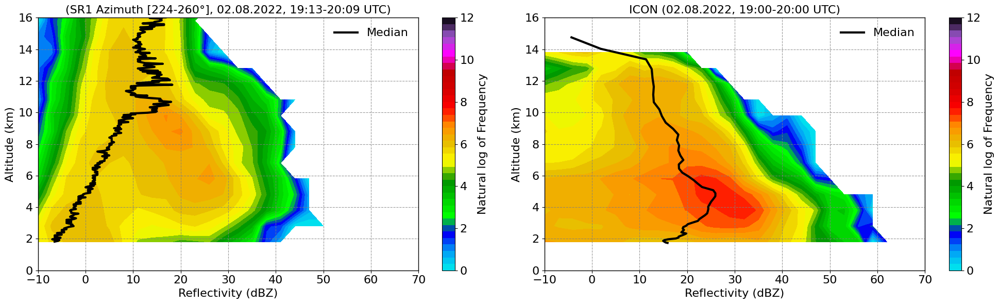

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

######### Observation ##########
#med_refl_obs = filt_refl.median('time')
#mean_alt_km_obs = alt_km.mean(axis=0)

#med_refl_obs[mean_alt_km_obs < 2.] = np.nan

mask_obs = alt_bins[:-1] < 1.8  # Create a boolean mask based on alt_bins

# Set cfad_4sip values to NaN for alt_bins < 1.1
cfad_obs[:, mask_obs] = np.nan
################################

######### ICON ##########
med_refl_4sip = filt_refl_4sip.median(dim=('time','ncells'))
mean_alt_km_4sip = alt_4sip_km.mean(dim=('time','ncells'))

#med_refl_4sip[mean_alt_km_4sip < 2.] = np.nan

#med_refl_4sip = xr.where(mean_alt_km_4sip > 0.5, med_refl_4sip, np.nan)

cfad_4sip_masked = cfad_4sip.copy()

# Set rows to NaN where alt_4sip_bins < 2
#cfad_4sip_masked[:,alt_4sip_bins[:-1] < 1.5] = np.nan
################################

ln=3
fnt=16
lev=np.linspace(0,12,40)
#lev=np.linspace(0,0.4,40)
# 7. Plot CFAD
plt.figure(figsize=(20, 6))
plt.style.use('default')

plt.subplot(1,2,1)
#X, Y = np.meshgrid(dbz_bins, alt_bins)
#pcm = plt.pcolormesh(X, Y, np.log(cfad.T), cmap='pyart_NWSRef', shading='auto')


pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], cfad_norm.T, cmap='pyart_NWSRef', levels=lev)  # altitude is adjusted to match the actual  
                                                                                                      # station (34.022°N, 106.89°W) altitude (~1.1 km) 
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='HomeyerRainbow', levels=lev)

plt.plot(med_filt_refl_obs, mean_alt_km_obs, 'k-', linewidth=ln, label='Median')
#plt.plot(ds_rhi.DBZ.where(ds_rhi.DBZ > 15, np.nan).median('time'), 1.e-3*ds_rhi.range, 'k-', linewidth=ln, label='Median')

plt.xlabel('Reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('(SR1 Azimuth [224-260°], 02.08.2022, 19:13-20:09 UTC)', fontsize=fnt)
cbar = plt.colorbar(pcm, ticks=[0, 2, 4, 6, 8, 10, 12])#, label='Natural log of Frequency')
#cbar = plt.colorbar(pcm, ticks=[0, 0.1, 0.2, 0.3, 0.4])
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

plt.ylim(0, 16)
plt.xlim(-10, 70)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle='--', color='grey', alpha=0.8)
plt.legend(frameon=False, loc='best', fontsize=fnt)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#X, Y = np.meshgrid(dbz_bins, alt_bins)
#pcm = plt.pcolormesh(X, Y, np.log(cfad.T), cmap='pyart_NWSRef', shading='auto')


pcm = plt.contourf(dbz_4sip_bins[:-1], alt_4sip_bins[:-1], np.log(cfad_4sip.T), cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_4sip_bins[:-1], alt_4sip_bins[:-1], cfad_4sip_norm.T, cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='HomeyerRainbow', levels=lev)

#plt.plot(filt_refl_4sip.median(dim=('time','ncells')), alt_4sip_km.mean(dim=('time','ncells')), 'k-', linewidth=ln, label='Median')

plt.plot(med_refl_4sip, mean_alt_km_4sip, 'k-', linewidth=ln, label='Median')

#plt.plot(np.median(cfad_4sip, axis=1), alt_4sip_bins[:-1], 'k-', linewidth=ln, label='Median')

plt.xlabel('Reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('ICON (02.08.2022, 19:00-20:00 UTC)', fontsize=fnt)
cbar = plt.colorbar(pcm, ticks=[0, 2, 4, 6, 8, 10, 12])#, label='Natural log of Frequency')
#cbar = plt.colorbar(pcm, ticks=[0, 0.1, 0.2, 0.3, 0.4])
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

plt.ylim(0, 16)
plt.xlim(-10, 70)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle='--', color='grey', alpha=0.8)
plt.legend(frameon=False, loc='best', fontsize=fnt)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()


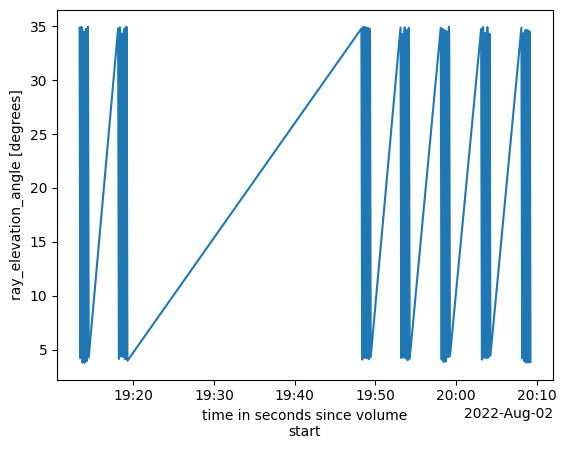

In [31]:
ds_rhi.elevation.plot()

In [ ]:
## Alternative

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(
    f"{file_path}/cfrad.*_RHI.nc",
    engine="h5netcdf",
    combine="by_coords",
    parallel=False
)



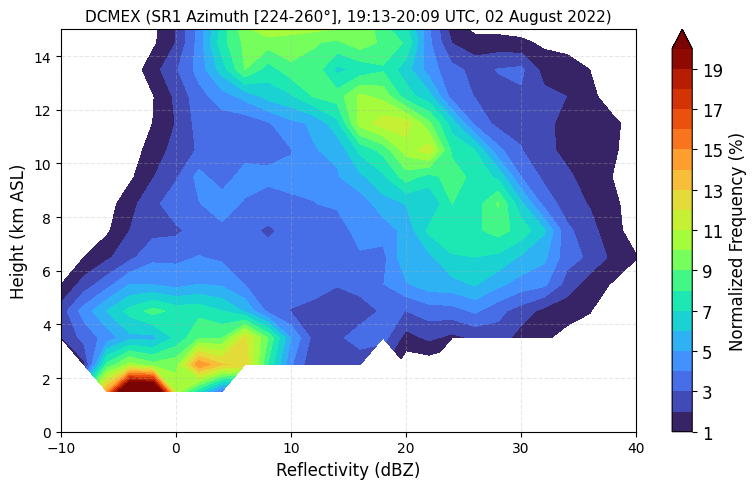

In [10]:

#filt_cond_obs = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV == 1)
filt_cond_obs = (ds_rhi.ZDR > 1.) & (ds_rhi.ZDR < 4.) & (ds_rhi.RHOHV == 1)
filt_refl_obs = xr.where(filt_cond_obs, ds_rhi.DBZ, np.nan)

# Extract reflectivity and compute height grid
refl_obs = filt_refl_obs.values #ds_rhi['DBZ'].values                  # shape: (elevation, range)
theta_elev_obs = ds_rhi['elevation'].values      # (elevation,)
range_gate_obs = ds_rhi['range'].values * 1e-3   # (range,) in km

# Get radar location for height calculation
radar_altitude_obs = ds_rhi['altitude'].values   # radar altitude in meters
if radar_altitude_obs.size == 1:
    radar_altitude_obs = float(radar_altitude_obs)
else:
    radar_altitude_obs = float(radar_altitude_obs[0])

# Create 2D meshgrids for range and elevation
range_2d_obs, elev_2d_obs = np.meshgrid(range_gate_obs, theta_elev_obs)

# Calculate height above radar level (in meters)
# height = range * sin(elevation_angle) 
height_arl_obs = range_2d_obs * np.sin(np.deg2rad(elev_2d_obs)) * 1000  # km to m

# Calculate height above sea level
height_asl_obs = height_arl_obs + radar_altitude_obs

# Convert to km for plotting
height_km_obs = height_asl_obs / 1000.0

# =====================================================
# Create CFAD (Contoured Frequency by Altitude Diagram)
# =====================================================

# Define bins
dbz_bins = np.arange(-15, 50, 2)   # 2 dBZ bins (typical for CFAD)
height_bins = np.arange(0, 20, 1)  # 1 km bins 

# Flatten arrays for histogram calculation
refl_obs_flat = refl_obs.flatten()
height_obs_flat = height_km_obs.flatten()

# Remove invalid data (NaN, masked values)
valid_mask_obs = ~np.isnan(refl_obs_flat) & ~np.isnan(height_obs_flat)
refl_obs_valid = refl_obs_flat[valid_mask_obs]
height_obs_valid = height_obs_flat[valid_mask_obs]

# Create 2D histogram
hist_obs_2d, height_obs_edges, dbz_obs_edges = np.histogram2d(
    height_obs_valid, refl_obs_valid,
    bins=[height_bins, dbz_bins]
)

# Normalize by altitude (each height level sums to 1)
# This is the key feature of CFAD diagrams
hist_obs_normalized = np.zeros_like(hist_obs_2d)
for i in range(hist_obs_2d.shape[0]):
    row_obs_sum = hist_obs_2d[i, :].sum()
    if row_obs_sum > 0:
        hist_obs_normalized[i, :] = hist_obs_2d[i, :] / row_obs_sum

# Convert to percentage
freq_percent_obs = hist_obs_normalized * 100

# Mask zeros for better visualization
freq_percent_obs_masked = np.ma.masked_where(freq_percent_obs == 0, freq_percent_obs)

median_dbz_obs = []
median_heights_obs = []
for i in range(len(height_bins)-1):
    h_min_obs = height_bins[i]
    h_max_obs = height_bins[i+1]
    mask_obs = (height_obs_valid >= h_min_obs) & (height_obs_valid < h_max_obs)
    
    if mask_obs.sum() > 0:
        median_val_obs = np.median(refl_obs_valid[mask_obs])
        median_dbz_obs.append(median_val_obs)
        median_heights_obs.append((h_min_obs + h_max_obs) / 2.)
        
# =====================================================
# Plot CFAD
# =====================================================

fnt=12
plt.style.use('default')
fig, ax = plt.subplots(figsize=(8, 5))

# Create meshgrid for plotting - use bin centers instead of edges
height_obs_centers = (height_obs_edges[:-1] + height_obs_edges[1:]) / 2
dbz_obs_centers = (dbz_obs_edges[:-1] + dbz_obs_edges[1:]) / 2
H_obs, D_obs = np.meshgrid(height_obs_centers, dbz_obs_centers)

# Option 1: Filled contours (similar to Fig 5a style)
levels = np.arange(1, freq_percent_obs_masked.max() + 1, 1)  # 1% intervals
lev = np.linspace(1, 20, 20)

contourf = ax.contourf(D_obs, H_obs, freq_percent_obs_masked.T, 
                       levels=lev, 
                       cmap='turbo', 
                       extend='max')

# Option 2: Add contour lines for clarity (optional)
#contour_lines = ax.contour(D_obs, H_obs, freq_percent_obs_masked.T, 
#                           levels=[1, 2, 5, 10, 15, 20], 
#                           colors='black', 
#                           linewidths=0.5, 
#                           alpha=0.5)
#ax.clabel(contour_lines, inline=True, fontsize=fnt, fmt='%d%%')

# Colorbar
cbar = plt.colorbar(contourf, ax=ax, label='Normalized Frequency (%)')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency (%)', size=fnt)


# Labels and title
ax.set_xlabel('Reflectivity (dBZ)', fontsize=fnt)#, fontweight='bold')
ax.set_ylabel('Height (km ASL)', fontsize=fnt)#, fontweight='bold')
ax.set_title('DCMEX (SR1 Azimuth [224-260°], 19:13-20:09 UTC, 02 August 2022)', fontsize=fnt-1)#, fontweight='bold')

# Set reasonable axis limits
ax.set_xlim([-10, 40])
ax.set_ylim([0, 15])

# Grid
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show() 


# =====================================================
# Optional: Print statistics
# =====================================================

#print("CFAD Statistics:")
#print(f"Total valid points: {len(refl_valid):,}")
#print(f"Height range: {height_valid.min():.2f} - {height_valid.max():.2f} km")
#print(f"Reflectivity range: {refl_valid.min():.2f} - {refl_valid.max():.2f} dBZ")
#print(f"Max normalized frequency: {freq_percent_masked.max():.2f}%")

# Find mode (most frequent reflectivity) at each height
#mode_dbz = []
#mode_heights = []
#for i in range(len(height_bins)-1):
#    if hist_normalized[i, :].sum() > 0:
#        max_idx = np.argmax(hist_normalized[i, :])
#        mode_dbz.append((dbz_bins[max_idx] + dbz_bins[max_idx+1]) / 2)
#        mode_heights.append((height_bins[i] + height_bins[i+1]) / 2)

# Plot mode line on the first figure (shows the most common reflectivity at each height)
#fig.axes[0].plot(mode_dbz, mode_heights, 'k-', linewidth=2, label='Mode')
#fig.axes[0].legend()
plt.show()

In [104]:
ds_4sip_filt.w_vel

<xarray.DataArray 'w_vel' (time: 7, height: 65, ncells: 2639)> Size: 5MB
dask.array<truediv, shape=(7, 65, 2639), dtype=float32, chunksize=(1, 65, 2639), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 56B 2022-08-02T18:00:00 ... 2022-08-02T21:...
    clon     (ncells) float64 21kB dask.array<chunksize=(2639,), meta=np.ndarray>
    clat     (ncells) float64 21kB dask.array<chunksize=(2639,), meta=np.ndarray>
  * height   (height) float64 520B 1.0 2.0 3.0 4.0 5.0 ... 62.0 63.0 64.0 65.0
Dimensions without coordinates: ncells

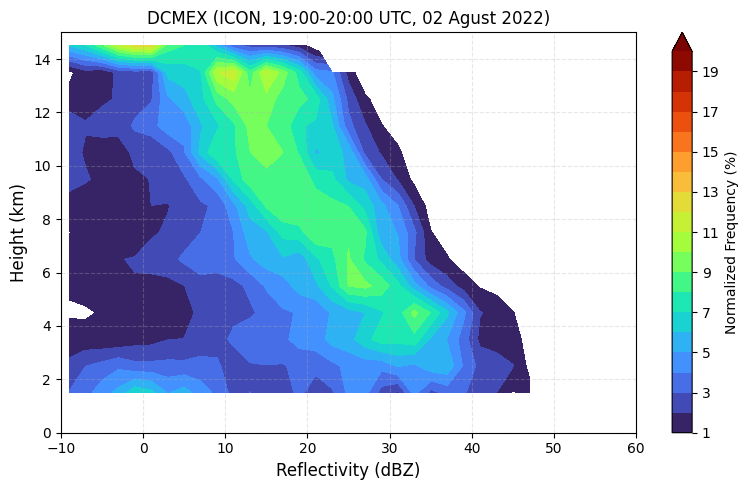

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Load your ICON data (assuming you already have it loaded)
ds_4sip = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/nested_run/icon_output/continental_ccn/latent_heat/sull_ds/4sip/dcmex_2mom/NWP_*.nc')
ds_4sip_filt = ds_4sip.sel(ncells=mask_ncells_dcmex, time=slice('2022-08-02T19:00:00.000000000','2022-08-02T20:00:00.000000000'))

ds_4sip_filt['w_vel'] = -1.*ds_4sip_filt.omega/(9.8*ds_4sip_filt.rho)
ds_4sip_filt['tq'] = ds_4sip_filt.qc+ds_4sip_filt.qr+ds_4sip_filt.qi+ds_4sip_filt.qs+ds_4sip_filt.qg+ds_4sip_filt.qh

mask_refl = (ds_4sip_filt.dbz > -10.) & (np.abs(ds_4sip_filt.w_vel) < 6.) & (ds_4sip_filt.tq > 1.e-6)
filt_refl_4sip = xr.where(mask_refl, ds_4sip_filt.dbz, np.nan)

alt_4sip_km = 1.e-3*ds_4sip_filt.z_mc

# Extract reflectivity and height data
refl_4sip = filt_refl_4sip.values  # shape: (time, height, ncells)
height_4sip = alt_4sip_km.values    # shape: (time, height, ncells) or (height, ncells)

# Flatten all dimensions to 1D arrays
refl_4sip_flat = refl_4sip.flatten()
height_4sip_flat = height_4sip.flatten()

# Remove invalid data (NaN values)
valid_4sip_mask = ~np.isnan(refl_4sip_flat) & ~np.isnan(height_4sip_flat)  
refl_4sip_valid = refl_4sip_flat[valid_4sip_mask]
height_4sip_valid = height_4sip_flat[valid_4sip_mask]

# =====================================================
# Create CFAD for ICON data
# =====================================================

# Define bins (same as radar CFAD for comparison)
dbz_bins = np.arange(-14, 50, 2)  # 2 dBZ bins
height_bins = np.arange(0, 20, 1.0)  # 400 m bins (0.4 km)

# Create 2D histogram
hist_4sip_2d, height_4sip_edges, dbz_4sip_edges = np.histogram2d(
    height_4sip_valid, refl_4sip_valid,
    bins=[height_bins, dbz_bins]
)

# Normalize by altitude (each height level sums to 1)
hist_4sip_normalized = np.zeros_like(hist_4sip_2d)
for i in range(hist_4sip_2d.shape[0]):
    row_sum_4sip = hist_4sip_2d[i, :].sum()
    if row_sum_4sip > 0:
        hist_4sip_normalized[i, :] = hist_4sip_2d[i, :] / row_sum_4sip

# Convert to percentage
freq_percent_4sip = hist_4sip_normalized * 100

# Mask zeros for better visualization
freq_percent_masked_4sip = np.ma.masked_where(freq_percent_4sip == 0, freq_percent_4sip)

# =====================================================
# Calculate median and mode
# =====================================================

# Calculate median reflectivity at each height bin
median_dbz_4sip = []
median_heights_4sip = []
for i in range(len(height_bins)-1):
    h_min_4sip = height_bins[i]
    h_max_4sip = height_bins[i+1]
    mask_4sip = (height_4sip_valid >= h_min_4sip) & (height_4sip_valid < h_max_4sip)
    
    if mask_4sip.sum() > 0:
        median_val_4sip = np.median(refl_4sip_valid[mask_4sip])
        median_dbz_4sip.append(median_val_4sip)
        median_heights_4sip.append((h_min_4sip + h_max_4sip) / 2.)

# Find mode (most frequent reflectivity) at each height
mode_dbz_4sip = []
mode_heights_4sip = []
for i in range(len(height_bins)-1):
    if hist_4sip_normalized[i, :].sum() > 0:
        max_idx_4sip = np.argmax(hist_4sip_normalized[i, :])
        mode_dbz_4sip.append((dbz_bins[max_idx_4sip] + dbz_bins[max_idx_4sip+1]) / 2)
        mode_heights_4sip.append((height_bins[i] + height_bins[i+1]) / 2)

# =====================================================
# Plot CFAD
# =====================================================
fnt=12
lev=np.linspace(1,20,20)

fig, ax = plt.subplots(figsize=(8, 5))

# Create meshgrid for plotting - use bin centers
height_4sip_centers = (height_4sip_edges[:-1] + height_4sip_edges[1:]) / 2
dbz_4sip_centers = (dbz_4sip_edges[:-1] + dbz_4sip_edges[1:]) / 2
H_4sip, D_4sip = np.meshgrid(height_4sip_centers, dbz_4sip_centers)

# Filled contours
levels = np.arange(0, freq_percent_masked_4sip.max() + 1, 1)  # 1% intervals
contourf = ax.contourf(D_4sip, H_4sip, freq_percent_masked_4sip.T, 
                       levels=lev, 
                       cmap='turbo', 
                       extend='max')

# Add contour lines for clarity
#contour_lines = ax.contour(D, H, freq_percent_masked.T, 
#                           levels=[1, 2, 5, 10, 15, 20], 
#                           colors='black', 
#                           linewidths=0.5, 
#                           alpha=0.5)
#ax.clabel(contour_lines, inline=True, fontsize=fnt, fmt='%d%%')

# Plot mode and median lines
#ax.plot(mode_dbz, mode_heights, 'k-', linewidth=2.5, label='Mode', zorder=10)
#ax.plot(median_dbz, median_heights, 'w-', linewidth=2.5, zorder=11)
#ax.plot(median_dbz, median_heights, 'r--', linewidth=2, label='Median', zorder=12)

# Colorbar
cbar = plt.colorbar(contourf, ax=ax, label='Normalized Frequency (%)')

# Labels and title
ax.set_xlabel('Reflectivity (dBZ)', fontsize=fnt)#, fontweight='bold')
ax.set_ylabel('Height (km)', fontsize=fnt)#, fontweight='bold')
ax.set_title('DCMEX (ICON, 19:00-20:00 UTC, 02 Agust 2022)', fontsize=fnt)#, fontweight='bold')

# Set reasonable axis limits
ax.set_xlim([-10, 60])
ax.set_ylim([0, 15])

# Grid and legend
ax.grid(True, alpha=0.3, linestyle='--')
#ax.legend(loc='upper right', framealpha=0.9)

plt.tight_layout()
plt.show()


# =====================================================
# Print statistics
# =====================================================

#print("CFAD Statistics (ICON 4SIP):")
#print(f"Total valid points: {len(refl_valid):,}")
#print(f"Height range: {height_valid.min():.2f} - {height_valid.max():.2f} km")
#print(f"Reflectivity range: {refl_valid.min():.2f} - {refl_valid.max():.2f} dBZ")
#print(f"Max normalized frequency: {freq_percent_masked.max():.2f}%")
#print(f"Time steps: {refl_icon.shape[0]}")
#print(f"Height levels: {refl_icon.shape[1]}")
#print(f"Number of cells: {refl_icon.shape[2]}")

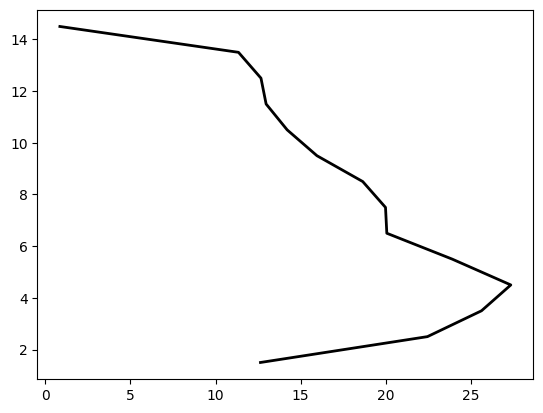

In [117]:
plt.plot(median_dbz_4sip, median_heights_4sip, 'k-', linewidth=ln, zorder=11)


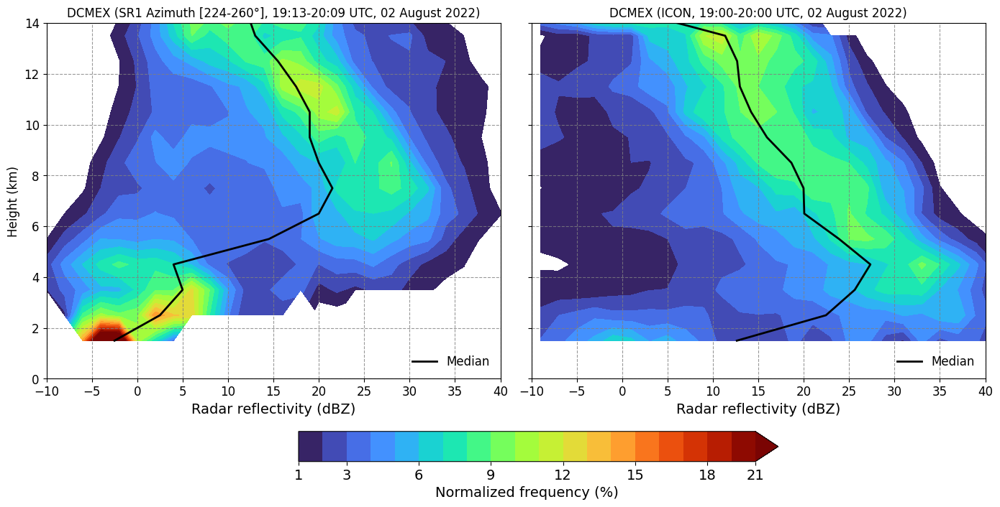

In [25]:
import numpy as np
import matplotlib.pyplot as plt

# Create data (make sure D_obs, H_obs, freq_percent_obs_masked, etc. are defined)
lev = np.linspace(1, 20, 20)

fnt = 12
ln=2;

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# First subplot (DCMEX Observations)
cnt1 = ax1.contourf(D_obs, H_obs, freq_percent_obs_masked.T, 
                        levels=lev, 
                        cmap='turbo', 
                        extend='max')

# Colorbar for first subplot
#cbar1 = plt.colorbar(contourf, ax=ax1, label='Normalized Frequency (%)')
#cbar1.ax.tick_params(labelsize=fnt)
#cbar1.set_label(label='Normalized Frequency (%)', size=fnt)

ax1.plot(median_dbz_obs, median_heights_obs, 'k-', linewidth=ln, zorder=11, label='Median')

# Labels and title for first subplot
ax1.set_xlabel('Radar reflectivity (dBZ)', fontsize=fnt+2)
ax1.set_ylabel('Height (km)', fontsize=fnt)   # ASL
ax1.set_title('DCMEX (SR1 Azimuth [224-260°], 19:13-20:09 UTC, 02 August 2022)', fontsize=fnt)

# Set reasonable axis limits for first subplot
ax1.set_xlim([-10, 40])
ax1.set_ylim([0, 14])
ax1.set_xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30, 35, 40])
ax1.set_yticks([0, 2, 4, 6, 8, 10, 12, 14])

ax1.tick_params(axis='x', labelsize=fnt)
ax1.tick_params(axis='y', labelsize=fnt)

# Grid for first subplot
ax1.grid(True, linestyle='--', color='grey', alpha=0.8)
ax1.legend(frameon=False, loc='lower right', fontsize=fnt)

# Second subplot (ICON Simulation)
cnt2 = ax2.contourf(D_4sip, H_4sip, freq_percent_masked_4sip.T, 
                        levels=lev, 
                        cmap='turbo', 
                        extend='max')


ax2.plot(median_dbz_4sip, median_heights_4sip, 'k-', linewidth=ln, zorder=11, label='Median')

# Colorbar for second subplot
#cbar2 = plt.colorbar(contourf, ax=ax2, label='Normalized Frequency (%)')

# Labels and title for second subplot
ax2.set_xlabel('Radar reflectivity (dBZ)', fontsize=fnt+2)
#ax2.set_ylabel('Height (km)', fontsize=fnt)
ax2.set_title('DCMEX (ICON, 19:00-20:00 UTC, 02 August 2022)', fontsize=fnt)

# Set reasonable axis limits for second subplot
ax2.set_xlim([-10, 40])
ax2.set_ylim([0, 14])
ax2.set_xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30, 35, 40])
ax2.set_yticks([0, 2, 4, 6, 8, 10, 12, 14])

ax2.set_yticklabels([])

ax2.tick_params(axis='x', labelsize=fnt)

# Grid for second subplot
ax2.grid(True, linestyle='--', color='grey', alpha=0.8)
ax2.legend(frameon=False, loc='lower right', fontsize=fnt)

fig = plt.gcf()  # Get the current figure
#cbar_ax1 = fig.add_axes([0.25, 0.25, 0.5, 0.04])  # [left, bottom, width, height]
cbar_ax1 = fig.add_axes([0.3, -0.08, 0.5, 0.07])
cbar = fig.colorbar(cnt2, cax=cbar_ax1, ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20], orientation='horizontal')
cbar = fig.colorbar(cnt2, cax=cbar_ax1, ticks=[1, 3, 6, 9, 12, 15, 18, 21], orientation='horizontal')
cbar.set_label('Normalized frequency (%)', fontsize=fnt+2)
cbar.ax.tick_params(labelsize=fnt+2)

# Adjust layout for better spacing between subplots
plt.tight_layout()

# Show plot
plt.show()


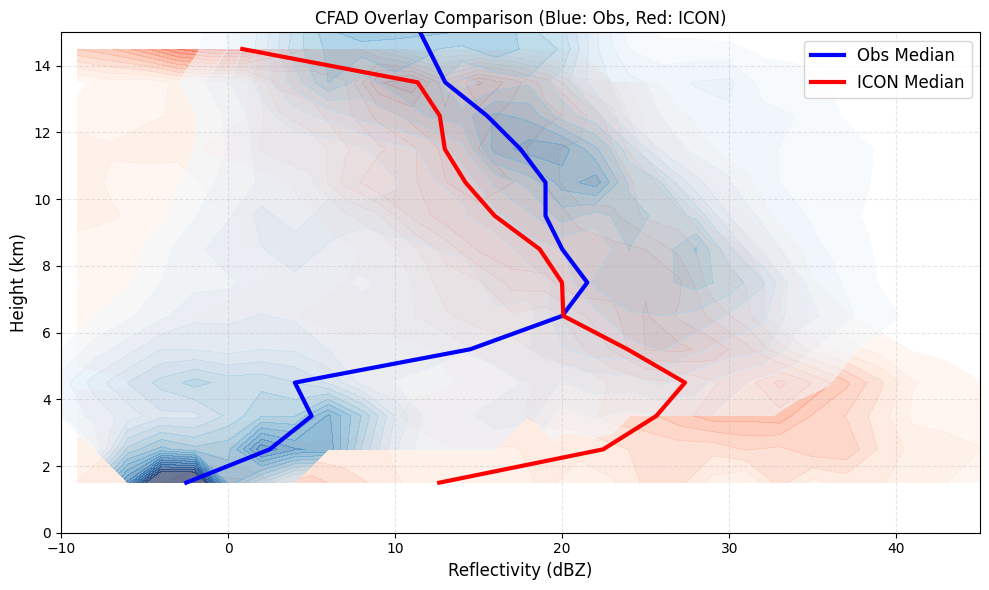

In [18]:
dbz_lim = [-10, 45]
height_lim = [0, 15]

fig, ax = plt.subplots(figsize=(10, 6))

# Plot ICON with transparency
cf_icon = ax.contourf(D_4sip, H_4sip, freq_percent_masked_4sip.T, 
                      levels=lev, cmap='Reds', alpha=0.6, extend='max')
# Plot observations with transparency
cf_obs = ax.contourf(D_obs, H_obs, freq_percent_obs_masked.T, 
                     levels=lev, cmap='Blues', alpha=0.6, extend='max')

# Add median lines
ax.plot(median_dbz_obs, median_heights_obs, 'b-', linewidth=3, label='Obs Median')
ax.plot(median_dbz_4sip, median_heights_4sip, 'r-', linewidth=3, label='ICON Median')

ax.set_xlabel('Reflectivity (dBZ)', fontsize=fnt)
ax.set_ylabel('Height (km)', fontsize=fnt)
ax.set_title('CFAD Overlay Comparison (Blue: Obs, Red: ICON)', fontsize=fnt)
ax.set_xlim(dbz_lim)
ax.set_ylim(height_lim)
ax.grid(True, alpha=0.3, linestyle='--')
ax.legend(loc='upper right', fontsize=fnt)

plt.tight_layout()
plt.savefig('cfad_overlay_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

## Normalized CFAD

In [10]:

file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.*_RHI.nc');


In [39]:
print(np.size(np.arange(-10, 81, 3)))

31


In [40]:

nbin = 26;

#################### Observation ##################

# 1. Extract reflectivity and compute height grid
refl = ds_rhi['DBZ'].values                  # shape: (elevation, range)
theta_elev = ds_rhi['elevation'].values      # (elevation,)
range_gate = ds_rhi['range'].values * 1e-3   # (range,) in km

# 2. Build 2D grids for range and elevation
r_grid, theta_grid = np.meshgrid(range_gate, theta_elev)
alt_sr1_km = r_grid * np.sin(np.deg2rad(theta_grid))  # height (km)

#filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV > 0.97)
filt_cond = (ds_rhi.ZDR > 0.9) & (ds_rhi.ZDR < 5.) & (ds_rhi.RHOHV == 1)
filt_sr1_refl = xr.where(filt_cond, ds_rhi.DBZ, np.nan)


# Flatten both arrays to 1D for histogram
filt_sr1_refl.load()
refl_sr1_flat = filt_sr1_refl.values.flatten()
alt_sr1_flat = alt_sr1_km.flatten()

# Filter out NaNs and physically unrealistic values
mask_refl = (~np.isnan(refl_sr1_flat)) & (~np.isnan(alt_sr1_flat)) & (refl_sr1_flat > -10) & (alt_sr1_flat >= 0)
refl_sr1_flat = refl_sr1_flat[mask_refl]
alt_sr1_flat = alt_sr1_flat[mask_refl]

# Define bins
dbz_sr1_bins = np.linspace(np.nanmin(refl_sr1_flat), np.nanmax(refl_sr1_flat), nbin)   # dBZ bins from -10 to 80 in 1 dBZ steps
alt_sr1_bins = np.linspace(np.nanmin(alt_sr1_flat), np.nanmax(alt_sr1_flat), nbin)     # Altitude bins from 0 to 15 km in 0.1 km steps

#dbz_bins = np.linspace(-10, 81, 25)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_bins = np.linspace(0, 20.1, 25) # Altitude bins from 0 to 15 km in 0.1 km steps

# 2D Histogram (CFAD)
cfad_refl_sr1, xedges, yedges = np.histogram2d(refl_sr1_flat, alt_sr1_flat, bins=[dbz_sr1_bins, alt_sr1_bins])

cfad_refl_sr1_norm = cfad_refl_sr1 / np.sum(cfad_refl_sr1, axis=0, keepdims=True) # normalized by height

#cfad_smooth = gaussian_filter(np.log(cfad.T + 1), sigma=1.0)

med_refl_sr1 = filt_sr1_refl.median('time')
median_refl_sr1 = filt_sr1_refl.median('time')
mean_refl_sr1 = filt_sr1_refl.mean('time')
mean_alt_km_sr1   = alt_sr1_km.mean(axis=0)

med_refl_sr1[mean_alt_km_sr1 < 1.4] = np.nan
median_refl_sr1[mean_alt_km_sr1 < 1.4] = np.nan

################## End Observation ####################



################## ICON #################

ds_filt = ds_4sip.sel(ncells=mask_ncells_dcmex, time=slice('2022-08-02T19:00:00.000000000','2022-08-02T20:00:00.000000000'))
filt_refl_4sip = xr.where(ds_filt.dbz > -10., ds_filt.dbz, np.nan);
alt_4sip_km = 1.e-3*ds_filt.z_mc

# 3. Flatten both arrays to 1D for histogram
refl_4sip_flat = filt_refl_4sip.values.flatten()
alt_4sip_flat = alt_4sip_km.values.flatten()

# 4. Filter out NaNs and physically unrealistic values
mask_4sip = (~np.isnan(refl_4sip_flat)) & (~np.isnan(alt_4sip_flat)) & (refl_4sip_flat > -10) & (alt_4sip_flat >= 0)
refl_4sip_flat = refl_4sip_flat[mask_4sip]
alt_4sip_flat = alt_4sip_flat[mask_4sip]


dbz_4sip_bins = np.linspace(np.nanmin(refl_4sip_flat), np.nanmax(refl_4sip_flat), nbin)   # dBZ bins from -10 to 80 in 1 dBZ steps
alt_4sip_bins = np.linspace(np.nanmin(alt_4sip_flat), np.nanmax(alt_4sip_flat), nbin) # Altitude bins from 0 to 15 km in 0.1 km steps

# 2D Histogram (CFAD)
cfad_4sip, xedges_4sip, yedges_4sip = np.histogram2d(refl_4sip_flat, alt_4sip_flat, bins=[dbz_4sip_bins, alt_4sip_bins])

#cfad_4sip_norm = cfad_4sip / np.sum(cfad_4sip, axis=0, keepdims=True) # normalized by height
col_sum = np.sum(cfad_4sip, axis=0, keepdims=True)
cfad_4sip_norm = np.where(col_sum != 0, cfad_4sip / col_sum, np.nan)

med_refl_4sip = filt_refl_4sip.median(dim=('time','ncells'))
median_refl_4sip = filt_refl_4sip.median(dim=('time','ncells'))
mean_alt_4sip = alt_4sip_km.mean(dim=('time','ncells'))

med_refl_4sip = xr.where(mean_alt_4sip < 13.35, med_refl_4sip, np.nan)

median_refl_4sip = median_refl_4sip.values
mean_alt_4sip = mean_alt_4sip.values

################## End ICON #################


/home/b/b382718/own_env/lib/python3.9/site-packages/numpy/lib/_nanfunctions_impl.py:1233: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,


In [64]:
print(np.nanmin(alt_4sip_flat), np.nanmax(alt_4sip_flat))
print(alt_sr1_bins)
print(alt_4sip_bins)
#print(cfad_4sip_norm)

1.4157505 14.759698
[ 0.18408562  1.8141156   3.4441457   5.074176    6.704206    8.334236
  9.964266   11.594296   13.224326   14.854356   16.484386   18.114416
 19.744446   21.374475   23.004507   24.634537   26.264566   27.894596
 29.524626   31.154657   32.784687   34.414715   36.044746   37.674778
 39.304806   40.934837  ]
[ 1.8  2.8  3.8  4.8  5.8  6.8  7.8  8.8  9.8 10.8 11.8 12.8 13.8 14.8
 15.8 16.8 17.8 18.8 19.8]


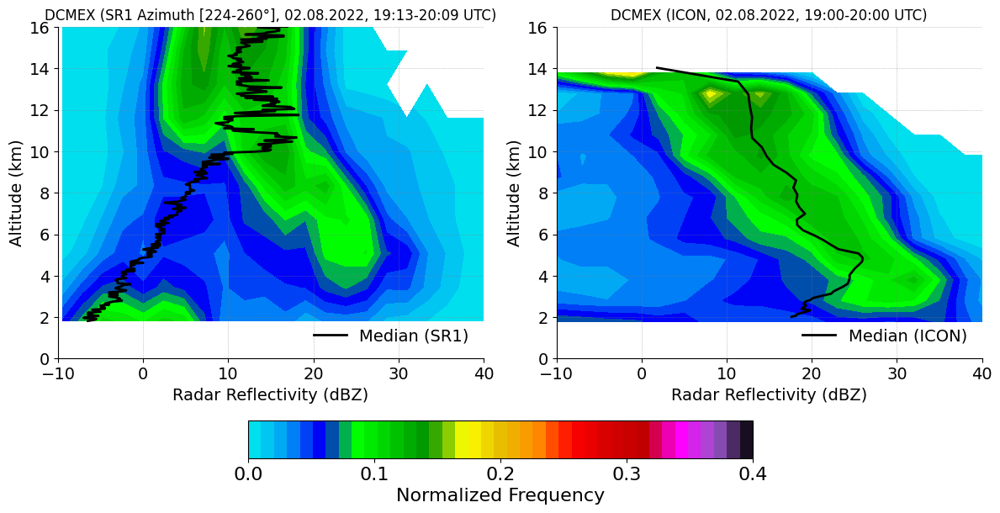

In [65]:


mean_refl_sr1 = mean_refl_sr1[:median_refl_sr1.shape[0]]
median_refl_sr11 = median_refl_sr1
median_refl_sr11[mean_alt_km_sr1 < 1.8] = np.nan

height_bin_centers = 0.5 * (alt_sr1_bins[:-1] + alt_sr1_bins[1:])
cfad_refl_sr1_norm[:, alt_sr1_bins[:-1] < 1.2] = np.nan

cfad_refl_sr1_norm[cfad_refl_sr1_norm <= 0.] = np.nan

cfad_4sip_norm[cfad_4sip_norm <= 0.] = np.nan
cfad_4sip_norm[:, alt_4sip_bins[:-1] < 1.45] = np.nan
cfad_4sip_norm[:, alt_4sip_bins[:-1] > 14.25] = np.nan
median_refl_4sip[mean_alt_4sip < 2.] = np.nan
median_refl_4sip[mean_alt_4sip > 14.2] = np.nan


fnt = 14
lev1 = np.linspace(0., 0.4, 40)
lev2 = np.linspace(0., 0.4, 40)

plt.figure(figsize=(12, 5))
plt.style.use('default')

plt.subplot(1,2,1)
cnt = plt.contourf(dbz_sr1_bins[:-1], alt_sr1_bins[:-1], (cfad_refl_sr1_norm.T), levels=lev1, cmap='pyart_NWSRef')
plt.plot(median_refl_sr11, mean_alt_km_sr1, 'k-', linewidth=2, label='Median (SR1)')

plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='lower right')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title('DCMEX (SR1 Azimuth [224-260°], 02.08.2022, 19:13-20:09 UTC)', fontsize=fnt-2)

plt.xlim(-10, 40)
plt.ylim(0, 16)
#cbar = plt.colorbar(contour, ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], label='Normalized Frequency', orientation='vertical')
#cbar.ax.tick_params(labelsize=fnt)
#cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)
#contour = plt.contourf(refl_4sip_bins[:-1], avg_alt_4sip, np.log(cfad_refl_4sip.T), levels=lev, cmap='turbo')
cnt = plt.contourf(dbz_4sip_bins[:-1], alt_4sip_bins[:-1], (cfad_4sip_norm.T), levels=lev2, cmap='pyart_NWSRef')#pyart_NWSRef')
plt.plot(median_refl_4sip, mean_alt_4sip, color='k', linewidth=2, label='Median (ICON)')
#plt.plot(median_refl_ec1, mean_alt_ec_filt1, 'k--', linewidth=2, label='Median (EarthCARE-CPR)')


plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='lower right')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title('DCMEX (ICON, 02.08.2022, 19:00-20:00 UTC)', fontsize=fnt-2)

plt.xlim(-10, 40)
plt.ylim(0, 16)
##cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
#cbar = plt.colorbar(contour, ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], label='Normalized Frequency', orientation='vertical')
#cbar.ax.tick_params(labelsize=fnt)
#cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)


fig = plt.gcf()
cbar_ax1 = fig.add_axes([0.25, -0.1, 0.5, 0.09])  # [left, bottom, width, height]
cbar1 = fig.colorbar(cnt, cax=cbar_ax1, orientation='horizontal', ticks=[0, 0.1, 0.2, 0.3, 0.4])
cbar1.set_label('Normalized Frequency', fontsize=fnt+2)
cbar1.ax.tick_params(labelsize=fnt+2)

plt.tight_layout()
plt.show()

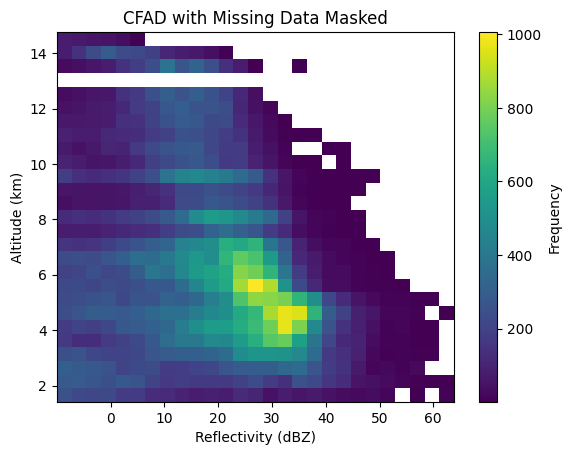

In [81]:
import numpy.ma as ma

cfad_masked = ma.masked_where(cfad_4sip == 0, cfad_4sip)

plt.imshow(cfad_masked.T, origin='lower', aspect='auto',
           extent=[dbz_4sip_bins[0], dbz_4sip_bins[-1],
                   alt_4sip_bins[0], alt_4sip_bins[-1]],
           cmap='viridis')
plt.colorbar(label='Frequency')
plt.xlabel('Reflectivity (dBZ)')
plt.ylabel('Altitude (km)')
plt.title('CFAD with Missing Data Masked')
plt.show()


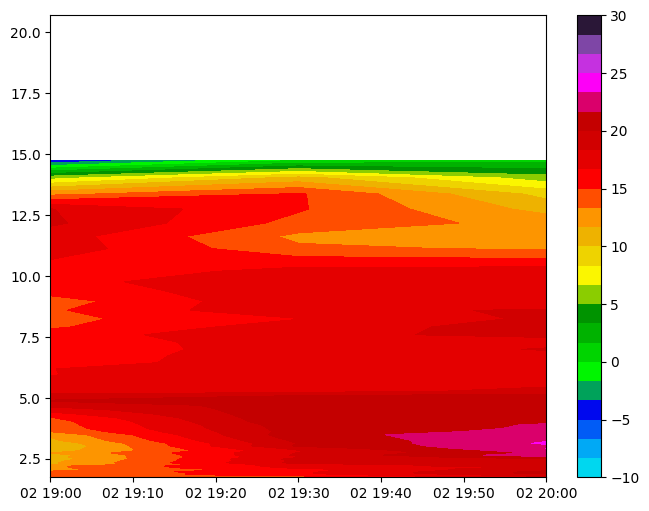

In [168]:


filt_4sip_refl = ds_4sip_filt.dbz.where((ds_4sip_filt.dbz) > -10., np.nan).mean(dim=('ncells'))
lev=np.linspace(-10,30,25)
plt.figure(figsize=(8,6))
plt.contourf(ds_4sip_filt.time, 1.e-3*ds_4sip_filt.z_mc.mean(dim=('time','ncells')), filt_4sip_refl.T, cmap='pyart_NWSRef', levels=lev)
plt.colorbar()

In [149]:

#dbz_4sip_bins = np.arange(-10, 81, 3)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_4sip_bins = np.arange(0, 17.1, 0.1)

print(dbz_4sip_bins.shape, alt_4sip_bins.shape)
print(np.max(alt_4sip_flat))

(31,) (17,)
15.553421


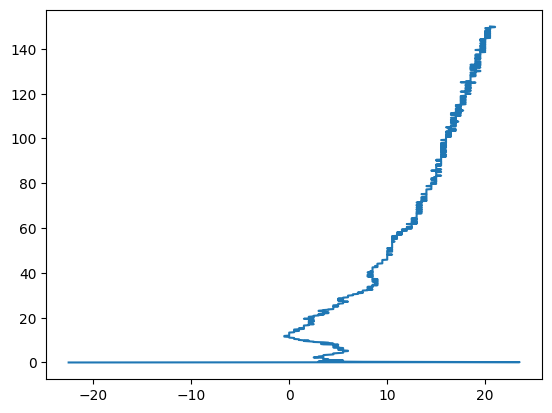

In [21]:

#plt.plot(med_filt_refl_obs, mean_alt_km_obs, 'k-', linewidth=ln, label='Median')
plt.plot(ds_rhi.DBZ.median('time'), 1.e-3*ds_rhi.range)

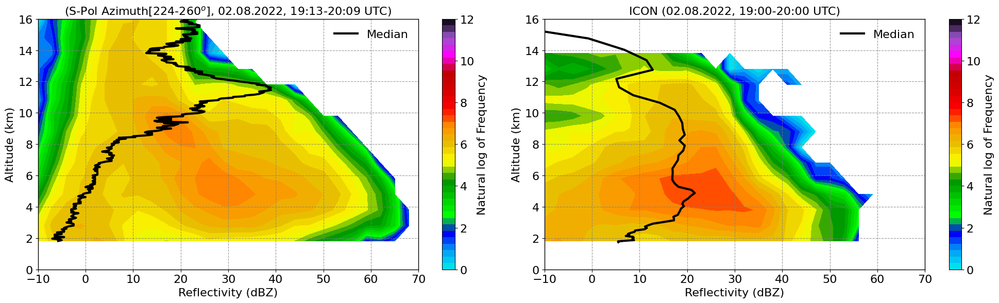

In [150]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

######### Observation ##########
#med_refl_obs = filt_refl.median('time')
#mean_alt_km_obs = alt_km.mean(axis=0)

#med_refl_obs[mean_alt_km_obs < 2.] = np.nan

mask_obs = alt_bins[:-1] < 1.8  # Create a boolean mask based on alt_bins

# Set cfad_4sip values to NaN for alt_bins < 1.1
cfad[:, mask_obs] = np.nan
################################

######### ICON ##########
med_refl_4sip = filt_refl_4sip.median(dim=('time','ncells'))
mean_alt_km_4sip = alt_4sip_km.mean(dim=('time','ncells'))

#med_refl_4sip[mean_alt_km_4sip < 2.] = np.nan

#med_refl_4sip = xr.where(mean_alt_km_4sip > 0.5, med_refl_4sip, np.nan)

cfad_4sip_masked = cfad_4sip.copy()

# Set rows to NaN where alt_4sip_bins < 2
#cfad_4sip_masked[:,alt_4sip_bins[:-1] < 1.5] = np.nan
################################

ln=3
fnt=16
lev=np.linspace(0,12,40)
#lev=np.linspace(0,0.4,40)
# 7. Plot CFAD
plt.figure(figsize=(20, 6))
plt.style.use('default')

plt.subplot(1,2,1)
#X, Y = np.meshgrid(dbz_bins, alt_bins)
#pcm = plt.pcolormesh(X, Y, np.log(cfad.T), cmap='pyart_NWSRef', shading='auto')


pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], cfad_norm.T, cmap='pyart_NWSRef', levels=lev)  # altitude is adjusted to match the actual  
                                                                                                      # station (34.022°N, 106.89°W) altitude (~1.1 km) 
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='HomeyerRainbow', levels=lev)

plt.plot(med_filt_refl_obs, mean_alt_km_obs, 'k-', linewidth=ln, label='Median')
#plt.plot(ds_rhi.DBZ.median('time'), 1.e-3*ds_rhi.range, 'k-', linewidth=ln, label='Median')

plt.xlabel('Reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('(S-Pol Azimuth[224-260$^{o}$], 02.08.2022, 19:13-20:09 UTC)', fontsize=fnt)
cbar = plt.colorbar(pcm, ticks=[0, 2, 4, 6, 8, 10, 12])#, label='Natural log of Frequency')
#cbar = plt.colorbar(pcm, ticks=[0, 0.1, 0.2, 0.3, 0.4])
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

plt.ylim(0, 16)
plt.xlim(-10, 70)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle='--', color='grey', alpha=0.8)
plt.legend(frameon=False, loc='best', fontsize=fnt)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#X, Y = np.meshgrid(dbz_bins, alt_bins)
#pcm = plt.pcolormesh(X, Y, np.log(cfad.T), cmap='pyart_NWSRef', shading='auto')


pcm = plt.contourf(dbz_4sip_bins[:-1], alt_4sip_bins[:-1], np.log(cfad_4sip.T), cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_4sip_bins[:-1], alt_4sip_bins[:-1], cfad_4sip_norm.T, cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='HomeyerRainbow', levels=lev)

#plt.plot(filt_refl_4sip.median(dim=('time','ncells')), alt_4sip_km.mean(dim=('time','ncells')), 'k-', linewidth=ln, label='Median')

plt.plot(med_refl_4sip, mean_alt_km_4sip, 'k-', linewidth=ln, label='Median')

#plt.plot(np.median(cfad_4sip, axis=1), alt_4sip_bins[:-1], 'k-', linewidth=ln, label='Median')

plt.xlabel('Reflectivity (dBZ)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('ICON (02.08.2022, 19:00-20:00 UTC)', fontsize=fnt)
cbar = plt.colorbar(pcm, ticks=[0, 2, 4, 6, 8, 10, 12])#, label='Natural log of Frequency')
#cbar = plt.colorbar(pcm, ticks=[0, 0.1, 0.2, 0.3, 0.4])
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

plt.ylim(0, 16)
plt.xlim(-10, 70)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.grid(True, linestyle='--', color='grey', alpha=0.8)
plt.legend(frameon=False, loc='best', fontsize=fnt)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()


In [160]:
cfad_4sip.shape
refl_4sip_flat.shape

(1167289,)

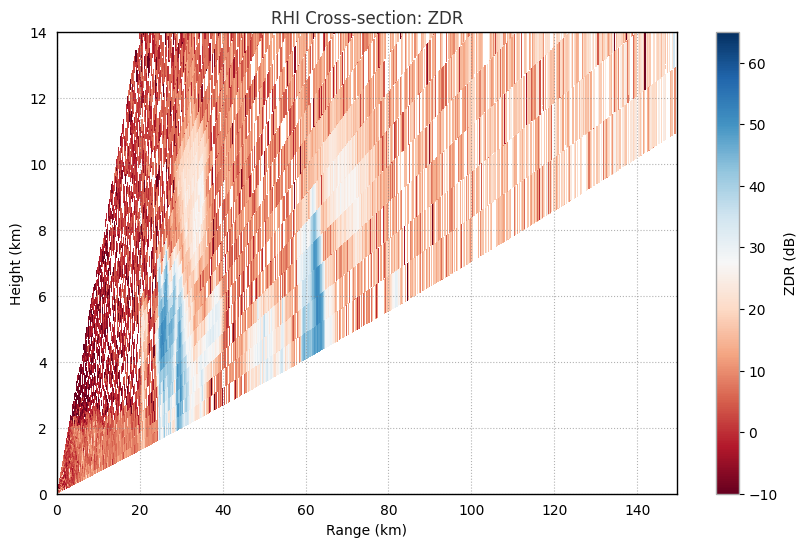

In [107]:
import pyart
import matplotlib.pyplot as plt

# Load your radar file (CfRadial format)
file_path = '/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

radar = pyart.io.read_cfradial(f'{file_path}/cfrad.20220802_195813.915_to_20220802_195819.506_SR1_v13_s01_az225.50_RHI.nc')

display = pyart.graph.RadarDisplay(radar)

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)
display.plot_rhi(
    'DBZ',      # Field name to plot
    sweep=0,    # Which sweep (RHI scan) to plot
    ax=ax,
    cmap='RdBu',
    colorbar_label='ZDR (dB)'
)

#plt.xlim(0,140)
plt.ylim(0,14)
plt.xlabel('Range (km)')
plt.ylabel('Height (km)')
plt.title('RHI Reflectivity')
#plt.colorbar()#ticks=[0,10,20,30,40,50,60], label='dBZ')

plt.grid(True, linestyle=':', color='grey', alpha=0.6)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
plt.title('RHI Cross-section: ZDR')
plt.show()


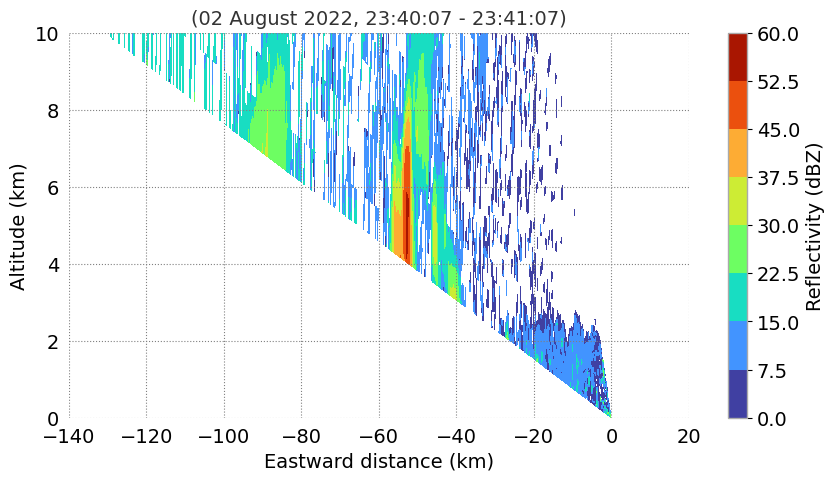

In [79]:



file_path='/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'
ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195346.335_to_20220802_195351.782_SR1_v11_s05_az254.50_RHI.nc');
#ds_rhi = xr.open_mfdataset(f'{file_path}/cfrad.20000619_234058.267_to_20000619_234107.667_SPOL_RHI.nc');

ds_rhi['refl'] = xr.where(ds_rhi.DBZ > 0., ds_rhi.DBZ, np.nan)
 
## Need to convert radar data from polar to cartesian coordinate to plot properly 

## To plot range-height plot, convert data into horizontal distance and height from ds.range and ds.elevation 

# Get azimuth and range, convert to radians and km

theta_elev = ds_rhi['elevation'].values             # shape: (elevation,)
range_gate = ds_rhi['range'].values * 1e-3     # convert m to km, shape: (range,)
theta = np.deg2rad(theta_elev)                # radians


# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
hor_dist = r_grid * np.cos(theta_grid)            # horizontal distance (km)
height = r_grid * np.sin(theta_grid)            # height (km)

lev = np.linspace(0, 60, 9)
cont_lev = range(0, 51, 10)
fontsize=14
# Plotting
plt.figure(figsize=(10, 5))
cont = plt.contourf(-1*hor_dist, height, ds_rhi.refl, cmap='turbo', levels=lev, shading='auto')

#contour=plt.contour(-1*hor_dist, height, ds_rhi.refl, levels=cont_lev, colors='k', linestyles='-', linewidths=0.5)
#plt.clabel(contour, inline=True, fontsize=fontsize-2, fmt='%d')

plt.grid(True, linestyle=':', color='grey', alpha=1.0)
plt.xlim(-140, 20)
plt.ylim(0, 10)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Eastward distance (km)', fontsize=fontsize)
plt.ylabel('Altitude (km)', fontsize=fontsize)
plt.title('(02 August 2022, 23:40:07 - 23:41:07)', fontsize=fontsize)
cb=plt.colorbar(cont)#, ticks=[0, 5, 10, 15, 20, 25, 30, 35, 40], label='Reflectivity (dBZ)')
cb.ax.tick_params(labelsize=fontsize)
cb.set_label(label='Reflectivity (dBZ)', size=fontsize)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)

#plt.tight_layout()
plt.show()

In [32]:

ds_rhi

<xarray.Dataset> Size: 2MB
Dimensions:                           (frequency: 1, sweep: 1, r_calib: 1,
                                       time: 40, range: 1001)
Coordinates:
  * frequency                         (frequency) float32 4B 5.593e+09
  * time                              (time) datetime64[ns] 320B 2022-08-02T1...
  * range                             (range) float32 4kB 0.0 150.0 ... 1.5e+05
Dimensions without coordinates: sweep, r_calib
Data variables: (12/136)
    volume_number                     float64 8B ...
    platform_type                     |S32 32B ...
    primary_axis                      |S32 32B ...
    status_xml                        |S1 1B ...
    instrument_type                   |S32 32B ...
    radar_antenna_gain_h              float32 4B ...
    ...                                ...
    KDP                               (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    PHIDP                             (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    SQI                               (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    RHOHV                             (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    DBZV                              (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
    refl                              (time, range) float32 160kB dask.array<chunksize=(40, 1001), meta=np.ndarray>
Attributes: (12/25)
    Conventions:          CF-1.7
    Sub_conventions:      CF-Radial instrument_parameters radar_parameters ra...
    version:              CF-Radial-1.4
    title:                RHI_DCM
    institution:          
    references:           Conversi
    ...                   ...
    site_name:            SR1
    scan_name:            
    scan_id:              0
    platform_is_mobile:   false
    n_gates_vary:         false
    ray_times_increase:   true

In [49]:

print(ds_px1000.Intensity.min().values, ds_px1000.Intensity.max().values)

-99900.0 58.67634


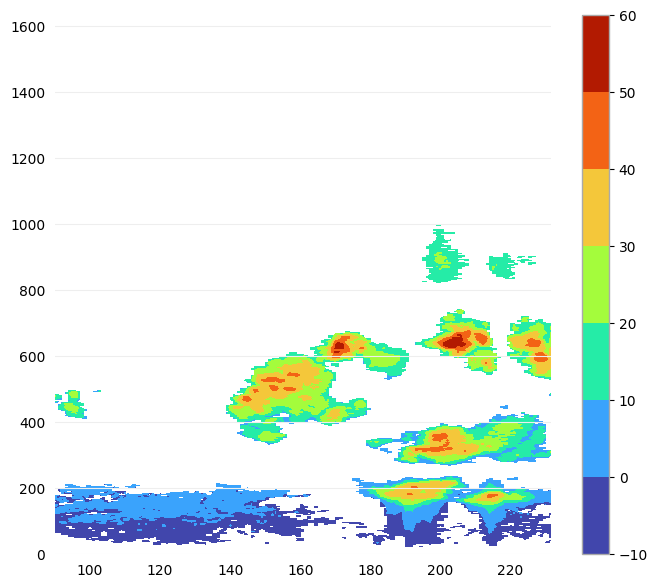

In [55]:

file_path='/work/bk1415/b382718/output/dcmex/observations/radar_px1000/DCMEX/PX-1000/data/20220802';
ds_px1000 = xr.open_mfdataset(f'{file_path}/PX-20220802-194730-E9.6/PX-20220802-194730-E9.6-Z.nc');

filt_refl = xr.where(ds_px1000.Intensity > -10., ds_px1000.Intensity, np.nan)
plt.contourf(ds_px1000.Azimuth, ds_px1000.Gate, filt_refl.T, cmap='turbo')
plt.colorbar()

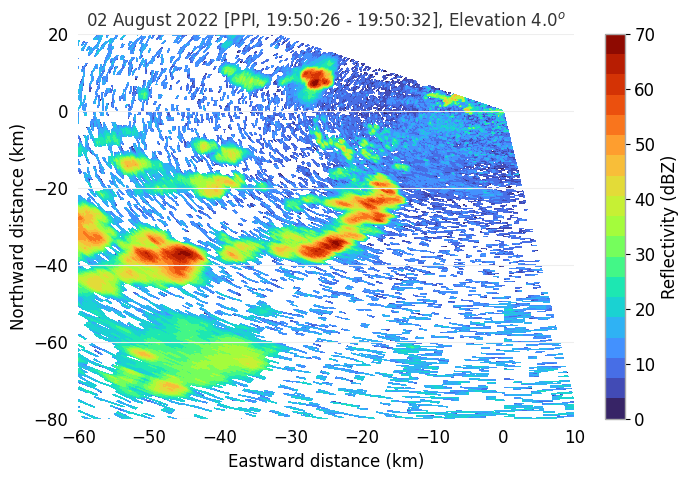

In [74]:

file_path='/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802'

#ds_ppi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195005.995_to_20220802_195011.870_SR1_v10_s00_el1.60_PPI.nc');
ds_ppi = xr.open_mfdataset(f'{file_path}/cfrad.20220802_195026.400_to_20220802_195032.295_SR1_v10_s03_el4.00_PPI.nc');

ds_ppi['refl'] = xr.where(ds_ppi.DBZ > 0., ds_ppi.DBZ, np.nan)

# Get azimuth and range, convert to radians and km
azimuth = ds_ppi['azimuth'].values             # shape: (azimuth,)
range_gate = ds_ppi['range'].values * 1e-3     # convert m to km, shape: (range,)
theta = np.deg2rad(azimuth)                # radians

# 2D grids for (azimuth, range)
r_grid, theta_grid = np.meshgrid(range_gate, theta)

# Convert polar to Cartesian
eastward_dist = r_grid * np.sin(theta_grid)            # eastward (km)
northward_dist = r_grid * np.cos(theta_grid)            # northward (km)


lev = np.linspace(0, 70, 20)
cont_lev = range(0, 51, 10)
fontsize=12


# Plotting
plt.figure(figsize=(8, 5))

cont = plt.contourf(eastward_dist, northward_dist, ds_ppi.refl, cmap='turbo', levels=lev, shading='auto')

#contour=plt.contour(eastward_dist, northward_dist, ds_ppi.refl, levels=cont_lev, colors='k', linestyles='-', linewidths=0.5)
#plt.clabel(contour, inline=True, fontsize=fontsize-2, fmt='%d')

plt.xlim(-60, 10)
plt.ylim(-80, 20)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Eastward distance (km)', fontsize=fontsize)
plt.ylabel('Northward distance (km)', fontsize=fontsize)
plt.title('02 August 2022 [PPI, 19:50:26 - 19:50:32], Elevation 4.0$^{o}$', fontsize=fontsize)
cb=plt.colorbar(cont, ticks=[0, 10, 20, 30, 40, 50, 60, 70], label='Reflectivity (dBZ)')
cb.ax.tick_params(labelsize=fontsize)
cb.set_label(label='Reflectivity (dBZ)', size=fontsize)

#plt.tight_layout()
plt.show()

In [43]:

def calc_dewpoint(tempc, rh):
    dewpoint = tempc - ((100. - rh)/5.)
    return dewpoint


def calc_tdew(t, rh):        # Magnus-Tetens approximation
    a = 17.27; b = 237.7;
    alpha = (a*t/(b+t)) + np.log(rh/100)
    td = b*alpha/(a-alpha)
    return td
    
def calc_vir_temp(tc, q):
    #virt_tempk_wk = t/(1. - (ev/p)*(1-0.622))
    temp = tc + (1-0.622*q)
    return temp
    
def calculate_lcl(pressure, temperature, dewpoint):
    l = np.argmin(np.abs(temperature - dewpoint))
    return pressure[l], temperature[l]

def calc_lcl(t, td):
    lcl = td + 125.*(t-td)
    return lcl
    
def e_sat_hpa(tc):
    e_sat_pa = 6.112*np.exp((17.67*tc)/(tc+243.5))
    return e_sat_pa

def calc_parcel_temp(pres, ht, q_sat, tk_lcl):
    grav = 9.8  # acceleration due to gravity [m/s^2]
    eps = 0.622  # ratio of the gas constants for water vapor and dry air
    Rd = 287.  # specific gas constant for dry air [J/(kg*K)]
    cp = 1005.  # specific heat capacity at constant pressure for dry air [J/(kg*K)]
    lv = 2.5e6  # latent heat of vaporization [J/kg]
    Rv = 461.  # specific gas constant for water vapor [J/(kg*K)]

    tk_parcel = np.zeros(len(ht))  
    del_t_par = np.zeros(len(ht))  

    tk_parcel[0] = tk_lcl + 273.15 
    
    for i in range(1, len(ht)):
        dht = ht[i] - ht[i - 1]  
        qs = q_sat[i]  
        term_a = 1. + lv * qs / (Rd * tk_parcel[i - 1])
        term_b = (lv ** 2.) * eps * qs
        term_c = Rd * (tk_parcel[i - 1]) ** 2.
        
        del_t_par[i] = grav * term_a / (cp + (term_b / term_c))

        tk_parcel[i] = tk_parcel[i - 1] - del_t_par[i] * dht
        
    tempc = tk_parcel - 273.15
    return tempc

import numpy as np



def calc_cape(pres, t_env, t_par, tv_env, tv_par):
    """
    Calculate Convective Available Potential Energy (CAPE).
    
    Parameters:
        pres (array): Pressure levels (hPa or Pa).
        t_env (array): Environmental temperature (°C).
        t_par (array): Parcel temperature (°C).
        tv_env (array): Environmental virtual temperature (°C).
        tv_par (array): Parcel virtual temperature (°C).
    
    Returns:
        cape (float): CAPE value (J/kg).
    """
    Rd = 287.0  # gas constant for dry air (J/kg/K)
    
    # Convert temperatures to Kelvin
    tk_env = t_env + 273.15
    tk_v_env = tv_env + 273.15
    tk_par = t_par + 273.15
    tk_v_par = tv_par + 273.15
    
    cape = 0.0
    
    # Loop through pressure levels
    for i in range(1, len(pres)):
        # Check if parcel is warmer than the environment
        if tk_v_par[i] > tk_v_env[i]:
            # Calculate logarithmic pressure difference
            dlnp = np.log(pres[i-1] / pres[i])
            cape = cape + Rd * (tk_v_par[i] - tk_v_env[i]) * dlnp
    return cape
        

In [27]:
ds_4sip.time[26]

<xarray.DataArray 'time' ()> Size: 8B
array('2022-08-02T13:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2022-08-02T13:00:00
Attributes:
    standard_name:  time
    axis:           T

In [30]:
print(lcl_temp)

19.04552


CAPE ::  758.2569710314941


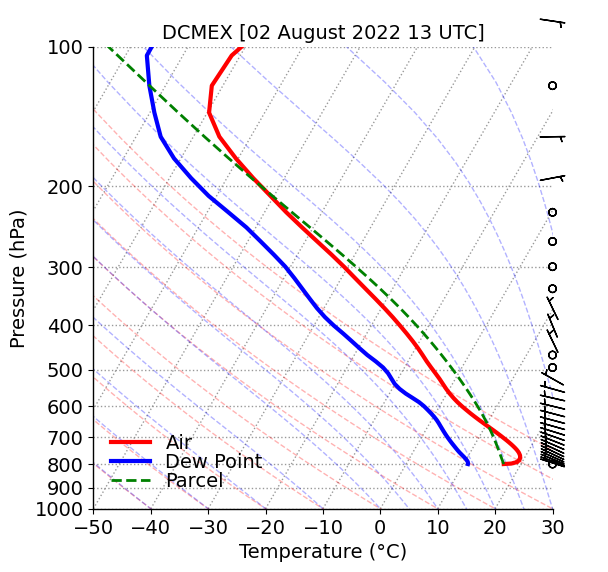

In [29]:

ds_skewt = ds_4sip.sel(time=ds_4sip.time[26])

tempc = ds_skewt.temp-273.15 #.values
pres_pa = ds_skewt.pres #.values
ht_m = ds_skewt.z_mc
rel_hum = ds_skewt.rh #.values
u_wind = ds_skewt.u
v_wind = ds_skewt.v
q_vap = ds_skewt.qv

   
temp_dew = calc_dewpoint(tempc, rel_hum)
#temp_dew = calc_tdew(tempc, rel_hum)

avg_tempc = tempc.mean(dim=('ncells')).values
avg_dewtempc = temp_dew.mean(dim=('ncells')).values
avg_pres = 0.01*pres_pa.mean(dim=('ncells')).values
avg_ht = ht_m.mean(dim=('ncells')).values
avg_rh = rel_hum.mean(dim=('ncells')).values
avg_qv = q_vap.mean(dim=('ncells')).values

avg_u = u_wind.mean(dim=('ncells')).values
avg_v = v_wind.mean(dim=('ncells')).values

avg_tempc = avg_tempc[::-1]
avg_dewtempc = avg_dewtempc[::-1]
avg_pres = avg_pres[::-1]
avg_ht = avg_ht[::-1]
avg_rh = avg_rh[::-1]
avg_u = avg_u[::-1]
avg_v = avg_v[::-1]
avg_qv = avg_qv[::-1]

#----- Calculate parcel properties
e_sat = e_sat_hpa(avg_tempc)
q_sat = 0.622*e_sat/(avg_pres-e_sat)

lcl_pressure, lcl_temp = calculate_lcl(avg_pres, avg_tempc, avg_dewtempc)
#lcl_temp = calc_lcl(avg_tempc[0], avg_dewtempc)
parcel_temp = calc_parcel_temp(avg_pres, avg_ht, q_sat, lcl_temp)
Tv_env = calc_vir_temp(avg_tempc, avg_qv)
Tv_parcel = calc_vir_temp(parcel_temp, q_sat)
parcel_cape = calc_cape(avg_pres, avg_tempc, parcel_temp, Tv_env, Tv_parcel)
print('CAPE :: ',parcel_cape)
#------

# Create the Skew-T plot
fontsize=14;
lnwdth=3;
alpha=0.3;

fig = plt.figure(figsize=(8, 6))
skew = SkewT(fig)

# Plot temperature and dew point on the Skew-T
skew.plot(avg_pres, avg_tempc, 'r-', label='Air', linewidth=lnwdth)
#skew.plot(avg_pres, calc_dewpoint(avg_tempc, avg_rh), 'b-.', label='Dew Point', linewidth=lnwdth)
skew.plot(avg_pres, avg_dewtempc, 'b-', label='Dew Point', linewidth=lnwdth)
skew.plot(avg_pres, parcel_temp, 'g--', label='Parcel', linewidth=lnwdth-1)
# Add wind barbs 
if 'u' in ds_skewt and 'v' in ds_skewt:
    u_wind = avg_u  # Zonal wind component
    v_wind = avg_v  # Meridional wind component
    skew.plot_barbs(avg_pres[::2], u_wind[::2], v_wind[::2], length=6, color='black', pivot='middle')

# Add the dry and moist adiabats to the plot
skew.plot_dry_adiabats(linewidth=1, alpha=alpha)
skew.plot_moist_adiabats(linewidth=1, alpha=alpha)

ax = skew.ax
ax.set_xlabel('Temperature (°C)', fontsize=fontsize)
ax.set_ylabel('Pressure (hPa)', fontsize=fontsize)
ax.set_xlim(-50, 30)
ax.set_ylim(1000., 100)
ax.tick_params(axis='x', labelsize=fontsize)
ax.tick_params(axis='y', labelsize=fontsize)
plt.title('DCMEX [02 August 2022 13 UTC]', fontsize=fontsize)

plt.legend(frameon=False, handlelength=2, labelspacing=0.01, fontsize=fontsize, loc='lower left')
plt.grid(True, linestyle=':', linewidth=1., color='grey', alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.show()

In [33]:
ds_sonde

<xarray.Dataset>
Dimensions:         (time: 1621, obs: 1)
Coordinates:
  * time            (time) datetime64[ns] 2022-08-02T15:59:46.390014648 ... 2...
    lat             (time) float32 ...
    lon             (time) float32 ...
    gpsalt          (time) float32 ...
Dimensions without coordinates: obs
Data variables: (12/27)
    trajectory      |S1 ...
    launch_time     datetime64[ns] ...
    pres            (time) float32 746.5 746.2 nan 746.3 nan ... nan nan nan nan
    tdry            (time) float32 nan nan nan nan nan ... nan nan nan nan nan
    dp              (time) float32 nan nan nan nan nan ... nan nan nan nan nan
    rh              (time) float32 nan nan nan nan nan ... nan nan nan nan nan
    ...              ...
    reference_rh    (obs) float32 ...
    reference_wspd  (obs) float32 ...
    reference_wdir  (obs) float32 ...
    reference_lat   (obs) float32 ...
    reference_lon   (obs) float32 ...
    reference_alt   (obs) float32 ...
Attributes: (12/93)
    Conventions:            CF-1.6
    RepoRevision:           V3.4.6
    RepoLastChangedDate:    Fri Apr 30 16:17:27 2021 -0600
    RepoId:                 163b1128fa837a96c93dfe8a59c915ff3185b748
    RepoBranch:             HEAD
    featureType:            trajectory
    ...                     ...
    WindQCDev:              999
    WindQCWL:               30
    WindSats:               6
    WindSmoothWL:           10
    WindVVPresWL:           5
    WindVVdelta:            2.5

CAPE ::  0.0


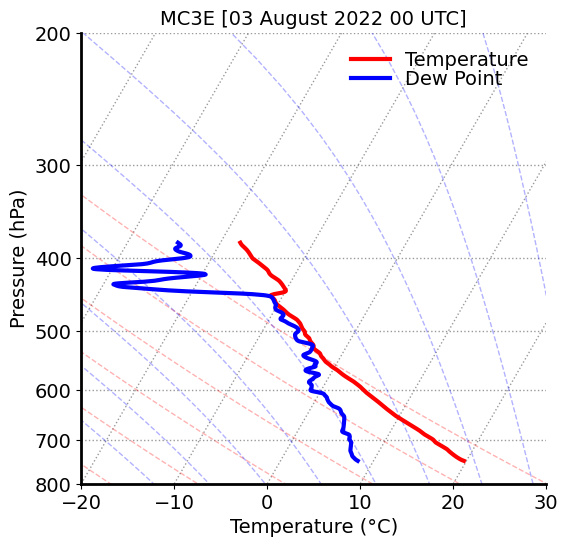

In [57]:

ds_sonde = xr.open_dataset('/work/bb1163/b382718/output/dcmex/observations/aircraft_data/20220802/faam-dropsonde_faam_20220802155302_r0_c310_proc.nc');

pres_sonde = ds_sonde.pres.values
tdry_sonde = ds_sonde.tdry.values
tdew_sonde = ds_sonde.dp.values
rh_sonde   = ds_sonde.rh.values
th_e_sonde = ds_sonde.theta_e.values
th_v_sonde = ds_sonde.theta_v.values
qv_sonde = ds_sonde.mr.values
ht_sonde = ds_sonde.alt.values

valid_indices = ~np.isnan(tdry_sonde) & ~np.isnan(ht_sonde) & ~np.isnan(qv_sonde) & ~np.isnan(rh_sonde) & ~np.isnan(tdew_sonde) & ~np.isnan(pres_sonde)

# Filter the data to remove NaN values
pres_sonde = pres_sonde[valid_indices]
tdry_sonde = tdry_sonde[valid_indices]
tdew_sonde = tdew_sonde[valid_indices]
rh_sonde = rh_sonde[valid_indices]
qv_sonde = qv_sonde[valid_indices]
ht_sonde = ht_sonde[valid_indices]

#qv_sonde = 1.e-3*qv_sonde # g kg-1 to kg kg-1
#----- Calculate parcel properties
e_sat = e_sat_hpa(tdry_sonde)
q_sat = 0.622*e_sat/(pres_sonde-e_sat)
qv_sonde = rh_sonde*q_sat

lcl_pressure, lcl_temp = calculate_lcl(pres_sonde, tdry_sonde, tdew_sonde)
parcel_temp = calc_parcel_temp(pres_sonde, ht_sonde, q_sat, lcl_temp)
Tv_env = calc_vir_temp(tdry_sonde, qv_sonde)
Tv_parcel = calc_vir_temp(parcel_temp, q_sat)
parcel_cape = calc_cape(pres_sonde, tdry_sonde, parcel_temp, Tv_env, Tv_parcel)
print('CAPE :: ',parcel_cape)
#------

# Create the Skew-T plot
fontsize=14;
lnwdth=3;
alpha=0.3;

fig = plt.figure(figsize=(6, 8))
skew = SkewT(fig)

# Plot temperature and dew point on the Skew-T
skew.plot(pres_sonde, tdry_sonde, 'r-', label='Temperature', linewidth=lnwdth)
skew.plot(pres_sonde, tdew_sonde, 'b-', label='Dew Point', linewidth=lnwdth)
#skew.plot(pres_sonde, qv_sonde, 'g-', label='Dew Point', linewidth=lnwdth)
#skew.plot(pres_sonde, parcel_temp, 'g--', label='Parcel', linewidth=lnwdth-1)
# Add wind barbs 
#if 'u' in ds_skewt and 'v' in ds_skewt:
#    u_wind = avg_u  # Zonal wind component
#    v_wind = avg_v  # Meridional wind component
#    skew.plot_barbs(avg_pres, u_wind, v_wind, length=6, color='black')

# Add the dry and moist adiabats to the plot
skew.plot_dry_adiabats(linewidth=1, alpha=alpha)
skew.plot_moist_adiabats(linewidth=1, alpha=alpha)

ax = skew.ax
ax.set_xlabel('Temperature (°C)', fontsize=fontsize)
ax.set_ylabel('Pressure (hPa)', fontsize=fontsize)
ax.set_xlim(-20, 30)
ax.set_ylim(800., 200)
ax.tick_params(axis='x', labelsize=fontsize)
ax.tick_params(axis='y', labelsize=fontsize)
plt.title('MC3E [03 August 2022 00 UTC]', fontsize=fontsize)

plt.legend(frameon=False, handlelength=2, labelspacing=0.01, fontsize=fontsize, loc='upper right')
plt.grid(True, linestyle=':', linewidth=1., color='grey', alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()

In [28]:
print(ds_4sip.time[24])

<xarray.DataArray 'time' ()>
array('2022-08-02T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2022-08-02T12:00:00
Attributes:
    standard_name:  time
    axis:           T


In [36]:

ds_skewt = ds_4sip.sel(time=ds_4sip.time[1])

#print(ds_4sip.time[24])
print(ds_4sip.time[3])

tempc = ds_skewt.temp-273.15 #.values
pres_pa = ds_skewt.pres #.values
ht_m = ds_skewt.z_mc
rel_hum = ds_skewt.rh #.values
u_wind = ds_skewt.u
v_wind = ds_skewt.v
q_vap = ds_skewt.qv

   
temp_dew = calc_dewpoint(tempc, rel_hum)
#temp_dew = calc_tdew(tempc, rel_hum)

avg_tempc = tempc.mean(dim=('ncells')).values
avg_dewtempc = temp_dew.mean(dim=('ncells')).values
avg_pres = 0.01*pres_pa.mean(dim=('ncells')).values
avg_ht = ht_m.mean(dim=('ncells')).values
avg_rh = rel_hum.mean(dim=('ncells')).values
avg_qv = q_vap.mean(dim=('ncells')).values

avg_u = u_wind.mean(dim=('ncells')).values
avg_v = v_wind.mean(dim=('ncells')).values

avg_tempc = avg_tempc[::-1]
avg_dewtempc = avg_dewtempc[::-1]
avg_pres = avg_pres[::-1]
avg_ht = avg_ht[::-1]
avg_rh = avg_rh[::-1]
avg_u = avg_u[::-1]
avg_v = avg_v[::-1]
avg_qv = avg_qv[::-1]

#----- Calculate parcel properties
e_sat = e_sat_hpa(avg_tempc)
q_sat = 0.622*e_sat/(avg_pres-e_sat)

lcl_pressure, lcl_temp = calculate_lcl(avg_pres, avg_tempc, avg_dewtempc)
#lcl_temp = calc_lcl(avg_tempc[0], avg_dewtempc)
parcel_temp = calc_parcel_temp(avg_pres, avg_ht, q_sat, lcl_temp)
Tv_env = calc_vir_temp(avg_tempc, avg_qv)
Tv_parcel = calc_vir_temp(parcel_temp, q_sat)
parcel_cape = calc_cape(avg_pres, avg_tempc, parcel_temp, Tv_env, Tv_parcel)
print('CAPE :: ',parcel_cape)
print('LCL  :: ', lcl_temp)
#------

<xarray.DataArray 'time' ()> Size: 8B
array('2022-08-02T01:30:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2022-08-02T01:30:00
Attributes:
    standard_name:  time
    axis:           T
CAPE ::  0.0
LCL  ::  5.8168063


CAPE ::  1021.1269912698493


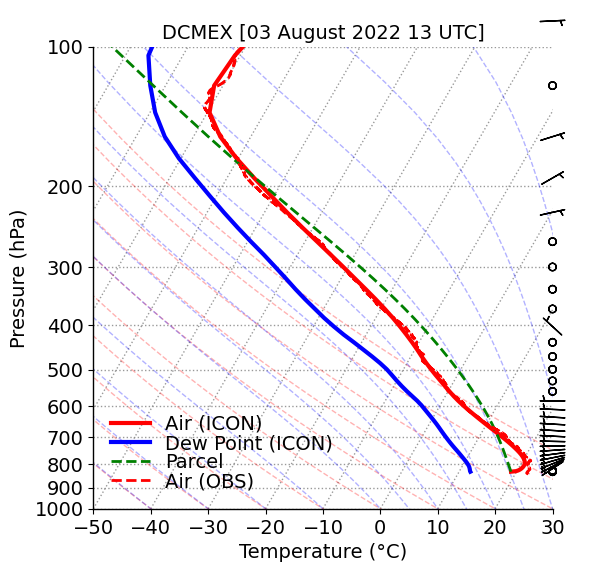

In [61]:

file_path = '/work/bk1415/b382718/output/dcmex/observations/wyoming_sonde/sonde_dcmex_20220802_1200UTC'
column_names = ['pres', 'height', 'temp', 'Tdew', 'relhum', 'qv', 'w_dir', 'w_wind', 'theta', 'theta_e', 'theta_v']


# Specify invalid values (strings or other markers for missing data)
invalid_values = ['-----------------------------------------------------------------------------', '9999.0', '999.0']

# Read the data and replace invalid values with NaN
ds_sonde = pd.read_csv(file_path, sep='\s+', skiprows=6, names=column_names, na_values=invalid_values)

ds_sonde.dropna(inplace=True)

temp_sonde = ds_sonde.temp.values
pres_sonde = ds_sonde.pres.values
tdew_sonde = ds_sonde.Tdew.values
rh_sonde = ds_sonde.relhum.values
qv_sonde = ds_sonde.qv.values
w_sonde = ds_sonde.w_wind.values
ht_sonde = ds_sonde.height.values

print('CAPE :: ', parcel_cape)
#----- Calculate parcel properties
#e_sat = e_sat_hpa(temp_sonde)
#q_sat = 0.622*e_sat/(pres_sonde-e_sat)
#qv_sonde = rh_sonde*q_sat

#lcl_pressure, lcl_temp = calculate_lcl(pres_sonde, temp_sonde, tdew_sonde)
#parcel_temp = calc_parcel_temp(pres_sonde, ht_sonde, q_sat, lcl_temp)
#Tv_env = calc_vir_temp(tdry_sonde, qv_sonde)
#Tv_parcel = calc_vir_temp(parcel_temp, q_sat)
#parcel_cape = calc_cape(pres_sonde, temp_sonde, parcel_temp, Tv_env, Tv_parcel)
#print('CAPE :: ',parcel_cape)
#------

# Create the Skew-T plot
fontsize=14;
lnwdth=3;
alpha=0.3;

fig = plt.figure(figsize=(8, 6))
skew = SkewT(fig)

skew.plot(avg_pres, avg_tempc, 'r-', label='Air (ICON)', linewidth=lnwdth)
skew.plot(avg_pres, avg_dewtempc, 'b-', label='Dew Point (ICON)', linewidth=lnwdth)
skew.plot(avg_pres, parcel_temp, 'g--', label='Parcel', linewidth=lnwdth-1)
skew.plot(pres_sonde* units.hPa, temp_sonde* units.degC, 'r--', label='Air (OBS)', linewidth=lnwdth-1)
#skew.plot(pres_sonde* units.hPa, tdew_sonde* units.degC, 'b--', label='Dew Point (OBS)', linewidth=lnwdth)

# Add wind barbs 
if 'u' in ds_skewt and 'v' in ds_skewt:
    u_wind = avg_u  # Zonal wind component
    v_wind = avg_v  # Meridional wind component
    skew.plot_barbs(avg_pres[::2], u_wind[::2], v_wind[::2], length=6, color='black', pivot='middle')

# Add the dry and moist adiabats to the plot
skew.plot_dry_adiabats(linewidth=1, alpha=alpha)
skew.plot_moist_adiabats(linewidth=1, alpha=alpha)

ax = skew.ax
ax.set_xlabel('Temperature (°C)', fontsize=fontsize)
ax.set_ylabel('Pressure (hPa)', fontsize=fontsize)
ax.set_xlim(-50, 30)
ax.set_ylim(1000., 100)
ax.tick_params(axis='x', labelsize=fontsize)
ax.tick_params(axis='y', labelsize=fontsize)
plt.title('DCMEX [03 August 2022 13 UTC]', fontsize=fontsize)

plt.legend(frameon=False, handlelength=2, labelspacing=0.01, fontsize=fontsize, loc='lower left')
plt.grid(True, linestyle=':', linewidth=1., color='grey', alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.show()


<xarray.DataArray 'time' ()> Size: 8B
array('2022-08-02T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2022-08-02
Attributes:
    standard_name:  time
    axis:           T
LCL  ::  5.900747
CAPE ::  668.5826060357914 joule / kilogram
CIN ::  -41.17653913939573 joule / kilogram


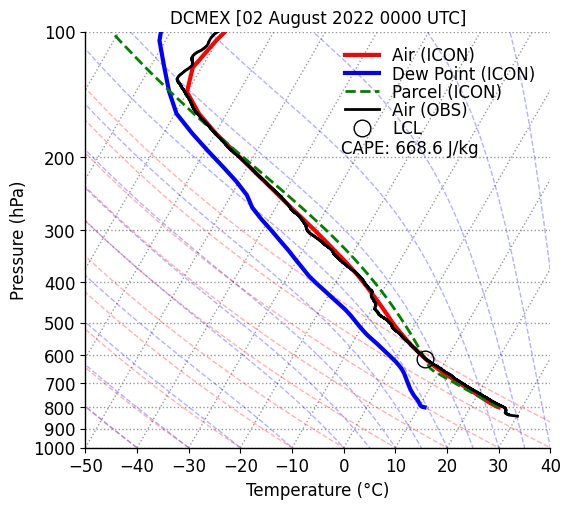

In [72]:
from metpy.calc import dewpoint_from_relative_humidity
from metpy.units import units
from metpy.calc import parcel_profile
from metpy.calc import cape_cin



### Obs
file_path = '/work/bk1415/b382718/output/dcmex/observations/wyoming_sonde/sonde_dcmex_20220802_0000UTC'
column_names = ['pres', 'height', 'temp', 'Tdew', 'relhum', 'qv', 'w_dir', 'w_wind', 'theta', 'theta_e', 'theta_v']


# Specify invalid values (strings or other markers for missing data)
invalid_values = ['-----------------------------------------------------------------------------', '9999.0', '999.0']

# Read the data and replace invalid values with NaN
ds_sonde = pd.read_csv(file_path, sep='\s+', skiprows=6, names=column_names, na_values=invalid_values)

ds_sonde.dropna(inplace=True)

temp_sonde = ds_sonde.temp.values
pres_sonde = ds_sonde.pres.values
tdew_sonde = ds_sonde.Tdew.values
rh_sonde = ds_sonde.relhum.values
qv_sonde = ds_sonde.qv.values
w_sonde = ds_sonde.w_wind.values
ht_sonde = ds_sonde.height.values
### end obs

### ICON
#ds_skewt = ds_4sip.sel(time=ds_4sip.time[3])
#ds_skewt = ds_4sip.sel(time=ds_4sip.time[0])
ds_skewt = ds_4sip.sel(time=ds_4sip.time[0])
print(ds_4sip.time[0])

tempc = ds_skewt.temp-273.15 #.values
pres_pa = ds_skewt.pres #.values
ht_m = ds_skewt.z_mc
rel_hum = ds_skewt.rh #.values
u_wind = ds_skewt.u
v_wind = ds_skewt.v
q_vap = ds_skewt.qv

temp_dew = calc_dewpoint(tempc, rel_hum)

avg_tempc = tempc.mean(dim=('ncells')).values
avg_dewtempc = temp_dew.mean(dim=('ncells')).values
avg_pres = 0.01*pres_pa.mean(dim=('ncells')).values
avg_ht = ht_m.mean(dim=('ncells')).values
avg_rh = rel_hum.mean(dim=('ncells')).values
avg_qv = q_vap.mean(dim=('ncells')).values

avg_u = u_wind.mean(dim=('ncells')).values
avg_v = v_wind.mean(dim=('ncells')).values

avg_tempc = avg_tempc[::-1]
avg_dewtempc = avg_dewtempc[::-1]
avg_pres = avg_pres[::-1]
avg_ht = avg_ht[::-1]
avg_rh = avg_rh[::-1]
avg_u = avg_u[::-1]
avg_v = avg_v[::-1]
avg_qv = avg_qv[::-1]

e_sat = e_sat_hpa(avg_tempc)
q_sat = 0.622*e_sat/(avg_pres-e_sat)

lcl_pressure, lcl_temp = calculate_lcl(avg_pres, avg_tempc, avg_dewtempc)
#lcl_temp = calc_lcl(avg_tempc[0], avg_dewtempc)
print('LCL  :: ', lcl_temp)


### Parcel properties from ICON
temperature_K = (avg_tempc + 273.15) * units.K
relative_humidity = avg_rh / 100.0  # Convert to fraction

dewpoint = dewpoint_from_relative_humidity(temperature_K, relative_humidity)
avg_dewtempc = dewpoint.magnitude #- 273.15

pressure = avg_pres * units.hPa
temperature = avg_tempc * units.degC
dewpoint = avg_dewtempc * units.degC

parcel_tempk = parcel_profile(pressure, temperature[0], dewpoint[0])  # First level
parcel_tempc = parcel_tempk.magnitude-273.15

parcel_tempc = parcel_tempc * units.degC
cape, cin = cape_cin(pressure, temperature, dewpoint, parcel_tempc)

#----- Calculate parcel properties

print('CAPE :: ', cape)
print('CIN :: ', cin)
### End parcel properties
### End ICON

# Create the Skew-T plot
fontsize=12;
lnwdth=3;
alpha=0.3;

fig = plt.figure(figsize=(6, 8))
plt.style.use('default')
skew = SkewT(fig)

# Plot temperature and dew point on the Skew-T
skew.plot(avg_pres, avg_tempc, 'r-', label='Air (ICON)', linewidth=lnwdth)
skew.plot(avg_pres, avg_dewtempc, 'b-', label='Dew Point (ICON)', linewidth=lnwdth)
skew.plot(avg_pres, parcel_tempc, 'g--', label='Parcel (ICON)', linewidth=lnwdth-1)
skew.plot(pres_sonde* units.hPa, temp_sonde* units.degC, 'k-', label='Air (OBS)', linewidth=lnwdth-1)

skew.plot(lcl_pressure, lcl_temp, 'ko', markerfacecolor='none', markersize=12, label='LCL')

# Add wind barbs 
#if 'u' in ds_skewt and 'v' in ds_skewt:
#    u_wind = avg_u  # Zonal wind component
#    v_wind = avg_v  # Meridional wind component
#    skew.plot_barbs(avg_pres[::2], u_wind[::2], v_wind[::2], length=6, color='black', pivot='middle')

# Add the dry and moist adiabats to the plot
skew.plot_dry_adiabats(linewidth=1, alpha=alpha)
skew.plot_moist_adiabats(linewidth=1, alpha=alpha)

ax = skew.ax
ax.set_xlabel('Temperature (°C)', fontsize=fontsize)
ax.set_ylabel('Pressure (hPa)', fontsize=fontsize)
ax.set_xlim(-50, 40)
ax.set_ylim(1000., 100)
ax.tick_params(axis='x', labelsize=fontsize)
ax.tick_params(axis='y', labelsize=fontsize)

#ax.text(0.02, 0.95, f'CAPE: {cape.m:.1f} J/kg\nCIN: {cin.m:.1f} J/kg', transform=ax.transAxes, fontsize=fontsize, verticalalignment='top')
ax.text(0.55, 0.74, f'CAPE: {cape.m:.1f} J/kg', transform=ax.transAxes, fontsize=fontsize, verticalalignment='top')

plt.title('DCMEX [02 August 2022 0000 UTC]', fontsize=fontsize)

plt.legend(frameon=False, handlelength=2, labelspacing=0.01, fontsize=fontsize, loc='upper right')
plt.grid(True, linestyle=':', linewidth=1., color='grey', alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.show()


In [48]:


ds_sr = xr.open_mfdataset('/work/bk1415/b382718/output/dcmex/observations/radar_sr1/DCMEX/SR1/data/20220802/cfrad.20220802*RHI.nc')



/sw/spack-levante/mambaforge-22.9.0-2-Linux-x86_64-kptncg/lib/python3.10/site-packages/xarray/core/concat.py:546: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  common_dims = tuple(pd.unique([d for v in vars for d in v.dims]))


In [52]:
ds_sr


<xarray.Dataset>
Dimensions:                           (time: 2502, frequency: 1, sweep: 1,
                                       r_calib: 1, range: 1001)
Coordinates:
  * frequency                         (frequency) float32 5.593e+09
  * time                              (time) datetime64[ns] 2022-08-02T19:13:...
  * range                             (range) float32 0.0 150.0 ... 1.5e+05
Dimensions without coordinates: sweep, r_calib
Data variables: (12/135)
    volume_number                     (time) float64 4.0 4.0 4.0 ... 17.0 17.0
    platform_type                     (time) |S32 b'fixed' b'fixed' ... b'fixed'
    primary_axis                      (time) |S32 b'axis_z' ... b'axis_z'
    status_xml                        (time) |S1 b'' b'' b'' b'' ... b'' b'' b''
    instrument_type                   (time) |S32 b'radar' b'radar' ... b'radar'
    radar_antenna_gain_h              (time) float64 nan nan nan ... nan nan nan
    ...                                ...
    ZDR                               (time, range) float32 dask.array<chunksize=(40, 1001), meta=np.ndarray>
    KDP                               (time, range) float32 dask.array<chunksize=(40, 1001), meta=np.ndarray>
    PHIDP                             (time, range) float32 dask.array<chunksize=(40, 1001), meta=np.ndarray>
    SQI                               (time, range) float32 dask.array<chunksize=(40, 1001), meta=np.ndarray>
    RHOHV                             (time, range) float32 dask.array<chunksize=(40, 1001), meta=np.ndarray>
    DBZV                              (time, range) float32 dask.array<chunksize=(40, 1001), meta=np.ndarray>
Attributes: (12/25)
    Conventions:          CF-1.7
    Sub_conventions:      CF-Radial instrument_parameters radar_parameters ra...
    version:              CF-Radial-1.4
    title:                RHI_DCM
    institution:          
    references:           Conversi
    ...                   ...
    site_name:            SR1
    scan_name:            
    scan_id:              0
    platform_is_mobile:   false
    n_gates_vary:         false
    ray_times_increase:   true

In [45]:
print(ds_sr.pressure_altitude_correction.max().values)

0.0


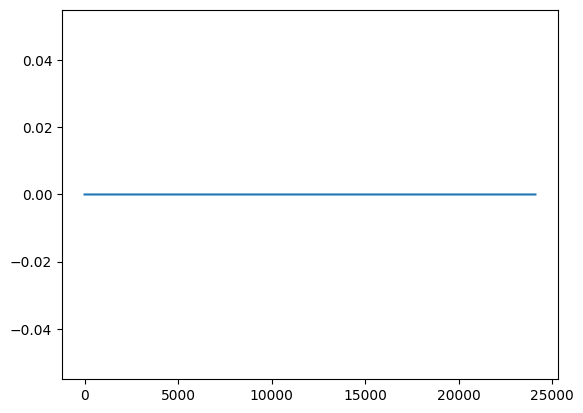

In [43]:
plt.plot(ds_sr.pressure_altitude_correction)

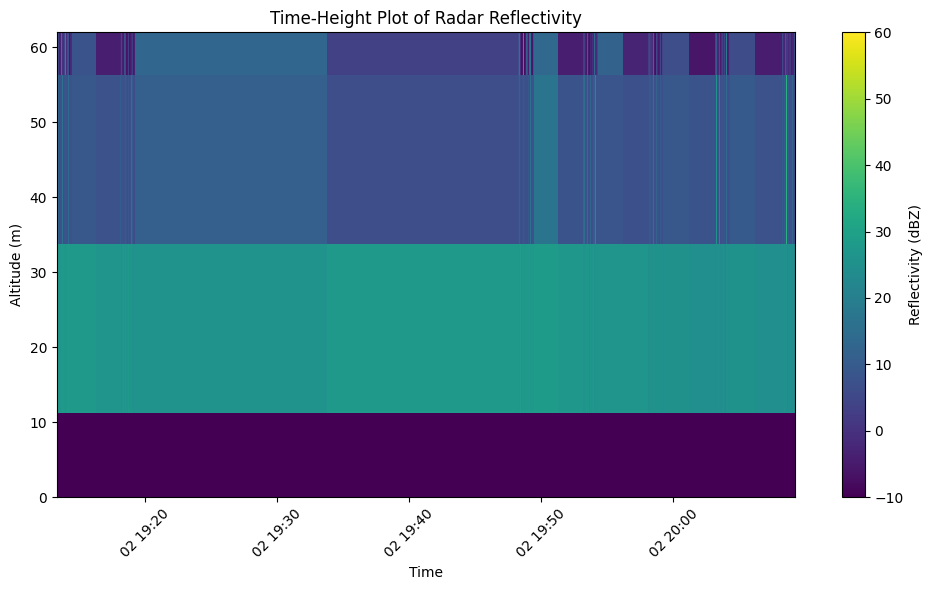

In [53]:


time = ds_sr['time']
altitude = 1.e-3*150.*ds_sr['range'] # range resolution for SMART (SR1) radar is 150 m Finney et al. (2024, Table 2)
dbz = ds_sr['DBZV']
lon = ds_sr['longitude']
lat = ds_sr['latitude']


# Create the plot
plt.figure(figsize=(10, 6))
plt.pcolormesh(time, altitude, dbz.T, shading='auto', cmap='viridis', vmin=-10, vmax=60)

# Add colorbar
cbar = plt.colorbar(label='Reflectivity (dBZ)')

plt.ylim(0, 62.)
# Labels and title
plt.xlabel('Time')
plt.ylabel('Altitude (m)')
plt.title('Time-Height Plot of Radar Reflectivity')

# Format x-axis for better time representation
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()